In [126]:
import os
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

In [127]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# # Print keys and types
# for key, value in cell_data_dict.items():
#     print("-- * * * * * --")
#     print(key, type(value))
#     for key_, value_ in value.items():
#         print(key_, type(value_))
# print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303


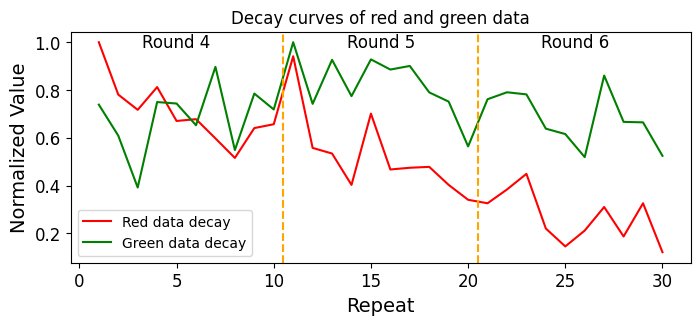

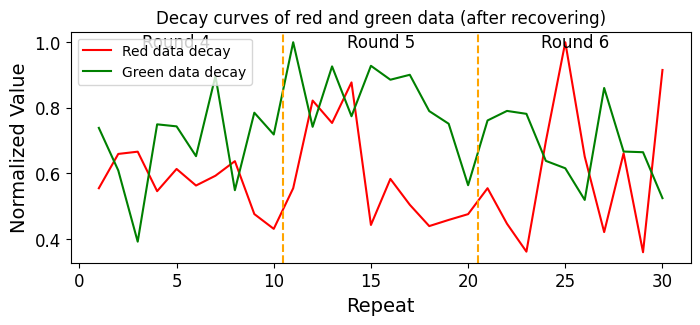

(1440, 281) 1440
(1440, 23) (23,)
(1440, 1) 1440
15.553237533160676 -5.301797778486449
3.0059820114271285 -1.504742937819609


In [128]:
cell_data = cell_data_dict['CL090_230515']
# cell_data = cell_data_dict['CL075_230303']

delete_small_group = True # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
data_axons = cell_data['axons']

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# sum green data to see the decay
sum_mat_green = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_green[0,0].shape[0], 1))
    for j in range(data_green.shape[1]):
        sum = sum + np.sum(data_green[i,j], axis=1, keepdims=True)
    # print(np.sum(sum))
    sum_mat_green[i, 0] = sum
# print(sum_mat_green)

# Normalization of green
sum_mat_green_n = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_green[i, j])))
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        element = sum_mat_green[i, j]
        sum_mat_green_n[i, j] = element / max_value
# print(sum_mat_green_n.shape)

# vstack sum_mat_green_n
stacked_sum_mat_green_n = np.empty((0, sum_mat_green_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_green_n):
    stacked_sum_mat_green_n = np.vstack((stacked_sum_mat_green_n, value))
stacked_sum_mat_green_n = np.squeeze(stacked_sum_mat_green_n)
# print(stacked_sum_mat_green_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# Define the exponential function for regression of decay
def exponential_func(x, lambda_):
    return np.exp(lambda_ * x)
red_recover_factor = sum_mat_red_n.copy()
for i in range(sum_mat_red_n.shape[0]):
    for j in range(sum_mat_red_n.shape[1]):
        y = sum_mat_red_n[i, j]
        y = np.squeeze(y)
        multiplier = 1 / y[0]
        y = y * multiplier
        x = np.arange(10)
        popt, pcov = curve_fit(exponential_func, x, y)
        lambda_ = popt[0]
        # print(i,j,lambda_)
        y_fit = exponential_func(x, lambda_)
        y = y.reshape(-1, 1)
        y_fit = y_fit.reshape(-1, 1)
        red_recover_factor[i, j] = (y_fit / y) / sum_mat_red_n[i, j]
# print(red_recover_factor.shape)

for i in range(data_red.shape[0]):
    for j in range(data_red.shape[1]):
        data_red[i,j] = red_recover_factor[i,0] * data_red[i,j]

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data (after recovering)')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()





# print(data_axons)
# print(type(data_axons),len(data_axons))
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3], dtype=object)
# print(data_axons)
# print(type(data_axons),len(data_axons))

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(stacked_green.shape, 48*3*10)

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print(group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(stacked_red.shape, 48*3*10)

print(np.max(group_satcked_green), np.min(group_satcked_green))
print(np.max(stacked_red), np.min(stacked_red))


In [129]:
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_dFF_mean']
pupil_area_run4 = pupil_area_run4[:, :-1]
print(type(pupil_area_run4[0,1]))
print(pupil_area_run4[0,1].shape)


<class 'numpy.ndarray'>
(10, 1)


### Logistic regression

In [130]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

In [131]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

#### Divide train and val datasets

In [132]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [  0  25  27  36  39  56  57  72  74  83  85  86  87  90  97  98  99 105
 106 107 109 110 111 113 115 116 118 119 122 123 124 126 127 128 129 131
 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149
 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167
 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185
 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203
 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221
 222 223 224 225 226 227 230 231 232 233 234 235 236 237 238 239 242 245
 246 248 252 253 254 255 258 260 261 262 264 266 267 273 278 279 280 286
 290 293 300 313 322 324 349 479]
Number of unique elements: 170


#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [133]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(170,) (170, 23)
--- --- ---
y_prob.shape: (72, 170)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [153 188 191 162 164 212 157 186 162 235 153 162 152 153 152 123 155 222
 165 152 173 207 159 164 158 162 182 162 170 185 162 158 191 149 162 128
 197 165 161 163 158 162 164 165 170 162 135 195 168 163 163 200 157 162
 162 175 167 148 198 144 158 154 160 155 174 160 157 174 162 164 169 195]
y_test: [178 162 212 228 161 389 146 176 298 211 176 176 106 168 154 115 152 160
 206 195 166 267 161 167 154 173 163 165 151 172 166 168 333 160 154 151
 203 171 205 159 159 158 195 159 158 191 182 191 154 177 129 168 155 189
 167 209 177 139 293 147 174 120 144 145 170 162 134 191 177 157 187 169]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.0
Mean squared error: 1621.7777777777778
Correlation coefficient: 0.5118618037538237
Coefficient of determination (R-squared score, R2 score): 0.20230258585477134


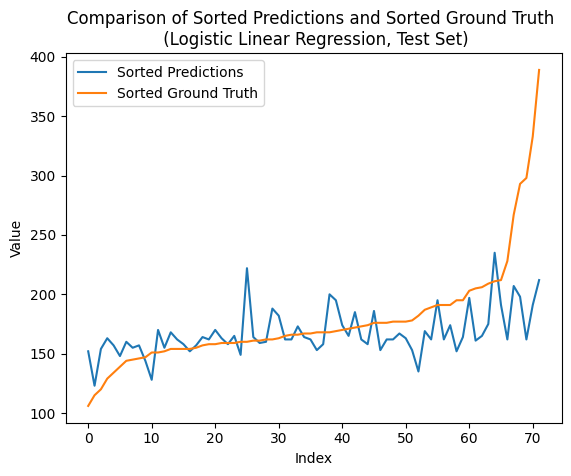

In [134]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.19078947368421054
Mean squared error: 457.49926900584796
Correlation coefficient: 0.7215518417720166
Coefficient of determination (R-squared score, R2 score): 0.49698741577037975


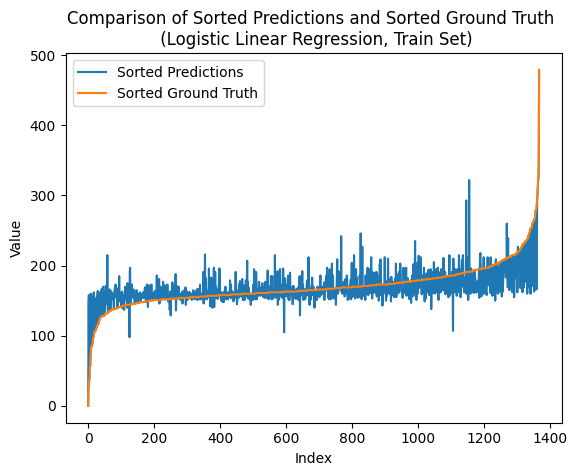

In [135]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [136]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[153 188 191 162 164 212 157 186 162 235 153 162 152 153 152 123 155 222
 165 152 173 207 159 164 158 162 182 162 170 185 162 158 191 149 162 128
 197 165 161 163 158 162 164 165 170 162 135 195 168 163 163 200 157 162
 162 175 167 148 198 144 158 154 160 155 174 160 157 174 162 164 169 195]
[5 6 6 5 5 7 5 6 5 7 5 5 5 5 5 4 5 7 5 5 5 6 5 5 5 5 6 5 5 6 5 5 6 4 5 4 6
 5 5 5 5 5 5 5 5 5 4 6 5 5 5 6 5 5 5 5 5 4 6 4 5 5 5 5 5 5 5 5 5 5 5 6]
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5033623567256986
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
Mean squared error: 0.6279239766081871
Correlation coefficient: 0.661237979923109
Coefficient of determination (R-squared score, R2 score): 0.40277371194379386


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 13
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.6729486189445093
Coefficient of determination (R-squared score, R2 score): 0.30293159609120524
train eval:
Mean squared error: 0.7880116959064327
Correlation coefficient: 0.5082613911871378
Coefficient of determination (R-squared score, R2 score): 0.25051229508196715


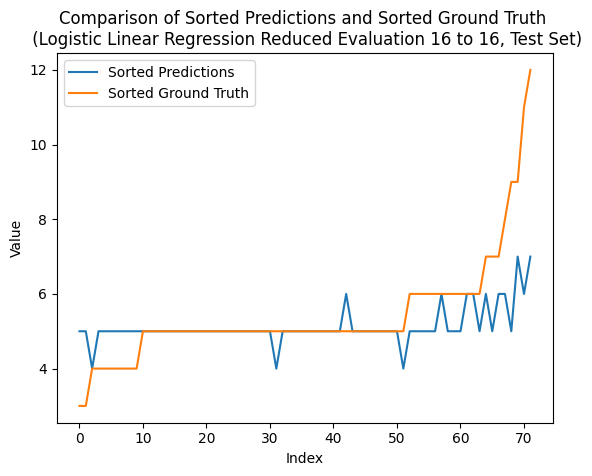

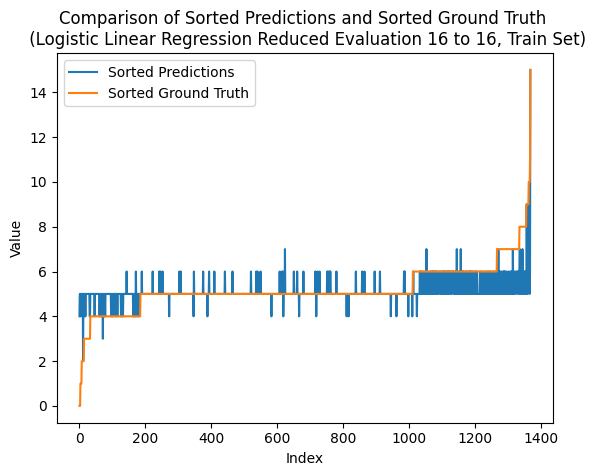

---- ---- ----
class_num = 32
Number of unique elements: 24
[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 1.5
Correlation coefficient: 0.6316825162238779
Coefficient of determination (R-squared score, R2 score): 0.2964169381107492
train eval:
Mean squared error: 0.8347953216374269
Correlation coefficient: 0.46380689425801835
Coefficient of determination (R-squared score, R2 score): 0.20601580796252927


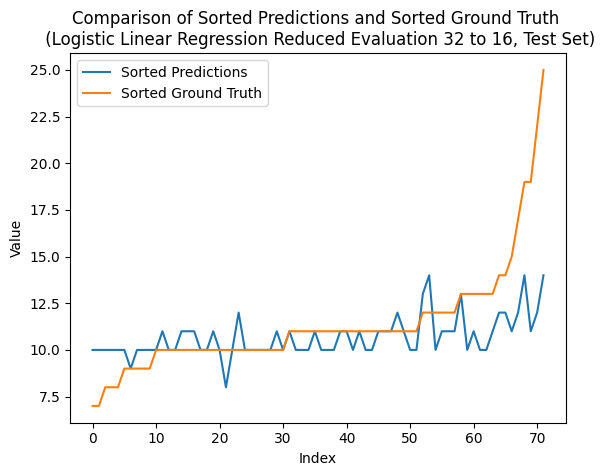

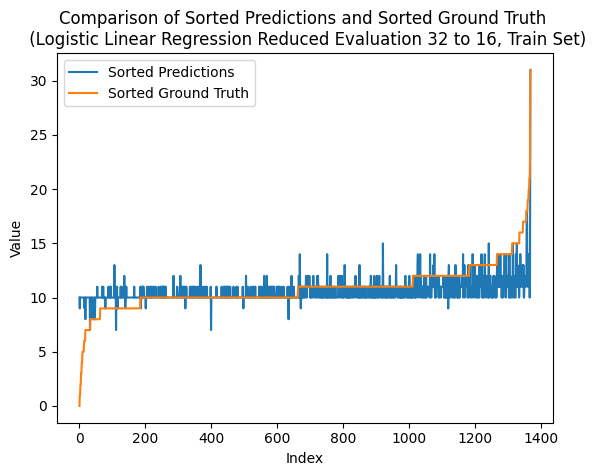

---- ---- ----
class_num = 48
Number of unique elements: 32
[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.5905411508914448
Coefficient of determination (R-squared score, R2 score): 0.2899022801302932
train eval:
Mean squared error: 0.8092105263157895
Correlation coefficient: 0.49208983258016076
Coefficient of determination (R-squared score, R2 score): 0.23034982435597184


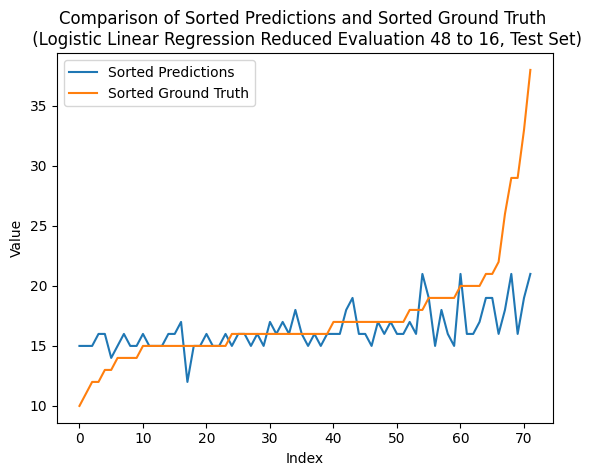

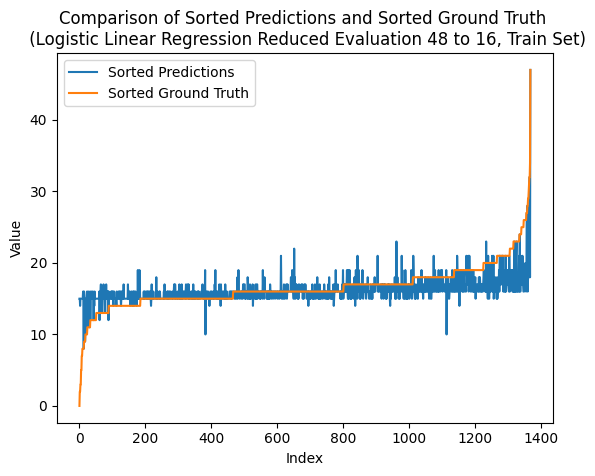

---- ---- ----
class_num = 64
Number of unique elements: 40
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 1.4722222222222223
Correlation coefficient: 0.6041837486820971
Coefficient of determination (R-squared score, R2 score): 0.30944625407166126
train eval:
Mean squared error: 0.7785087719298246
Correlation coefficient: 0.5249563506052511
Coefficient of determination (R-squared score, R2 score): 0.259550644028103


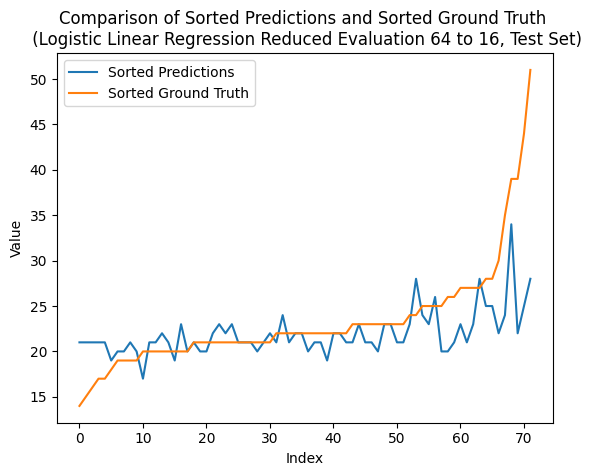

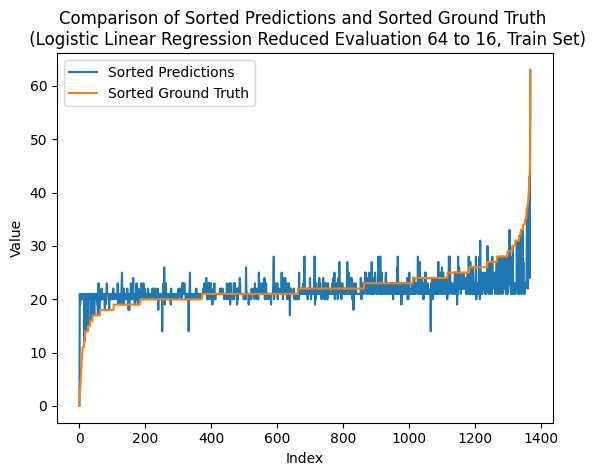

---- ---- ----
class_num = 80
Number of unique elements: 47
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5643759757227528
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.7733918128654971
Correlation coefficient: 0.529263041834056
Coefficient of determination (R-squared score, R2 score): 0.2644174473067915


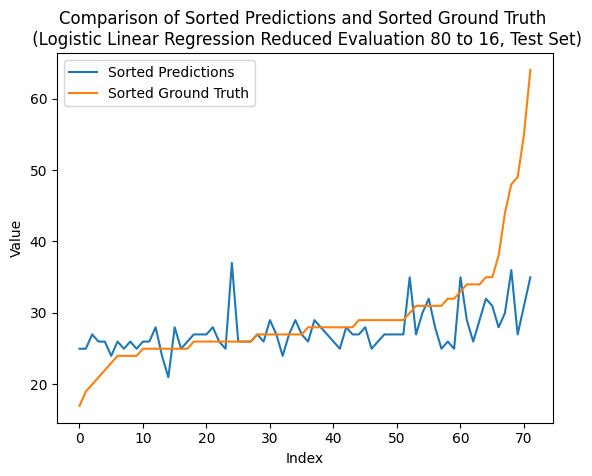

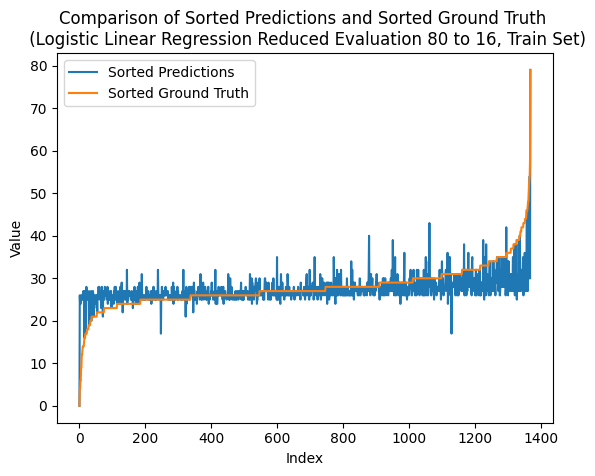

---- ---- ----
class_num = 96
Number of unique elements: 52
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.4747810184692464
Coefficient of determination (R-squared score, R2 score): 0.18566775244299671
train eval:
Mean squared error: 0.7755847953216374
Correlation coefficient: 0.5310572555070849
Coefficient of determination (R-squared score, R2 score): 0.26233167447306793


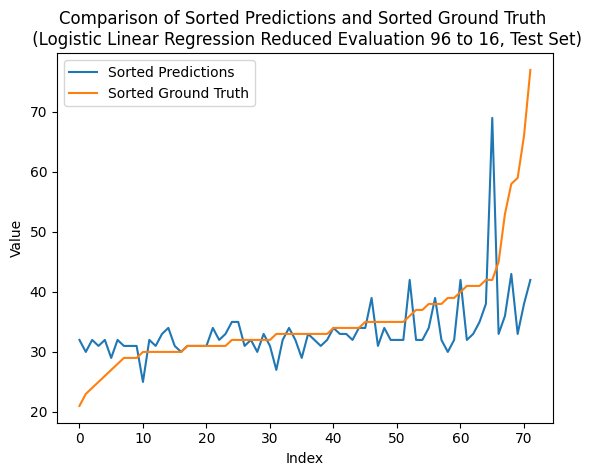

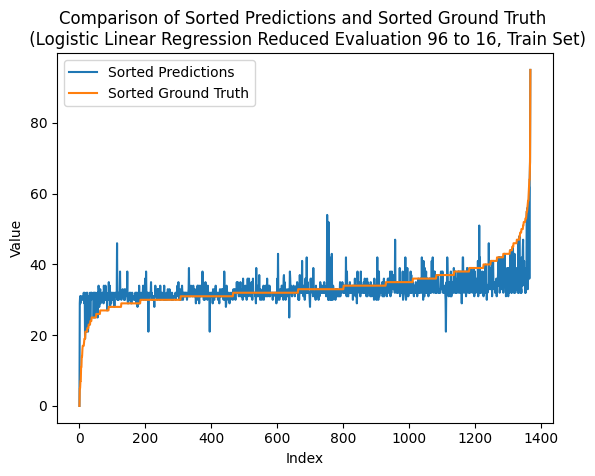

---- ---- ----
class_num = 112
Number of unique elements: 62
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6153920333462094
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.7529239766081871
Correlation coefficient: 0.5533847914586556
Coefficient of determination (R-squared score, R2 score): 0.2838846604215457


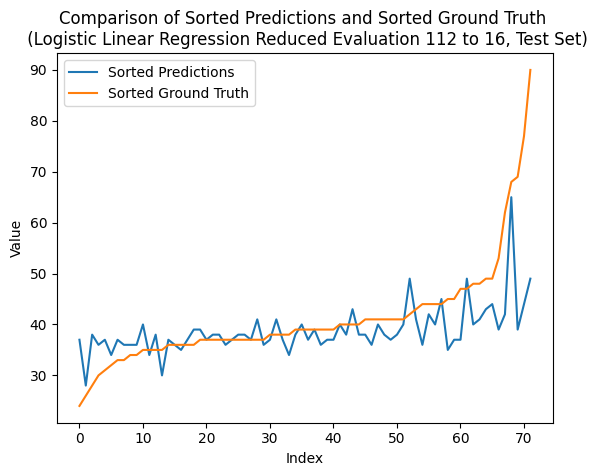

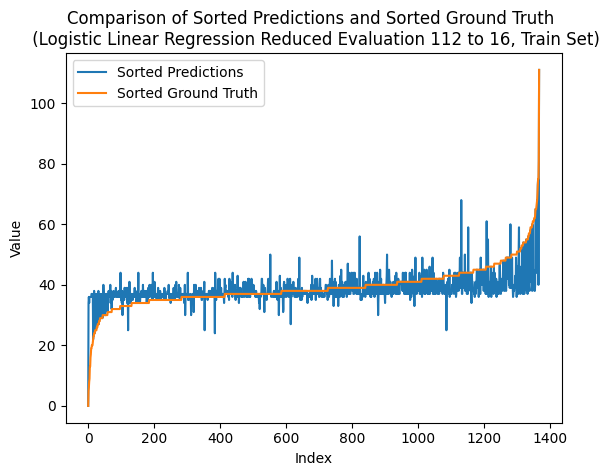

---- ---- ----
class_num = 128
Number of unique elements: 66
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5419680175635636
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.7463450292397661
Correlation coefficient: 0.5595921697895182
Coefficient of determination (R-squared score, R2 score): 0.29014197892271665


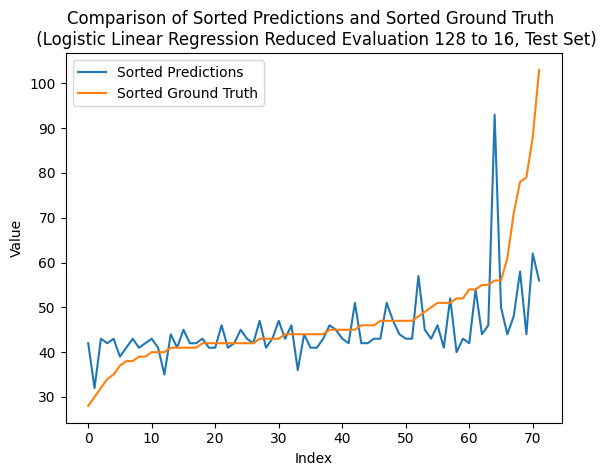

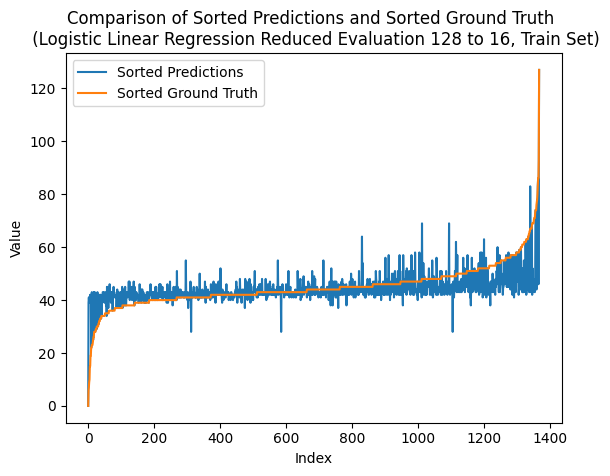

---- ---- ----
class_num = 144
Number of unique elements: 74
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.5968664849172935
Coefficient of determination (R-squared score, R2 score): 0.3159609120521173
train eval:
Mean squared error: 0.7733918128654971
Correlation coefficient: 0.5409087969084502
Coefficient of determination (R-squared score, R2 score): 0.2644174473067915


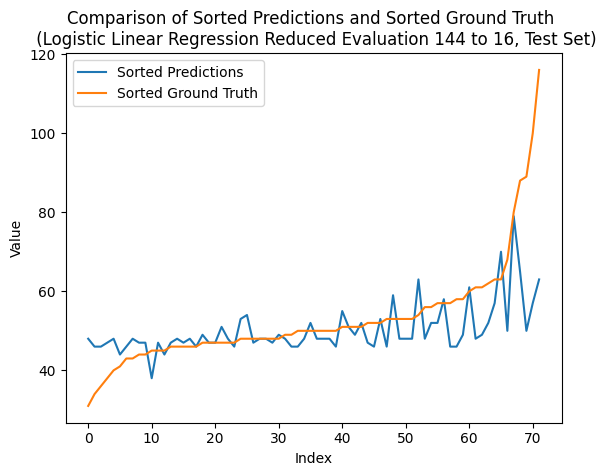

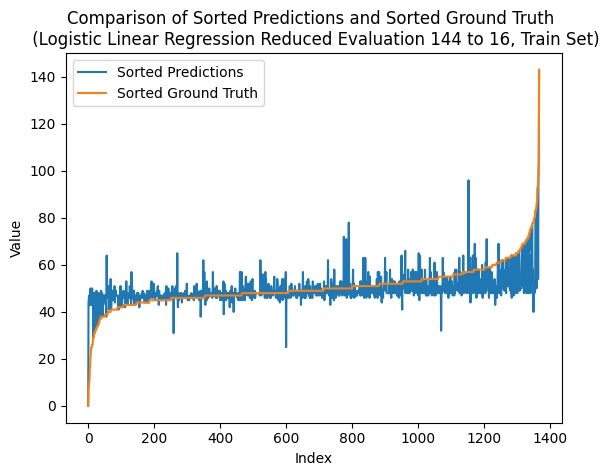

---- ---- ----
class_num = 160
Number of unique elements: 80
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.5897001780842589
Coefficient of determination (R-squared score, R2 score): 0.3159609120521173
train eval:
Mean squared error: 0.722953216374269
Correlation coefficient: 0.5762377733880186
Coefficient of determination (R-squared score, R2 score): 0.31239022248243553


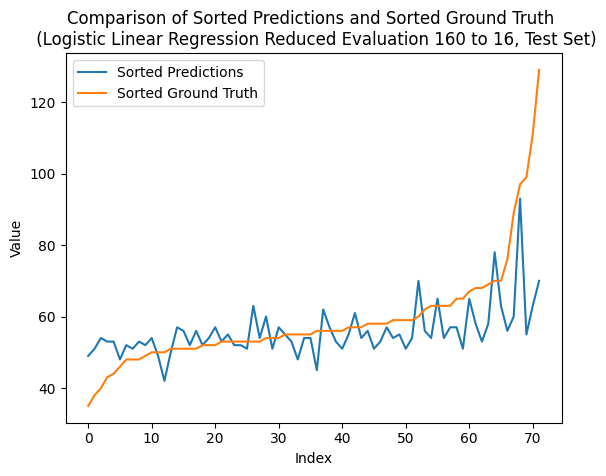

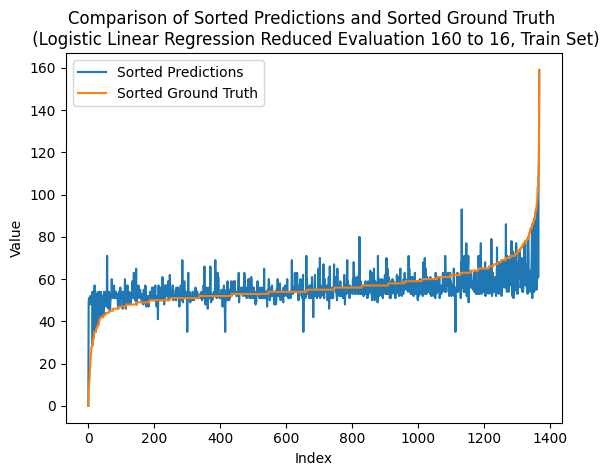

---- ---- ----
class_num = 176
Number of unique elements: 87
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.4971041344453839
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.7127192982456141
Correlation coefficient: 0.5963274846388271
Coefficient of determination (R-squared score, R2 score): 0.3221238290398126


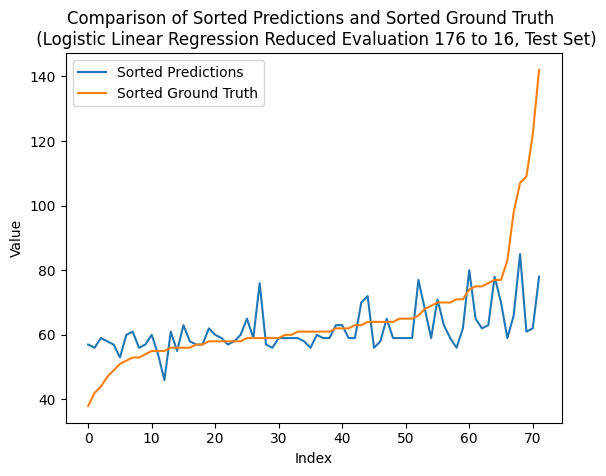

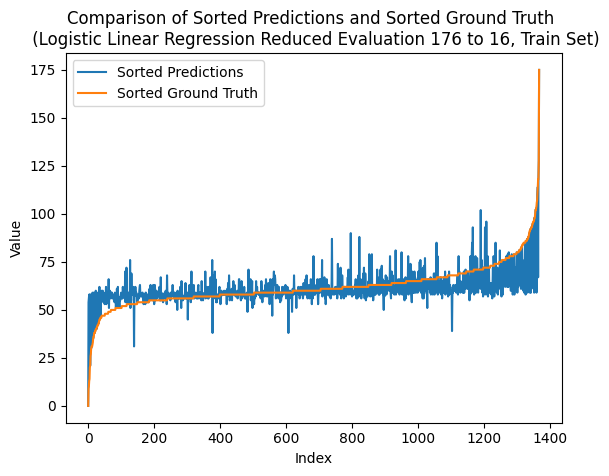

---- ---- ----
class_num = 192
Number of unique elements: 88
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 1.375
Correlation coefficient: 0.6387153377236705
Coefficient of determination (R-squared score, R2 score): 0.35504885993485347
train eval:
Mean squared error: 0.6988304093567251
Correlation coefficient: 0.6012157494600862
Coefficient of determination (R-squared score, R2 score): 0.33533372365339575


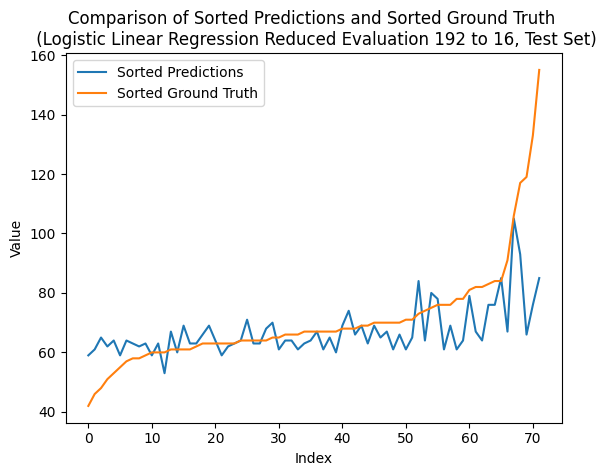

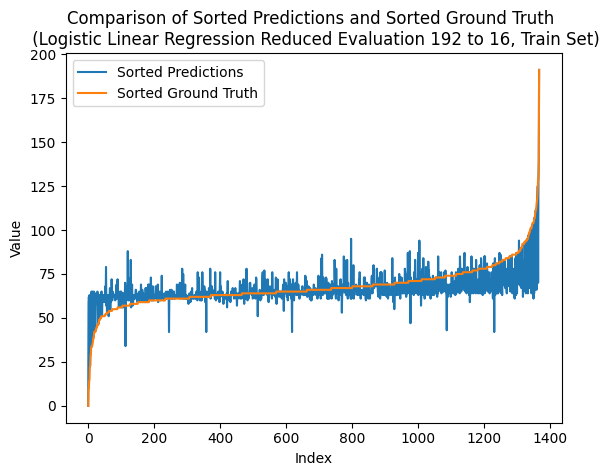

---- ---- ----
class_num = 208
Number of unique elements: 93
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.6077128835087697
Coefficient of determination (R-squared score, R2 score): 0.32899022801302935
train eval:
Mean squared error: 0.7185672514619883
Correlation coefficient: 0.586337604816635
Coefficient of determination (R-squared score, R2 score): 0.3165617681498829


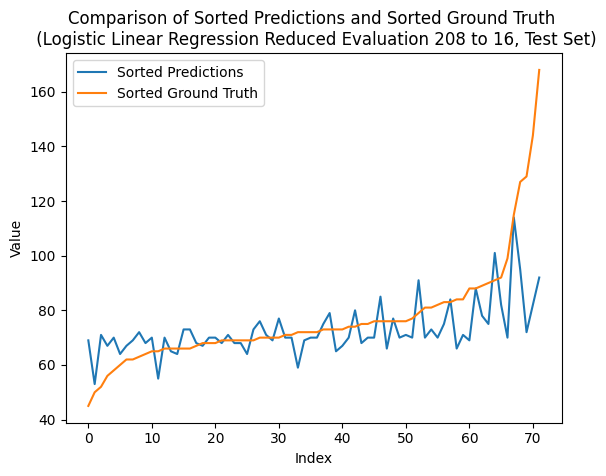

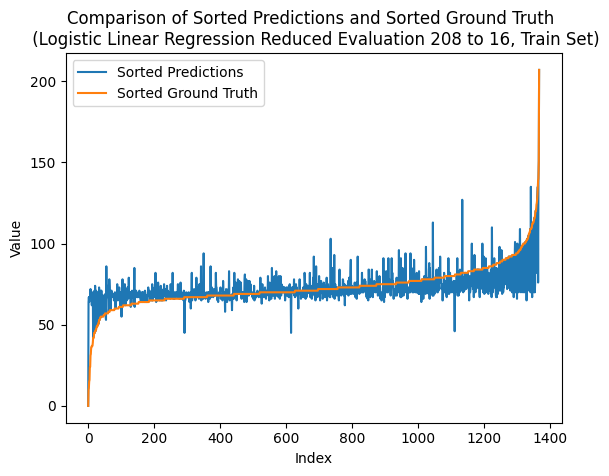

---- ---- ----
class_num = 224
Number of unique elements: 100
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5751930657582263
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.6995614035087719
Correlation coefficient: 0.5980918999893446
Coefficient of determination (R-squared score, R2 score): 0.3346384660421545


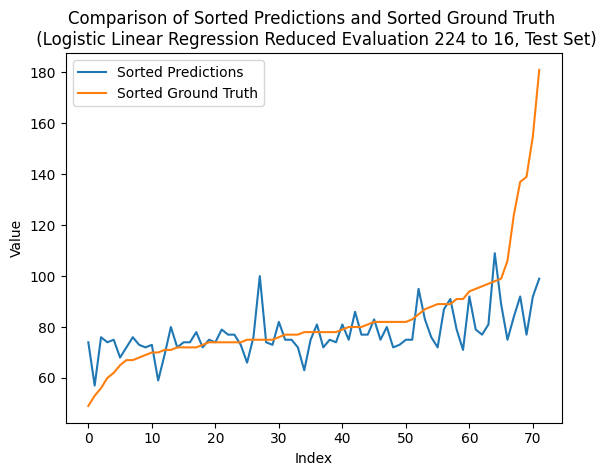

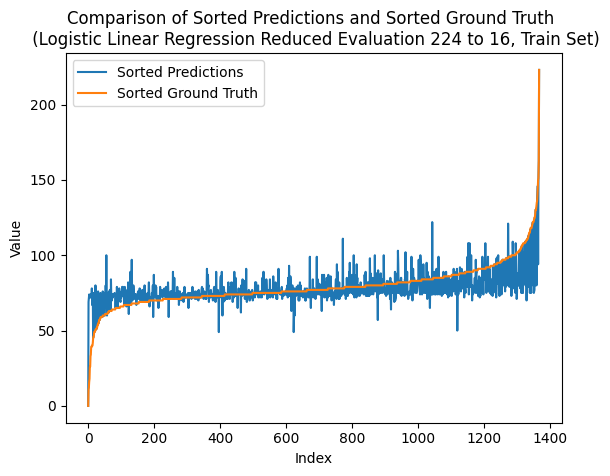

---- ---- ----
class_num = 240
Number of unique elements: 103
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5332744925486176
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.7192982456140351
Correlation coefficient: 0.5891306504171849
Coefficient of determination (R-squared score, R2 score): 0.3158665105386417


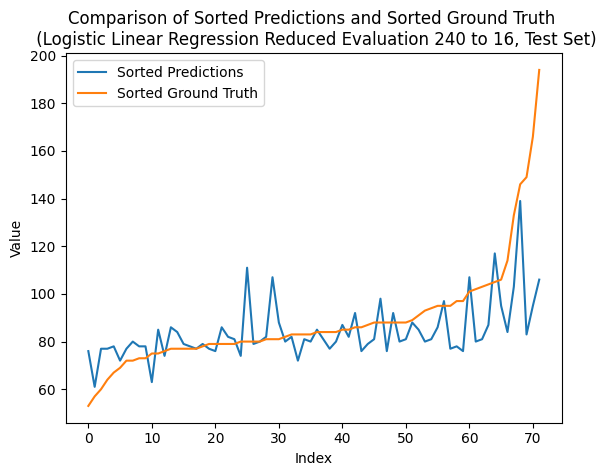

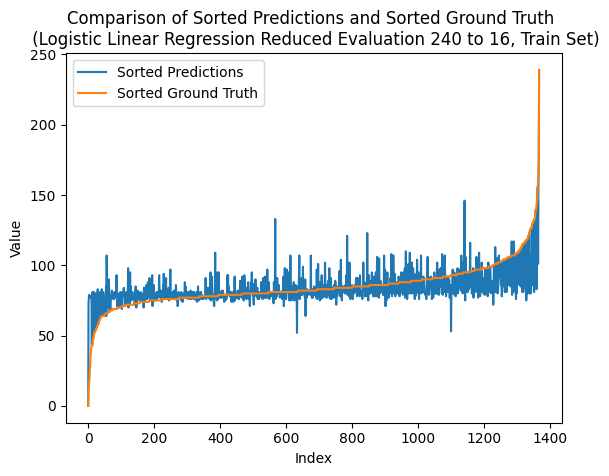

---- ---- ----
class_num = 256
Number of unique elements: 106
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.5591110909322814
Coefficient of determination (R-squared score, R2 score): 0.2768729641693811
train eval:
Mean squared error: 0.7543859649122807
Correlation coefficient: 0.5664911980267182
Coefficient of determination (R-squared score, R2 score): 0.28249414519906324


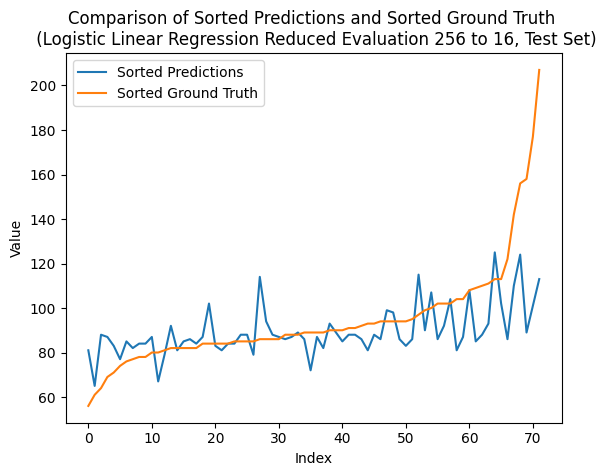

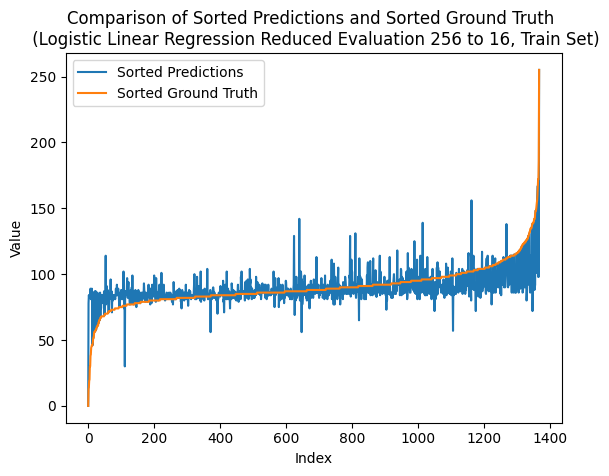

---- ---- ----
class_num = 272
Number of unique elements: 111
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.5961204137729829
Coefficient of determination (R-squared score, R2 score): 0.32899022801302935
train eval:
Mean squared error: 0.7156432748538012
Correlation coefficient: 0.605041781832976
Coefficient of determination (R-squared score, R2 score): 0.3193427985948477


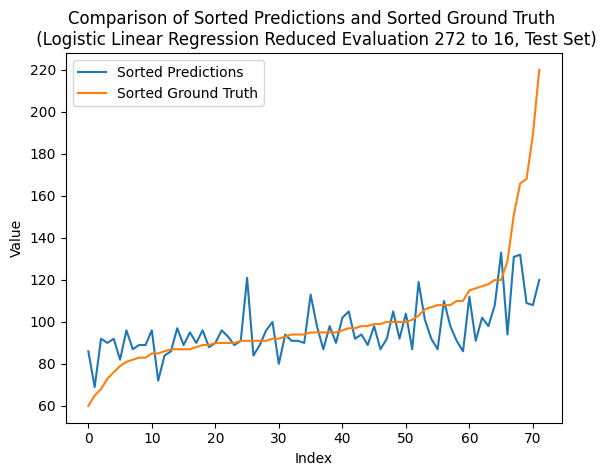

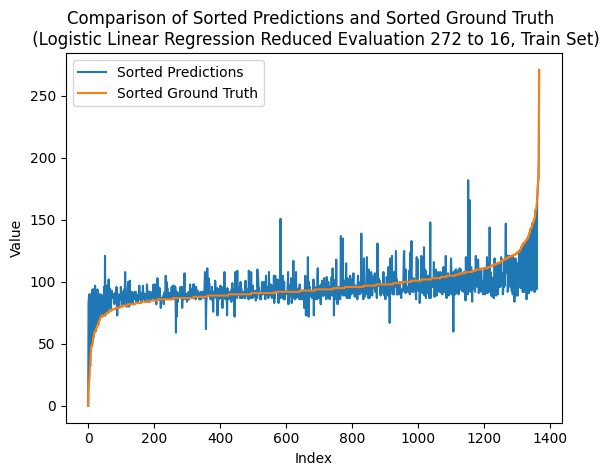

---- ---- ----
class_num = 288
Number of unique elements: 116
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 1.4027777777777777
Correlation coefficient: 0.602344880943043
Coefficient of determination (R-squared score, R2 score): 0.3420195439739414
train eval:
Mean squared error: 0.7375730994152047
Correlation coefficient: 0.5907221075813683
Coefficient of determination (R-squared score, R2 score): 0.2984850702576112


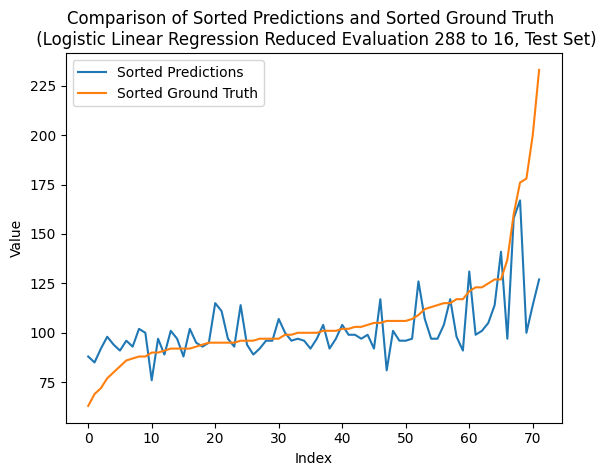

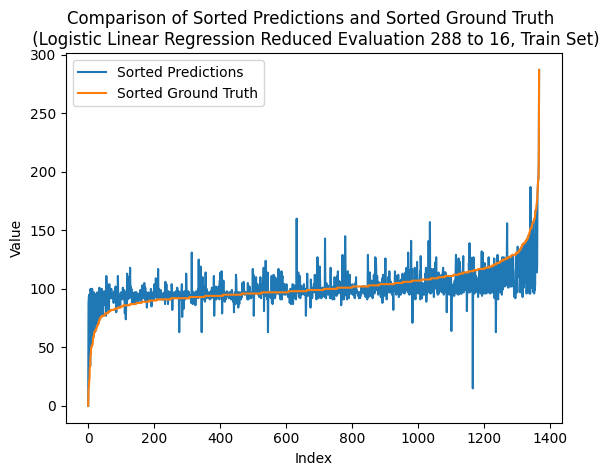

---- ---- ----
class_num = 304
Number of unique elements: 126
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.5865299416238527
Coefficient of determination (R-squared score, R2 score): 0.3224755700325733
train eval:
Mean squared error: 0.7185672514619883
Correlation coefficient: 0.596747148448684
Coefficient of determination (R-squared score, R2 score): 0.3165617681498829


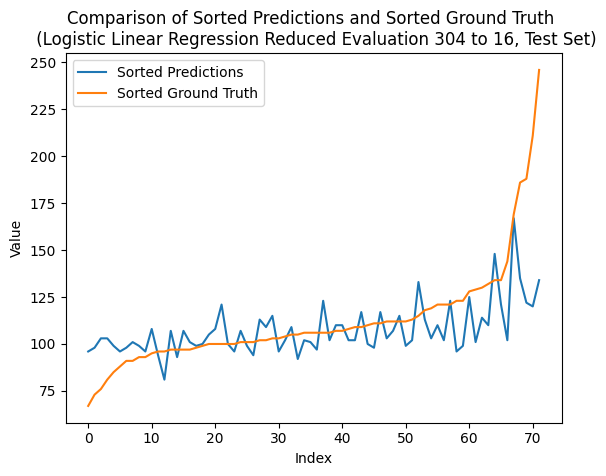

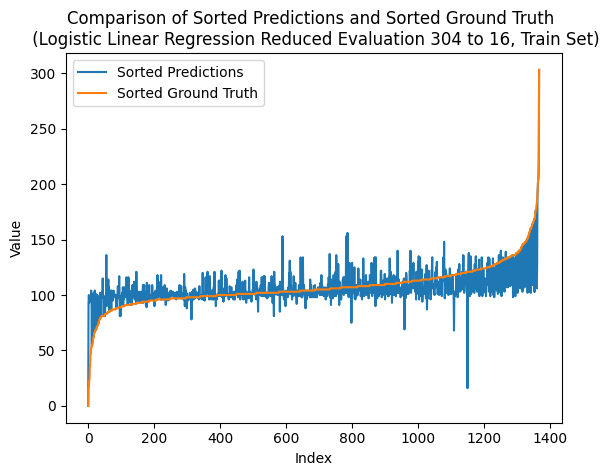

---- ---- ----
class_num = 320
Number of unique elements: 129
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 1.75
Correlation coefficient: 0.47223595675728675
Coefficient of determination (R-squared score, R2 score): 0.17915309446254069
train eval:
Mean squared error: 0.7251461988304093
Correlation coefficient: 0.604332884037283
Coefficient of determination (R-squared score, R2 score): 0.31030444964871196


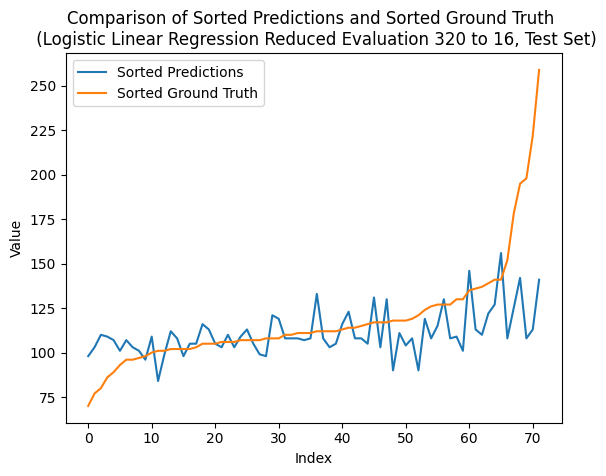

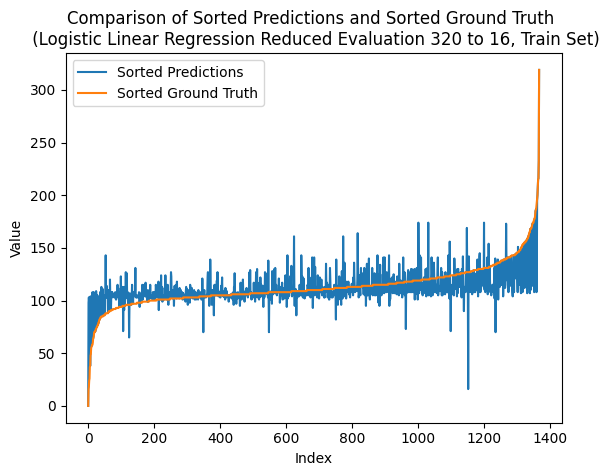

---- ---- ----
class_num = 336
Number of unique elements: 130
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.533217653197421
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.7105263157894737
Correlation coefficient: 0.6076001358135877
Coefficient of determination (R-squared score, R2 score): 0.3242096018735363


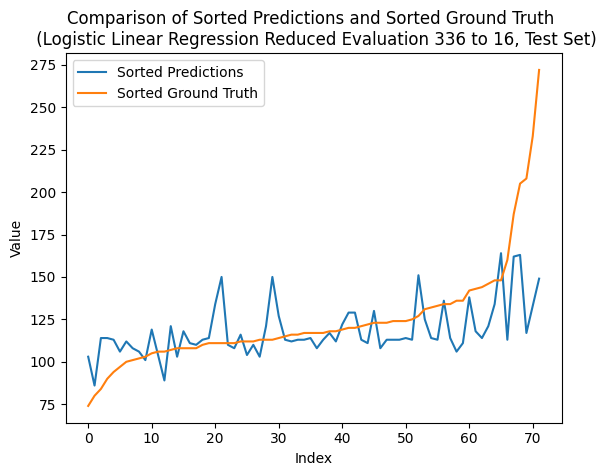

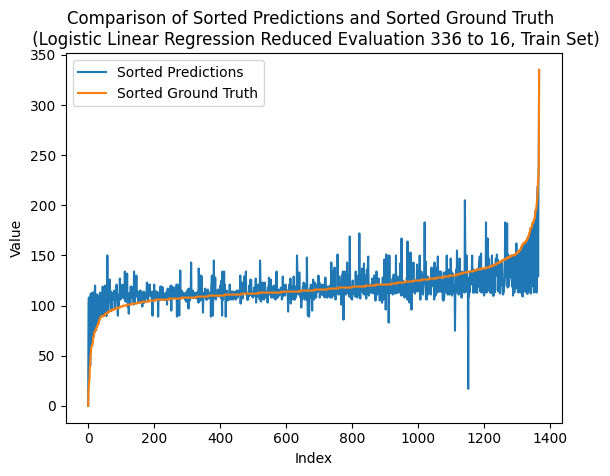

---- ---- ----
class_num = 352
Number of unique elements: 137
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.45013174101225295
Coefficient of determination (R-squared score, R2 score): 0.18566775244299671
train eval:
Mean squared error: 0.7105263157894737
Correlation coefficient: 0.6202405696818571
Coefficient of determination (R-squared score, R2 score): 0.3242096018735363


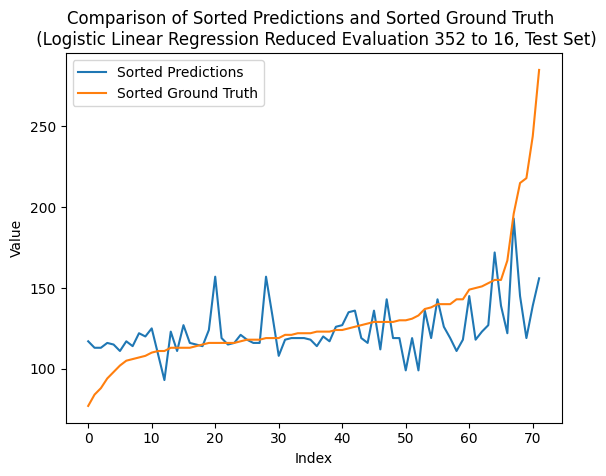

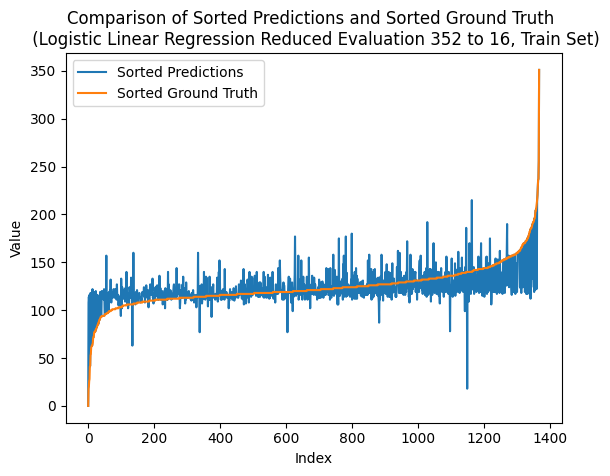

---- ---- ----
class_num = 368
Number of unique elements: 142
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 1.375
Correlation coefficient: 0.668206101072023
Coefficient of determination (R-squared score, R2 score): 0.35504885993485347
train eval:
Mean squared error: 0.6491228070175439
Correlation coefficient: 0.6477043143414424
Coefficient of determination (R-squared score, R2 score): 0.38261124121779855


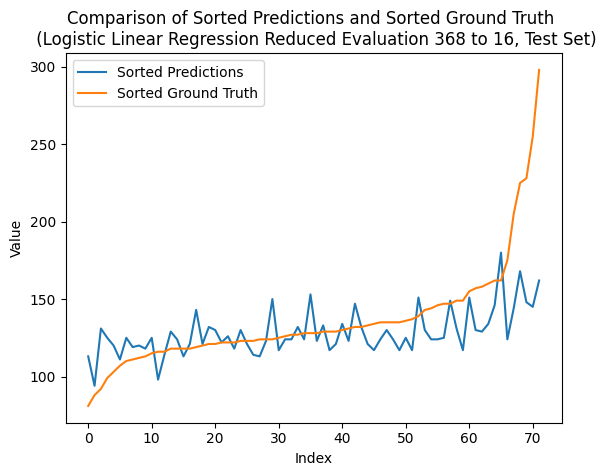

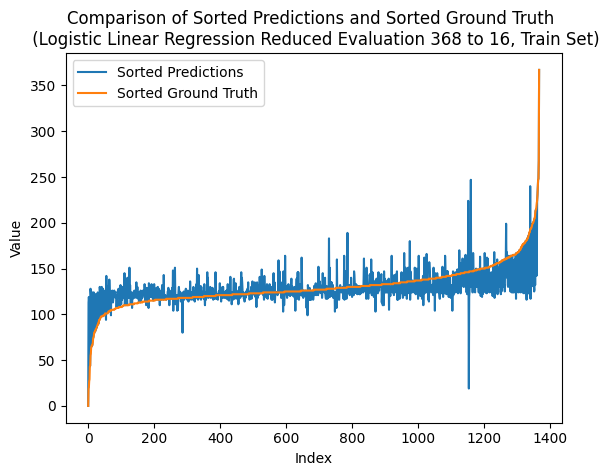

---- ---- ----
class_num = 384
Number of unique elements: 143
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 1.375
Correlation coefficient: 0.6230615808304361
Coefficient of determination (R-squared score, R2 score): 0.35504885993485347
train eval:
Mean squared error: 0.6805555555555556
Correlation coefficient: 0.6247390393210753
Coefficient of determination (R-squared score, R2 score): 0.35271516393442626


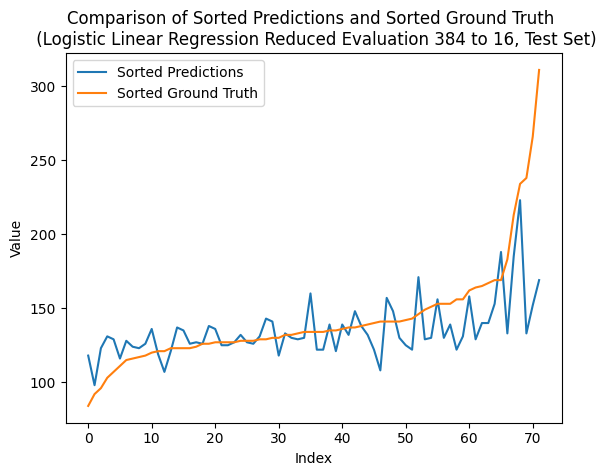

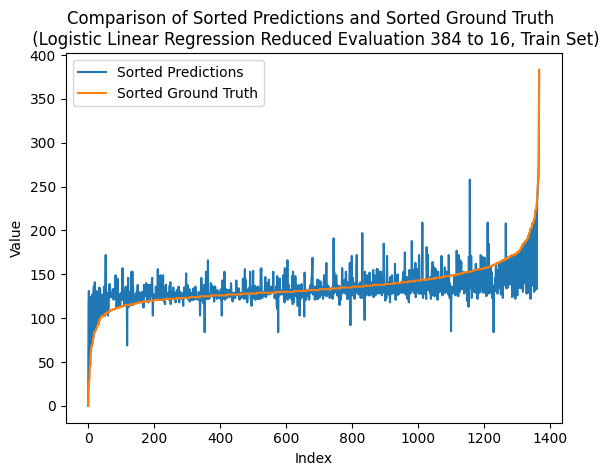

---- ---- ----
class_num = 400
Number of unique elements: 147
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5811027273774773
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.6937134502923976
Correlation coefficient: 0.6251397026786368
Coefficient of determination (R-squared score, R2 score): 0.34020052693208425


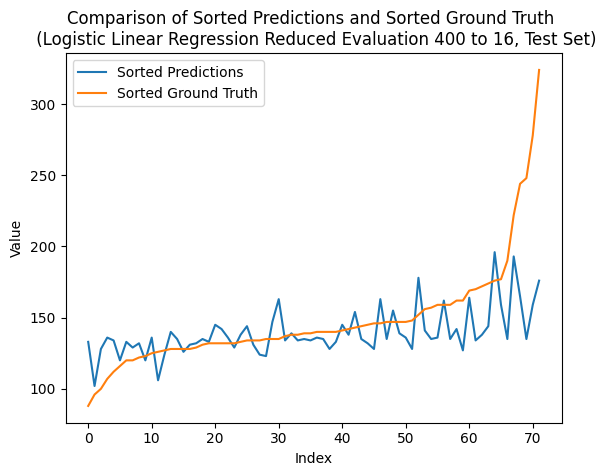

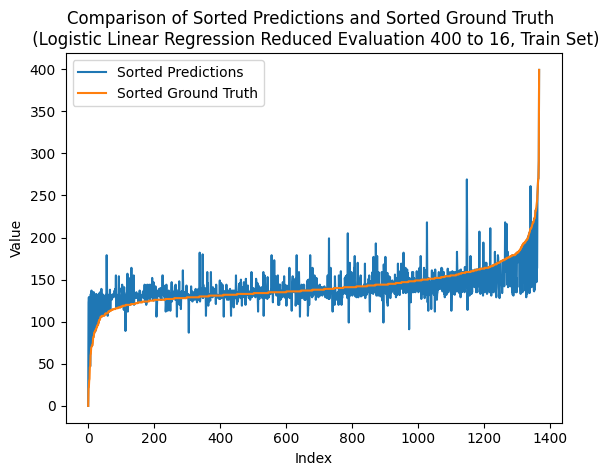

---- ---- ----
class_num = 416
Number of unique elements: 150
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.4795730521825559
Coefficient of determination (R-squared score, R2 score): 0.19869706840390877
train eval:
Mean squared error: 0.6834795321637427
Correlation coefficient: 0.6268730505757224
Coefficient of determination (R-squared score, R2 score): 0.34993413348946134


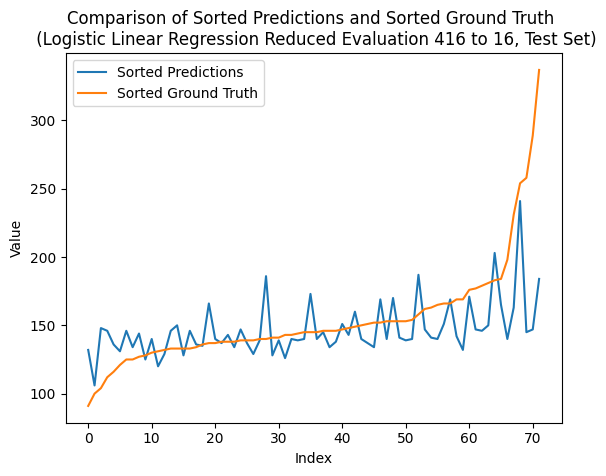

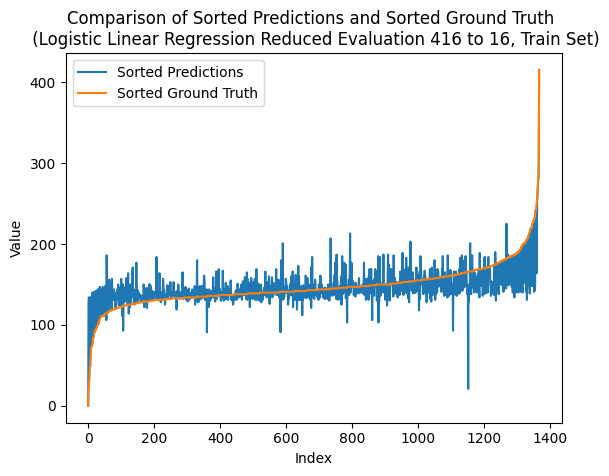

---- ---- ----
class_num = 432
Number of unique elements: 158
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5424099736115721
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.6871345029239766
Correlation coefficient: 0.6300664239804017
Coefficient of determination (R-squared score, R2 score): 0.3464578454332552


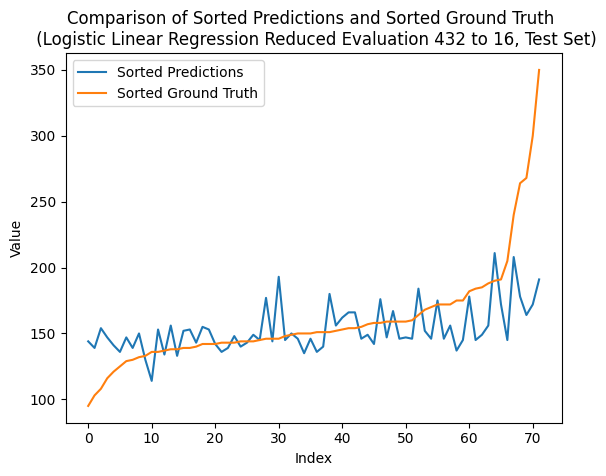

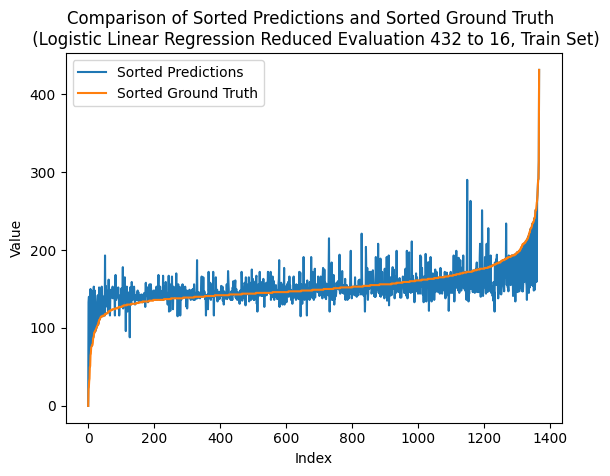

---- ---- ----
class_num = 448
Number of unique elements: 162
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.49522734635405535
Coefficient of determination (R-squared score, R2 score): 0.21172638436482083
train eval:
Mean squared error: 0.652046783625731
Correlation coefficient: 0.6492568593331814
Coefficient of determination (R-squared score, R2 score): 0.37983021077283374


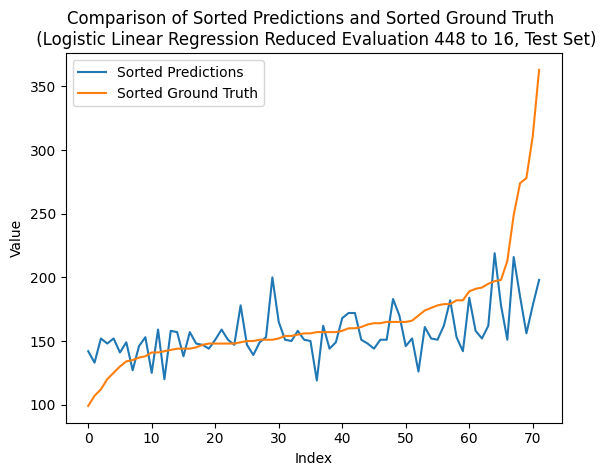

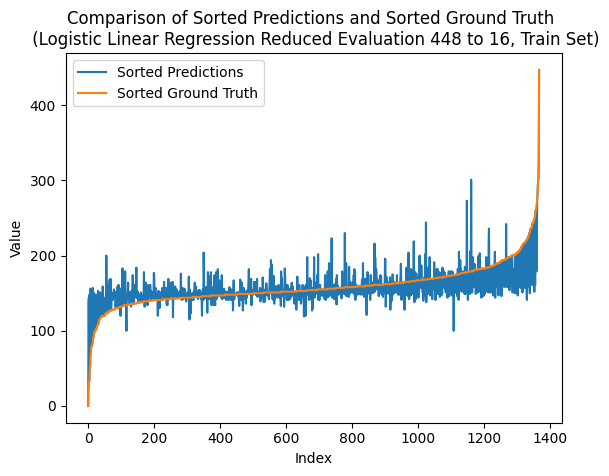

---- ---- ----
class_num = 464
Number of unique elements: 163
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.49710413444538387
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.6476608187134503
Correlation coefficient: 0.650283813837202
Coefficient of determination (R-squared score, R2 score): 0.384001756440281


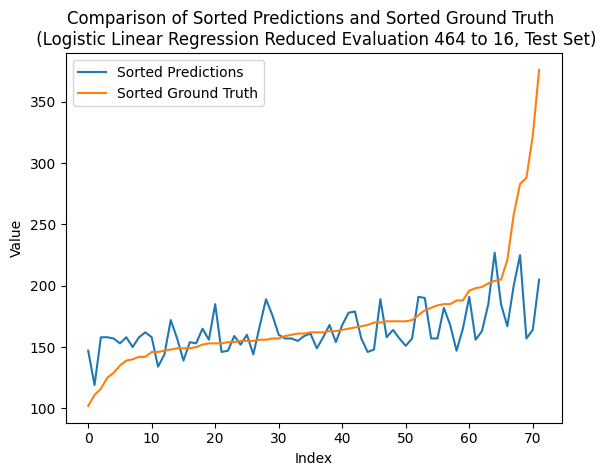

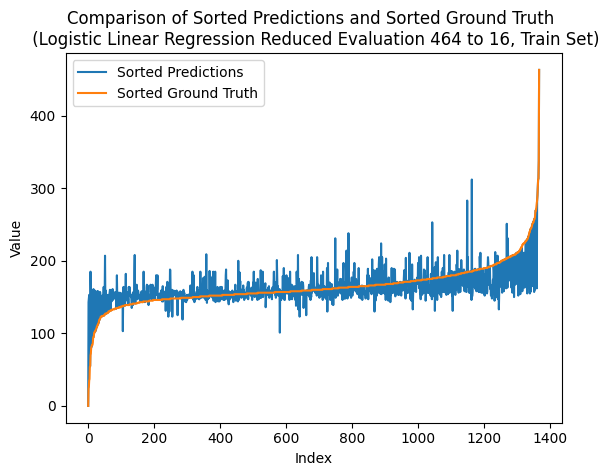

---- ---- ----
class_num = 480
Number of unique elements: 170
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5033623567256986
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.6279239766081871
Correlation coefficient: 0.661237979923109
Coefficient of determination (R-squared score, R2 score): 0.40277371194379386


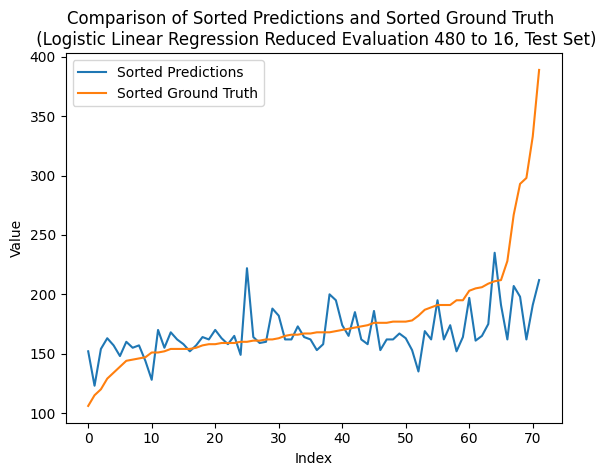

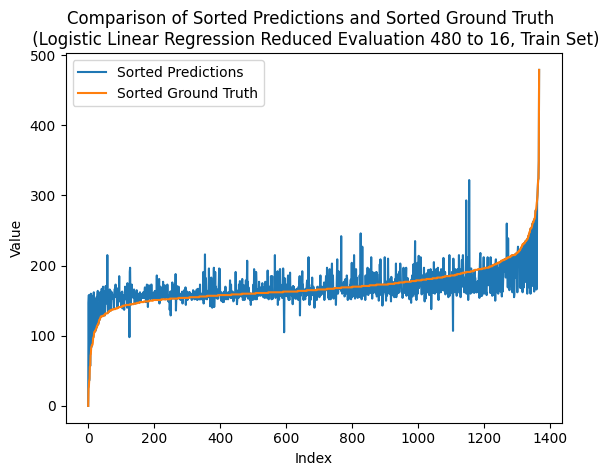

---- ---- ----
class_num = 496
Number of unique elements: 172
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.4999812291222127
Coefficient of determination (R-squared score, R2 score): 0.23778501628664495
train eval:
Mean squared error: 0.6864035087719298
Correlation coefficient: 0.6318794095384961
Coefficient of determination (R-squared score, R2 score): 0.3471531030444964


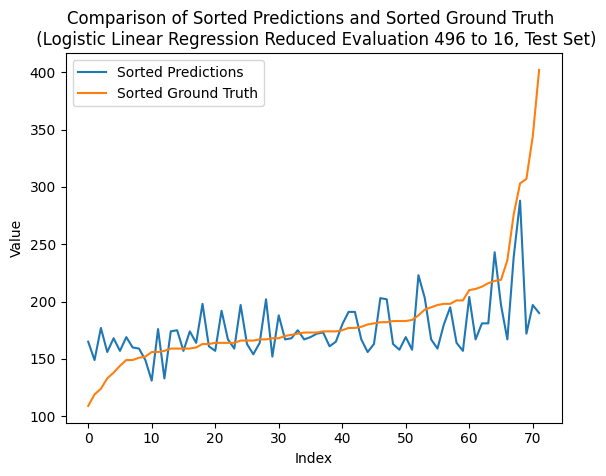

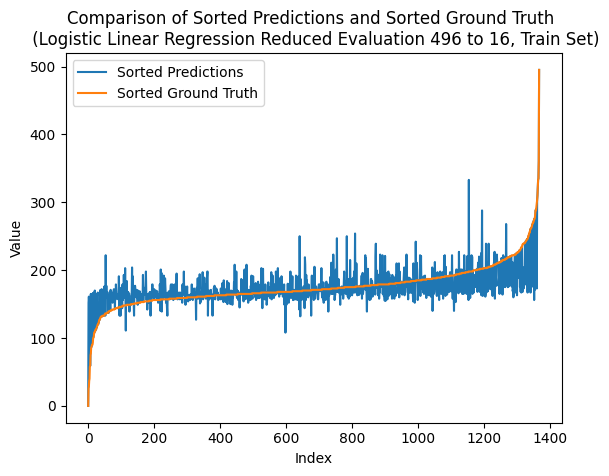

---- ---- ----
class_num = 512
Number of unique elements: 173
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5487473923173559
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.6739766081871345
Correlation coefficient: 0.6386832877407105
Coefficient of determination (R-squared score, R2 score): 0.3589724824355972


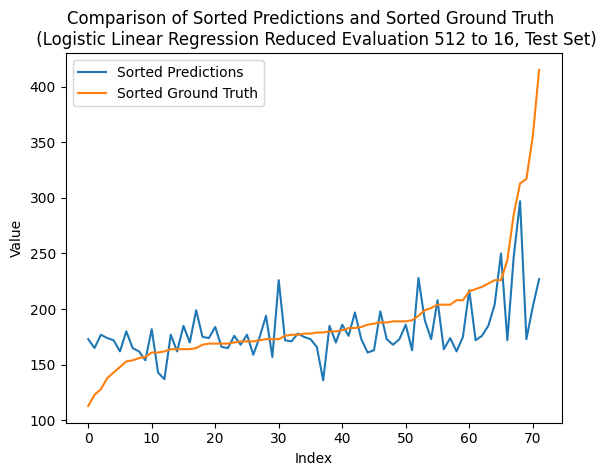

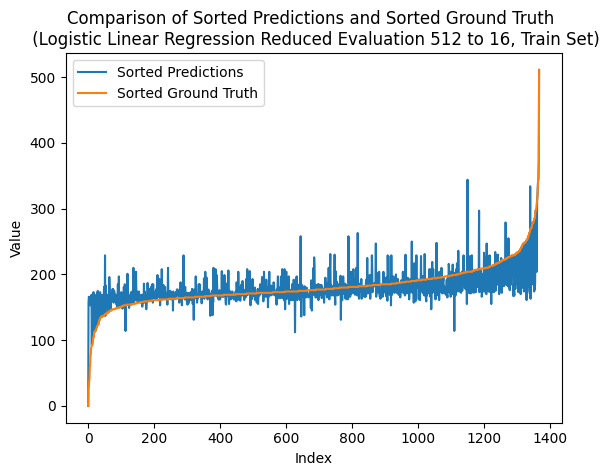

---- ---- ----
class_num = 528
Number of unique elements: 179
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4640560910739166
Coefficient of determination (R-squared score, R2 score): 0.19218241042345274
train eval:
Mean squared error: 0.672514619883041
Correlation coefficient: 0.6491064449957311
Coefficient of determination (R-squared score, R2 score): 0.36036299765807955


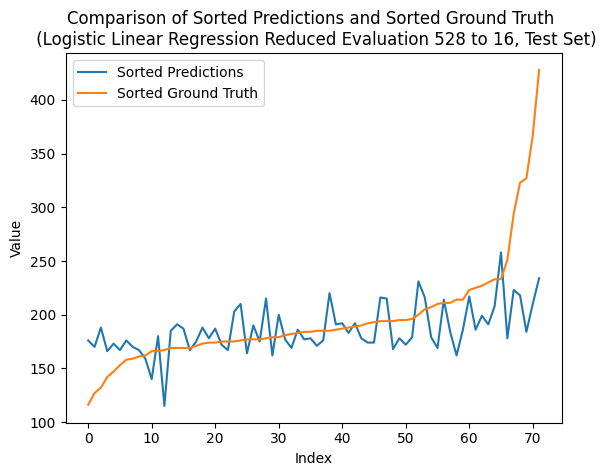

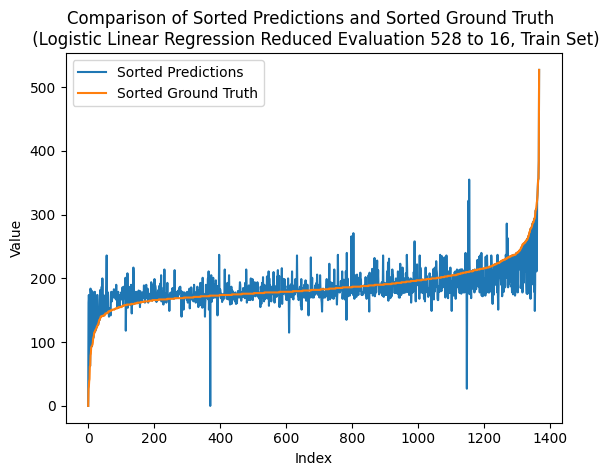

---- ---- ----
class_num = 544
Number of unique elements: 180
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.5279253846201974
Coefficient of determination (R-squared score, R2 score): 0.24429967426710097
train eval:
Mean squared error: 0.658625730994152
Correlation coefficient: 0.6536944086132043
Coefficient of determination (R-squared score, R2 score): 0.3735728922716628


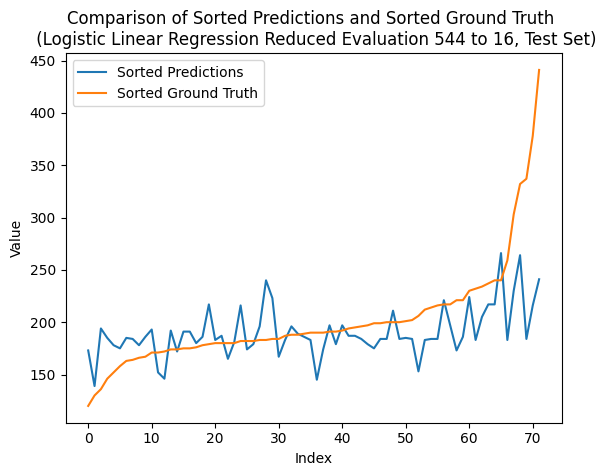

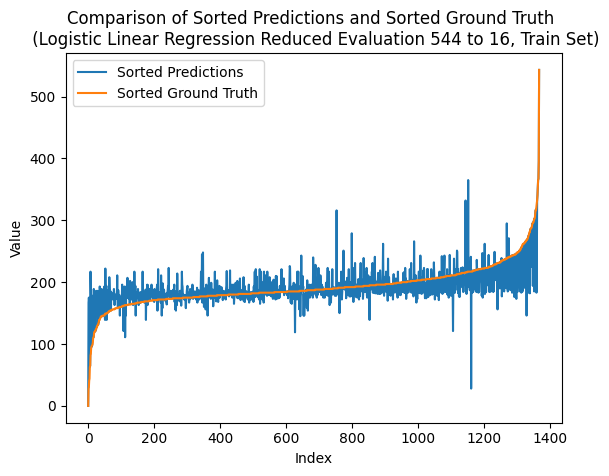

---- ---- ----
class_num = 560
Number of unique elements: 184
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.5094409956749365
Coefficient of determination (R-squared score, R2 score): 0.23778501628664495
train eval:
Mean squared error: 0.6001461988304093
Correlation coefficient: 0.681769976327228
Coefficient of determination (R-squared score, R2 score): 0.4291935011709602


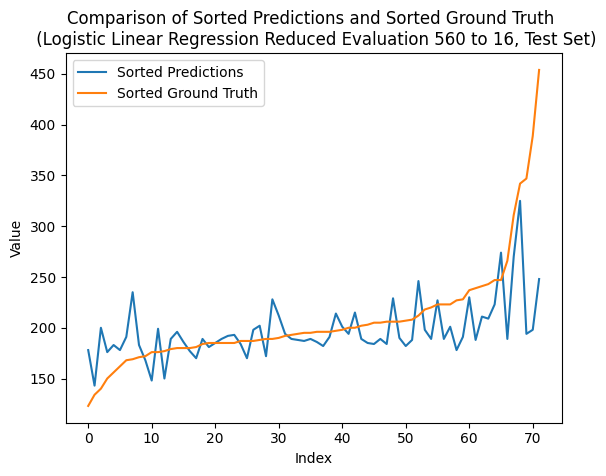

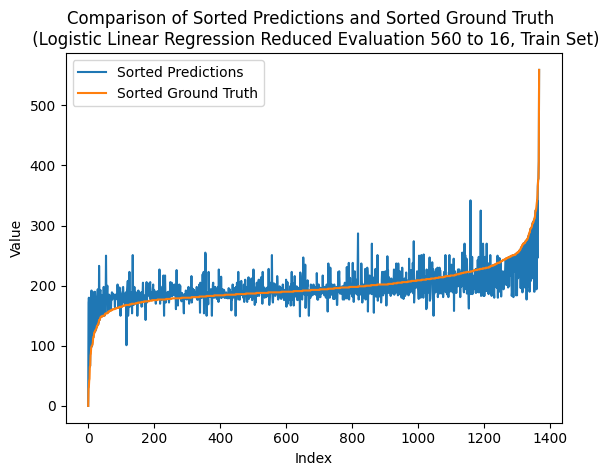

---- ---- ----
class_num = 576
Number of unique elements: 192
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6167127097227455
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.6535087719298246
Correlation coefficient: 0.6488169381924892
Coefficient of determination (R-squared score, R2 score): 0.3784396955503513


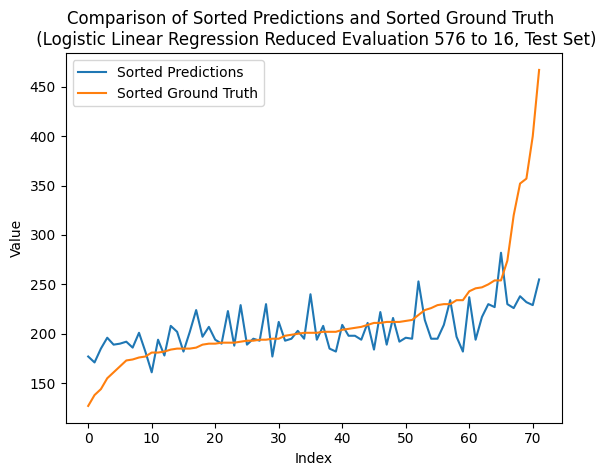

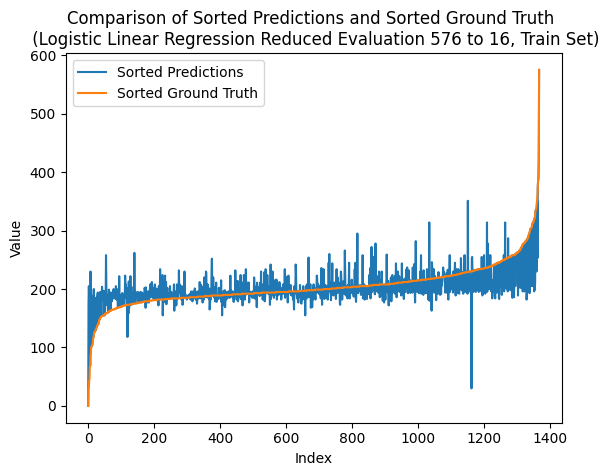

---- ---- ----
class_num = 592
Number of unique elements: 191
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.6062199038053081
Coefficient of determination (R-squared score, R2 score): 0.3159609120521173
train eval:
Mean squared error: 0.6630116959064327
Correlation coefficient: 0.6457807425421198
Coefficient of determination (R-squared score, R2 score): 0.3694013466042154


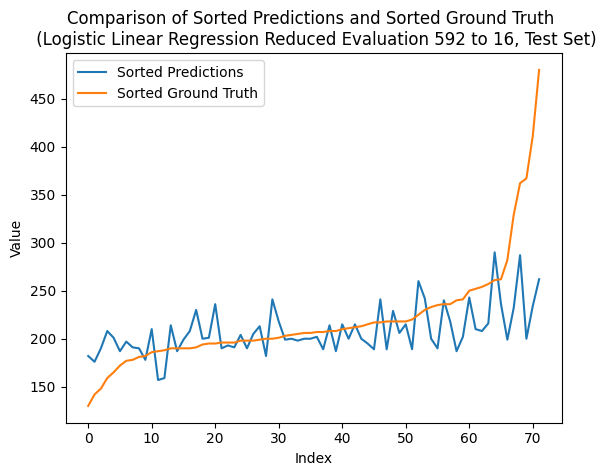

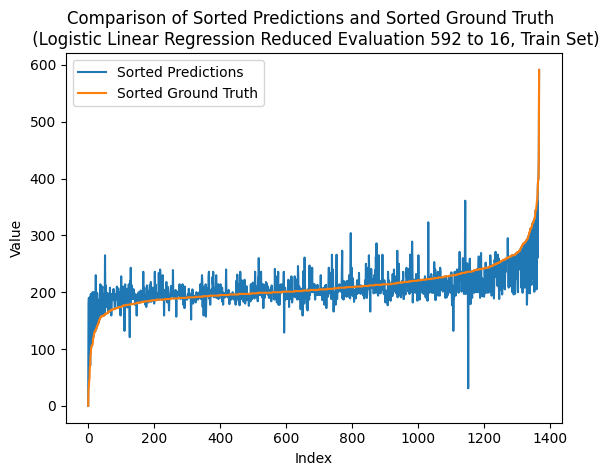

---- ---- ----
class_num = 608
Number of unique elements: 196
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6137807174298623
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.6403508771929824
Correlation coefficient: 0.6552726296909688
Coefficient of determination (R-squared score, R2 score): 0.3909543325526932


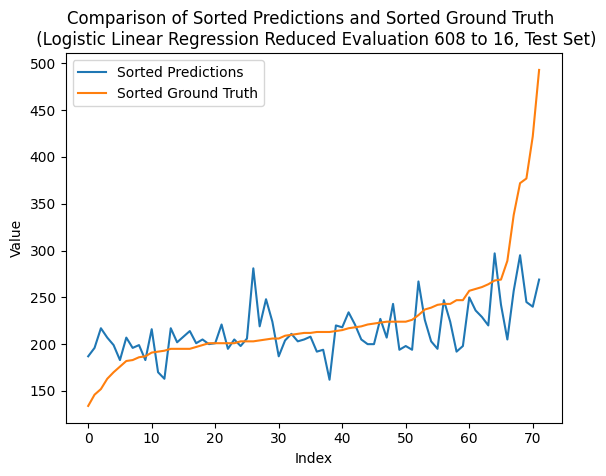

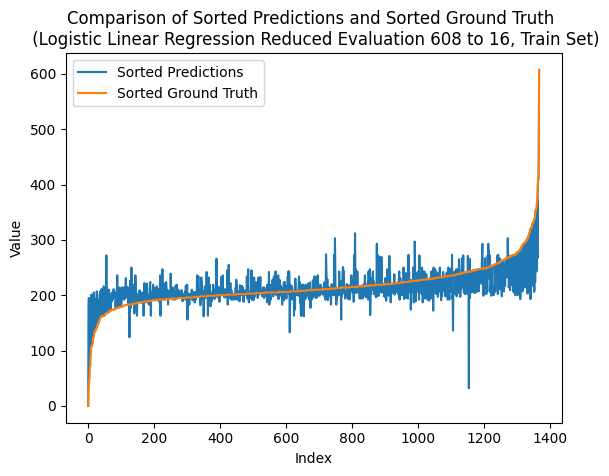

---- ---- ----
class_num = 624
Number of unique elements: 195
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.45804097911158853
Coefficient of determination (R-squared score, R2 score): 0.19869706840390877
train eval:
Mean squared error: 0.64546783625731
Correlation coefficient: 0.6573527002688955
Coefficient of determination (R-squared score, R2 score): 0.3860875292740047


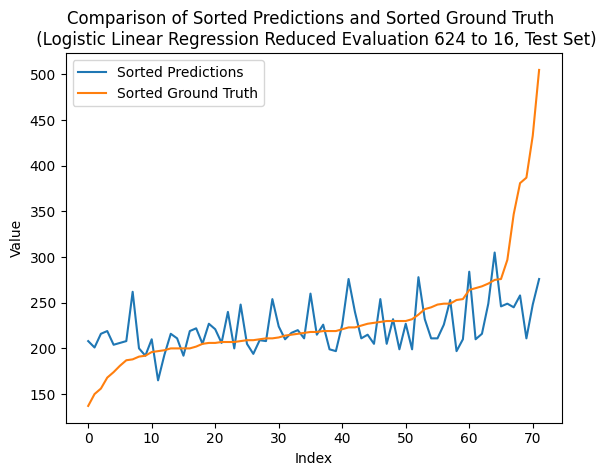

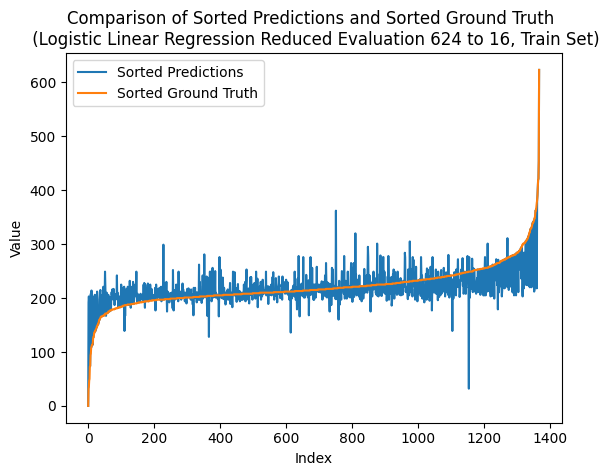

---- ---- ----
class_num = 640
Number of unique elements: 205
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.49203937294772077
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.6089181286549707
Correlation coefficient: 0.6779878750769286
Coefficient of determination (R-squared score, R2 score): 0.4208504098360656


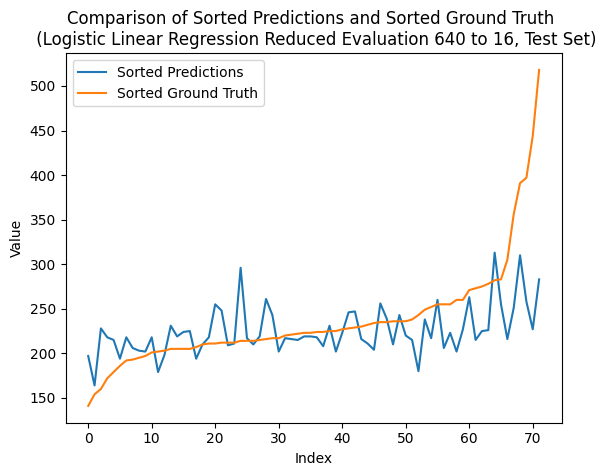

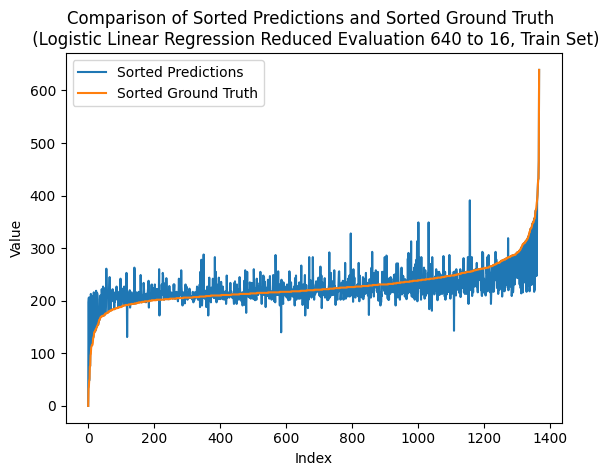

---- ---- ----
class_num = 656
Number of unique elements: 205
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.5923932194189757
Coefficient of determination (R-squared score, R2 score): 0.30293159609120524
train eval:
Mean squared error: 0.6286549707602339
Correlation coefficient: 0.6773019578596857
Coefficient of determination (R-squared score, R2 score): 0.4020784543325526


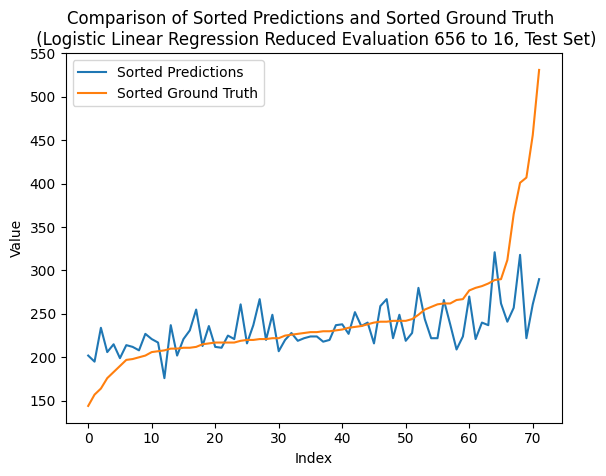

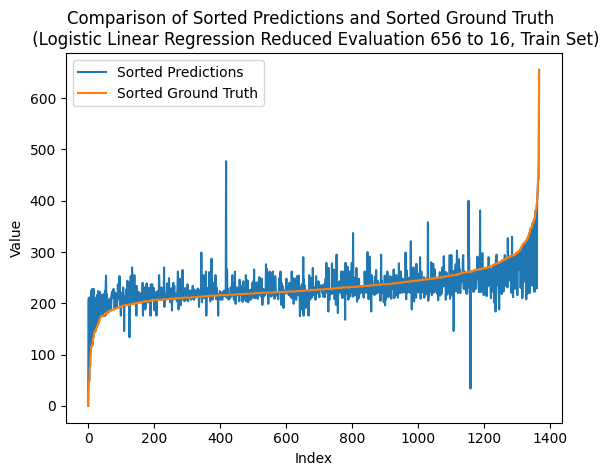

---- ---- ----
class_num = 672
Number of unique elements: 203
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 1.4027777777777777
Correlation coefficient: 0.6382559202772193
Coefficient of determination (R-squared score, R2 score): 0.3420195439739414
train eval:
Mean squared error: 0.6483918128654971
Correlation coefficient: 0.6575194283903864
Coefficient of determination (R-squared score, R2 score): 0.3833064988290398


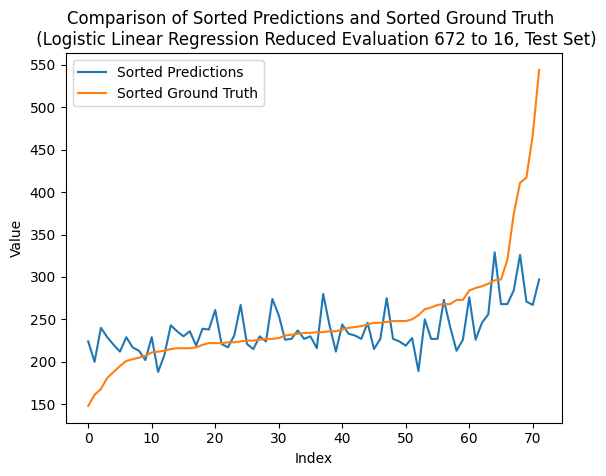

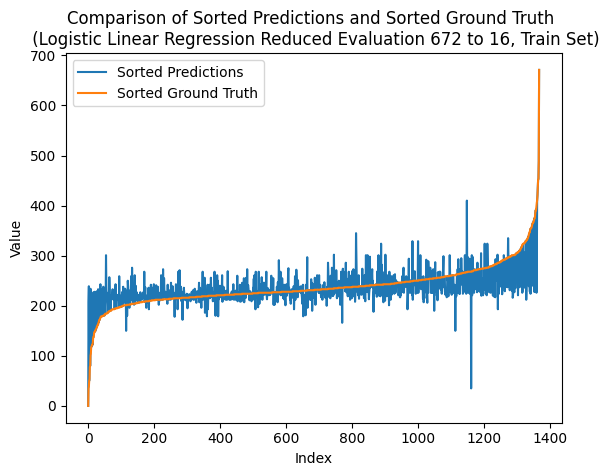

---- ---- ----
class_num = 688
Number of unique elements: 213
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4780477320108188
Coefficient of determination (R-squared score, R2 score): 0.2052117263843648
train eval:
Mean squared error: 0.597953216374269
Correlation coefficient: 0.6869243830003194
Coefficient of determination (R-squared score, R2 score): 0.4312792740046838


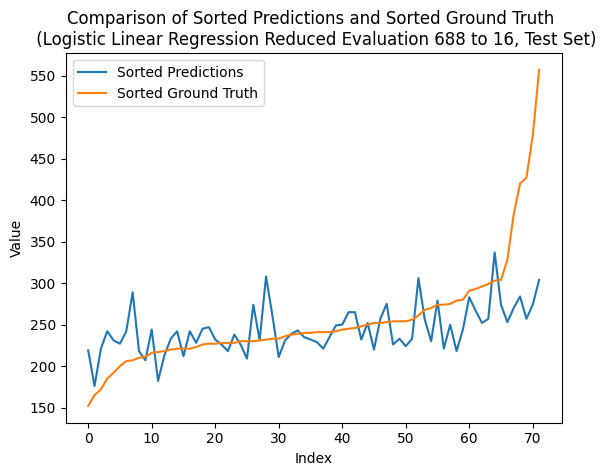

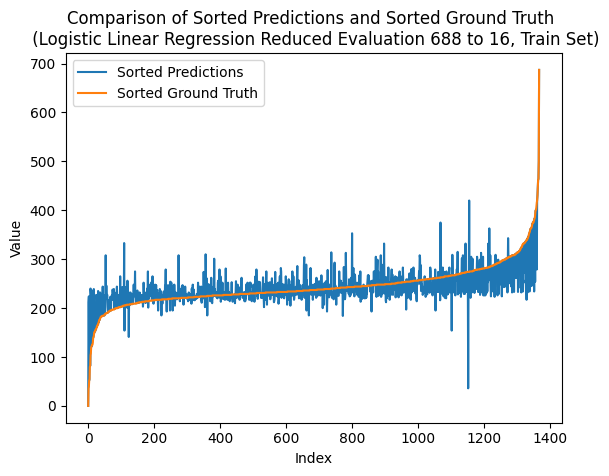

---- ---- ----
class_num = 704
Number of unique elements: 215
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.5750167522660478
Coefficient of determination (R-squared score, R2 score): 0.30293159609120524
train eval:
Mean squared error: 0.5760233918128655
Correlation coefficient: 0.6982796794036972
Coefficient of determination (R-squared score, R2 score): 0.45213700234192034


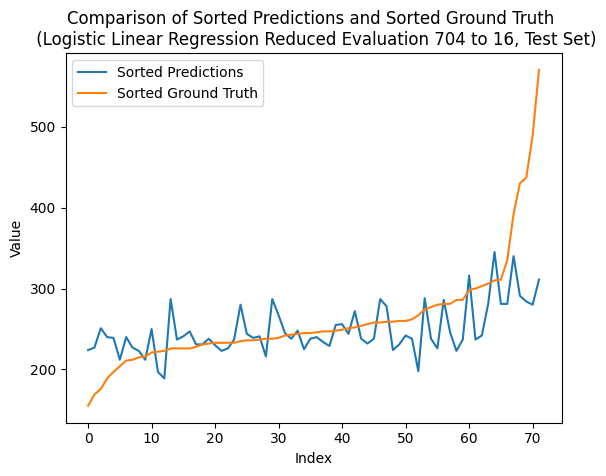

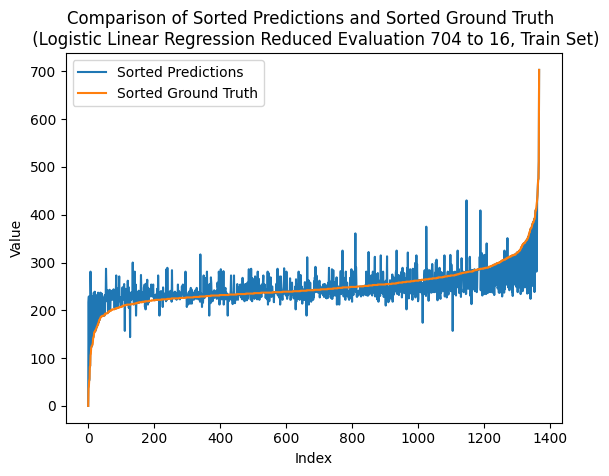

---- ---- ----
class_num = 720
Number of unique elements: 221
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.39907407957233315
Coefficient of determination (R-squared score, R2 score): 0.1140065146579805
train eval:
Mean squared error: 0.5723684210526315
Correlation coefficient: 0.705239680021681
Coefficient of determination (R-squared score, R2 score): 0.4556132903981265


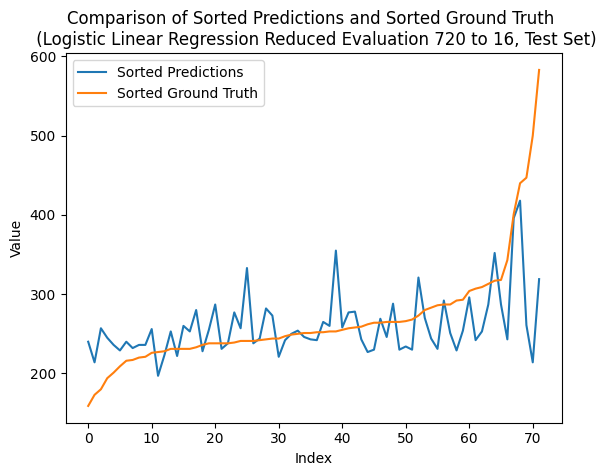

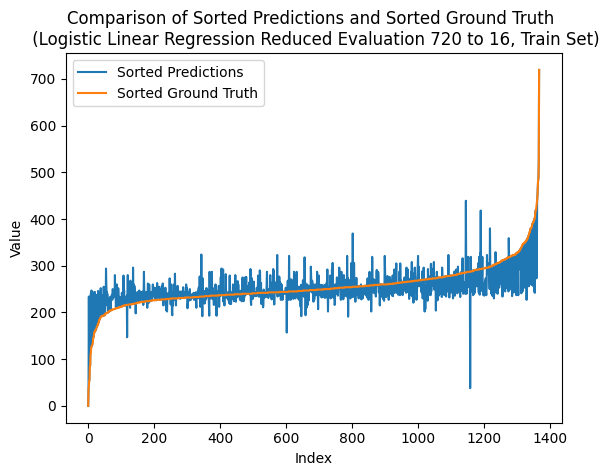

---- ---- ----
class_num = 736
Number of unique elements: 218
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5743742071571021
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.5350877192982456
Correlation coefficient: 0.72189282754564
Coefficient of determination (R-squared score, R2 score): 0.4910714285714286


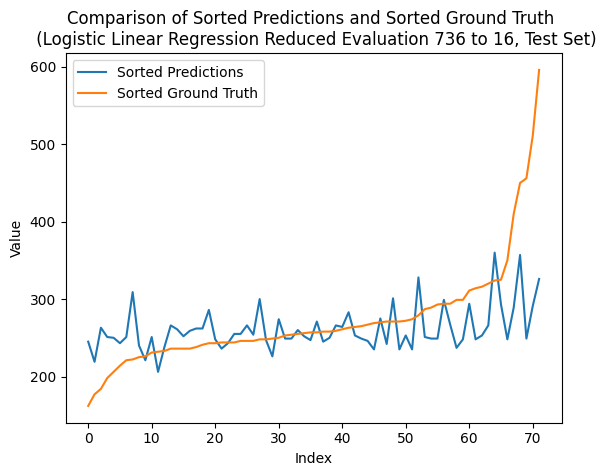

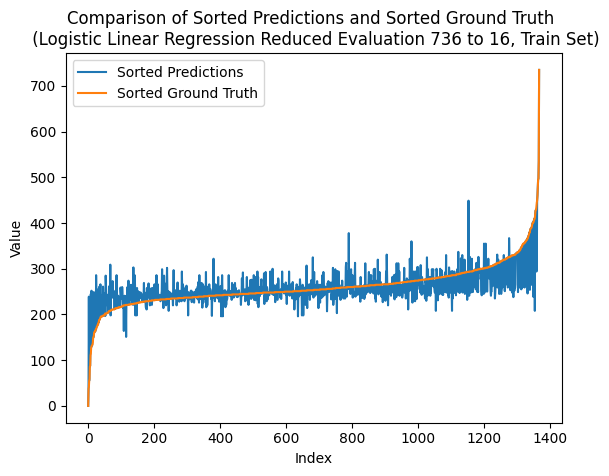

---- ---- ----
class_num = 752
Number of unique elements: 225
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5010304257363728
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.5833333333333334
Correlation coefficient: 0.693763885060279
Coefficient of determination (R-squared score, R2 score): 0.44518442622950816


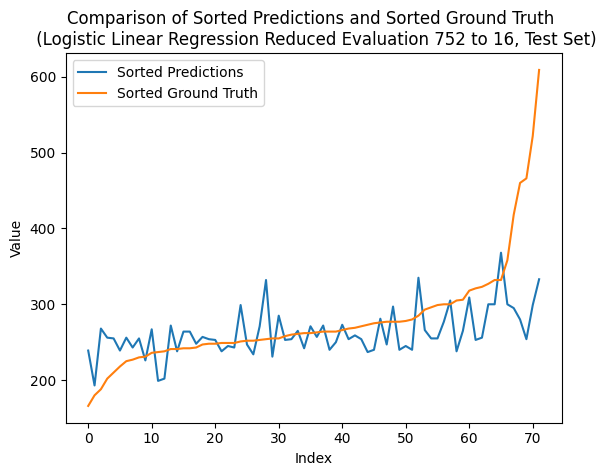

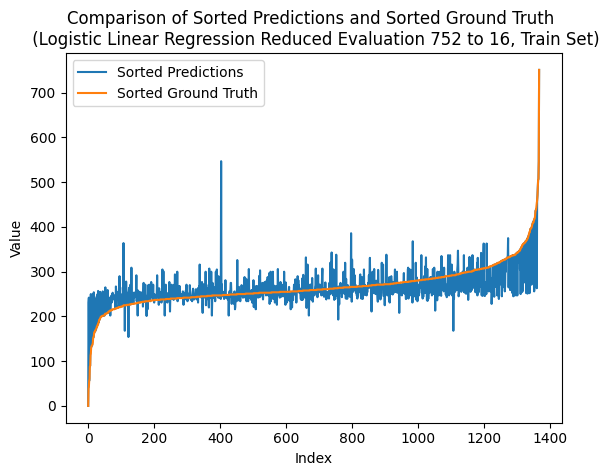

---- ---- ----
class_num = 768
Number of unique elements: 229
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.6156107380159646
Coefficient of determination (R-squared score, R2 score): 0.32899022801302935
train eval:
Mean squared error: 0.6052631578947368
Correlation coefficient: 0.6868561726238888
Coefficient of determination (R-squared score, R2 score): 0.4243266978922716


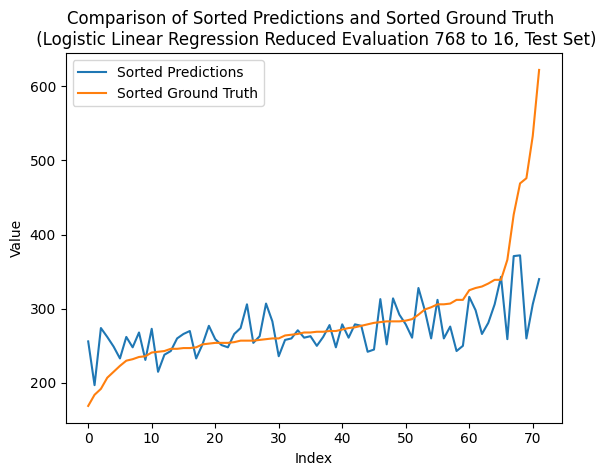

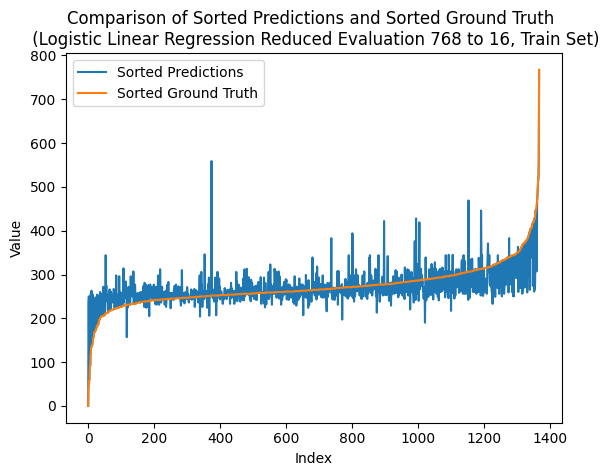

---- ---- ----
class_num = 784
Number of unique elements: 227
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 1.3888888888888888
Correlation coefficient: 0.6057680736078644
Coefficient of determination (R-squared score, R2 score): 0.34853420195439744
train eval:
Mean squared error: 0.618421052631579
Correlation coefficient: 0.6788302393040565
Coefficient of determination (R-squared score, R2 score): 0.4118120608899297


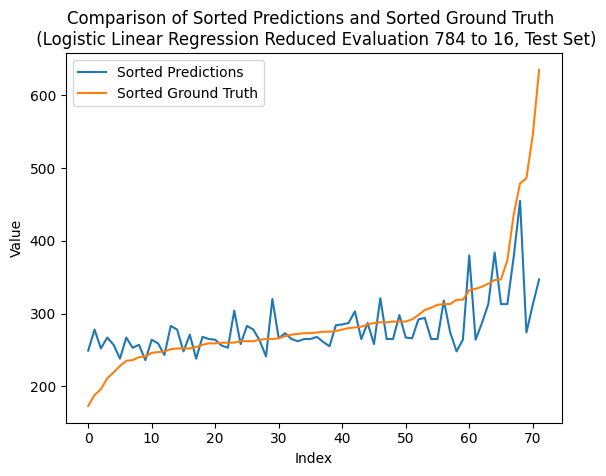

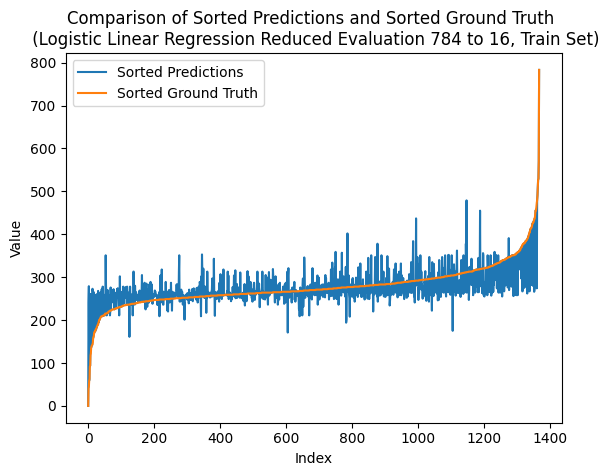

---- ---- ----
class_num = 800
Number of unique elements: 236
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.5968664849172938
Coefficient of determination (R-squared score, R2 score): 0.3159609120521173
train eval:
Mean squared error: 0.6542397660818714
Correlation coefficient: 0.6621183952014578
Coefficient of determination (R-squared score, R2 score): 0.37774443793911006


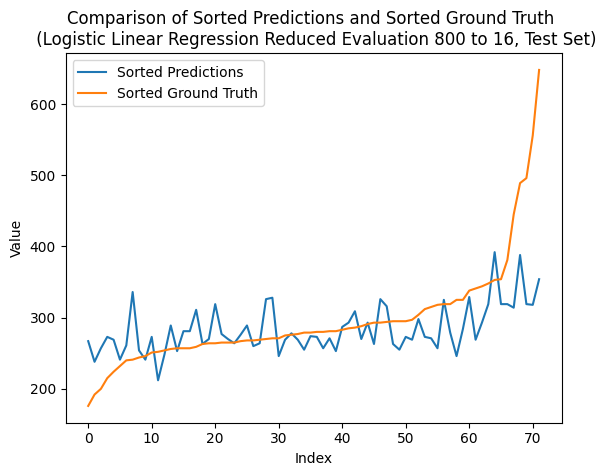

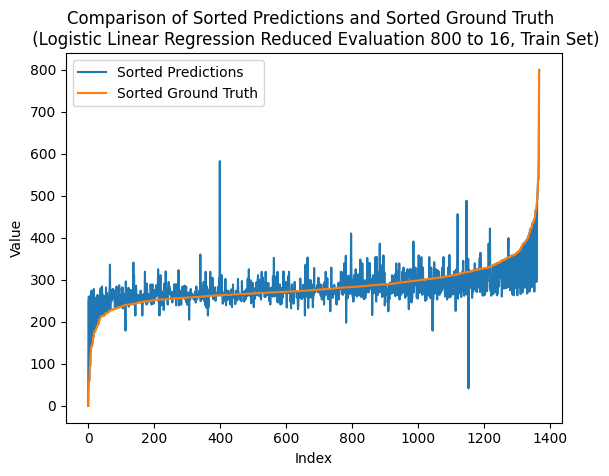

---- ---- ----
class_num = 816
Number of unique elements: 235
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.4034109063435695
Coefficient of determination (R-squared score, R2 score): 0.1400651465798045
train eval:
Mean squared error: 0.6030701754385965
Correlation coefficient: 0.6811386028214863
Coefficient of determination (R-squared score, R2 score): 0.4264124707259953


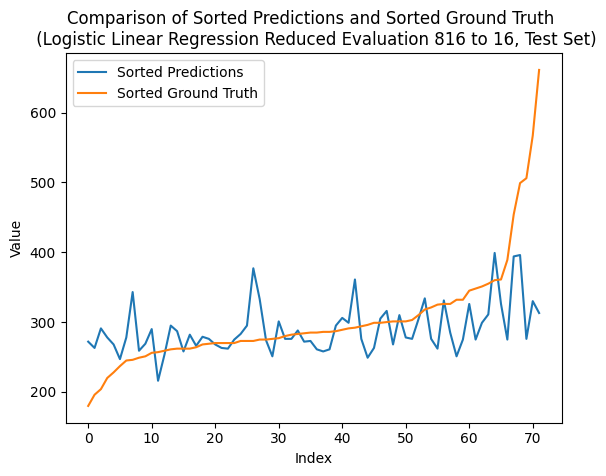

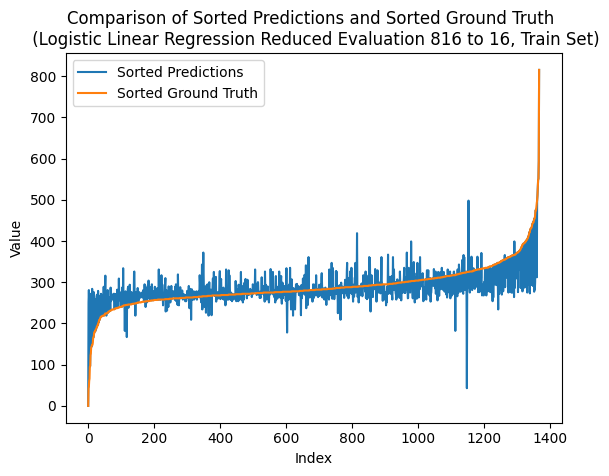

---- ---- ----
class_num = 832
Number of unique elements: 236
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 1.5
Correlation coefficient: 0.5715309513900094
Coefficient of determination (R-squared score, R2 score): 0.2964169381107492
train eval:
Mean squared error: 0.5855263157894737
Correlation coefficient: 0.6944250335838067
Coefficient of determination (R-squared score, R2 score): 0.44309865339578447


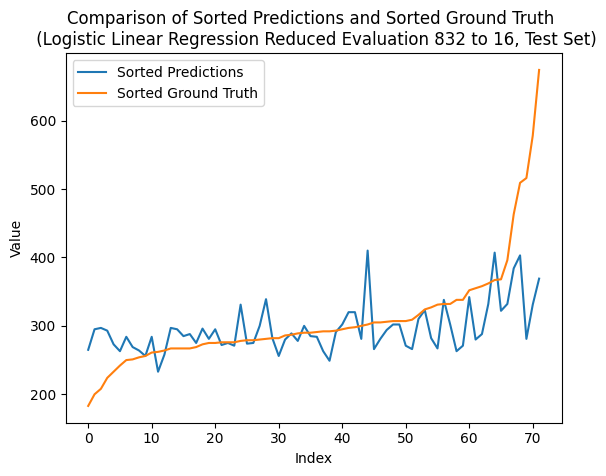

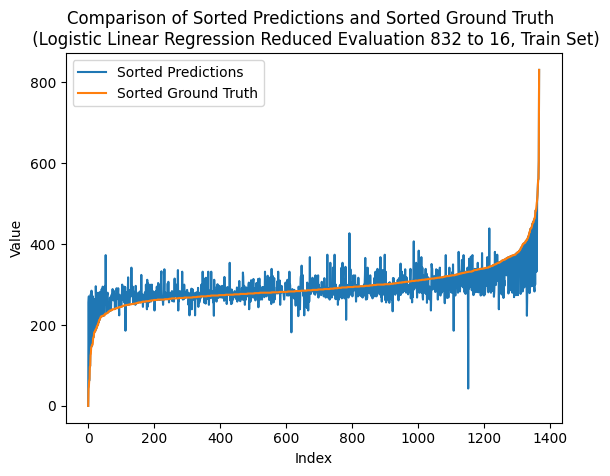

---- ---- ----
class_num = 848
Number of unique elements: 243
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 1.4861111111111112
Correlation coefficient: 0.5825702816857419
Coefficient of determination (R-squared score, R2 score): 0.30293159609120524
train eval:
Mean squared error: 0.5950292397660819
Correlation coefficient: 0.6912974767405641
Coefficient of determination (R-squared score, R2 score): 0.4340603044496487


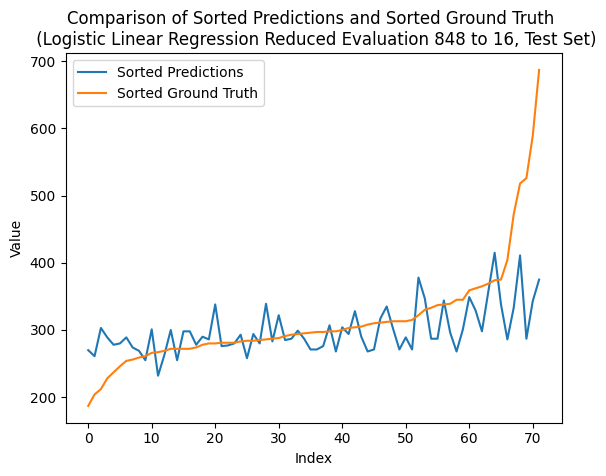

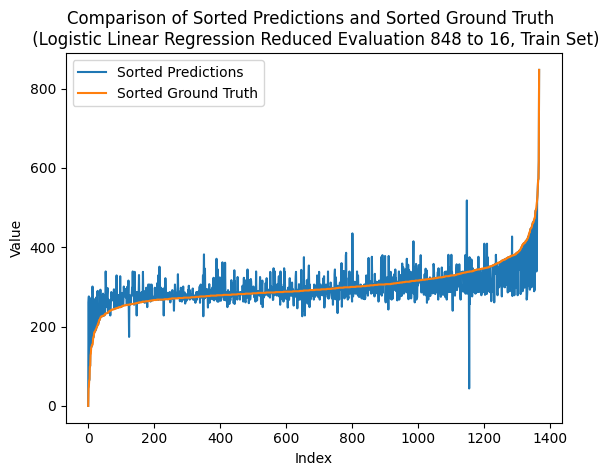

---- ---- ----
class_num = 864
Number of unique elements: 244
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.6039725004429372
Coefficient of determination (R-squared score, R2 score): 0.3224755700325733
train eval:
Mean squared error: 0.5862573099415205
Correlation coefficient: 0.6991067794014001
Coefficient of determination (R-squared score, R2 score): 0.44240339578454335


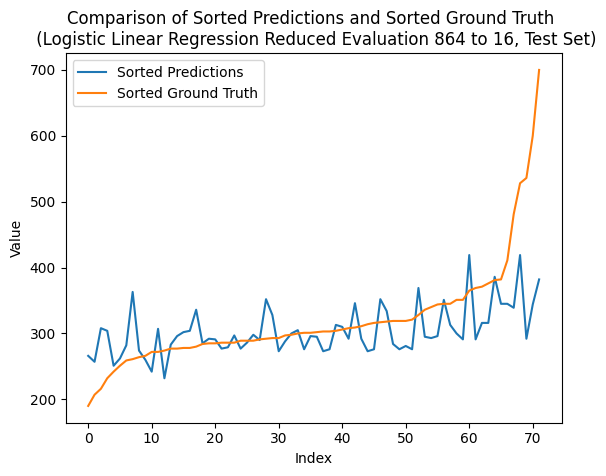

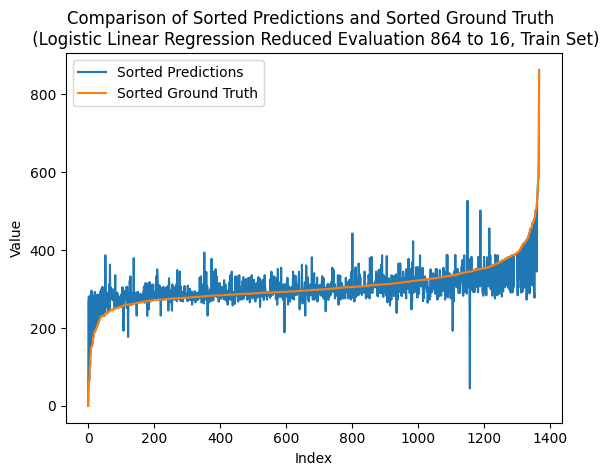

---- ---- ----
class_num = 880
Number of unique elements: 249
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 1.2916666666666667
Correlation coefficient: 0.6760530527158513
Coefficient of determination (R-squared score, R2 score): 0.39413680781758953
train eval:
Mean squared error: 0.6038011695906432
Correlation coefficient: 0.6907047161557571
Coefficient of determination (R-squared score, R2 score): 0.4257172131147541


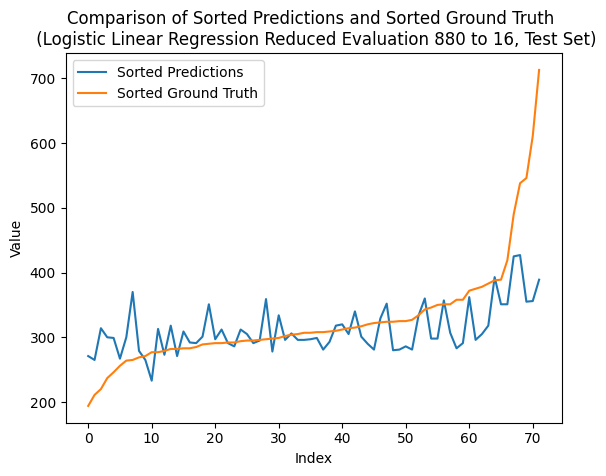

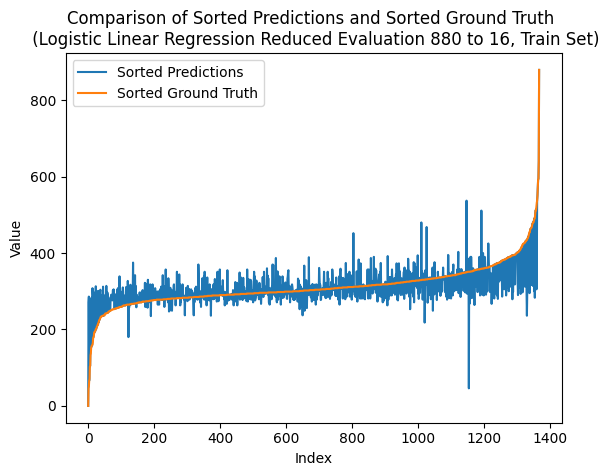

---- ---- ----
class_num = 896
Number of unique elements: 254
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 1.4027777777777777
Correlation coefficient: 0.6150182537086277
Coefficient of determination (R-squared score, R2 score): 0.3420195439739414
train eval:
Mean squared error: 0.581140350877193
Correlation coefficient: 0.6940883033864598
Coefficient of determination (R-squared score, R2 score): 0.44727019906323184


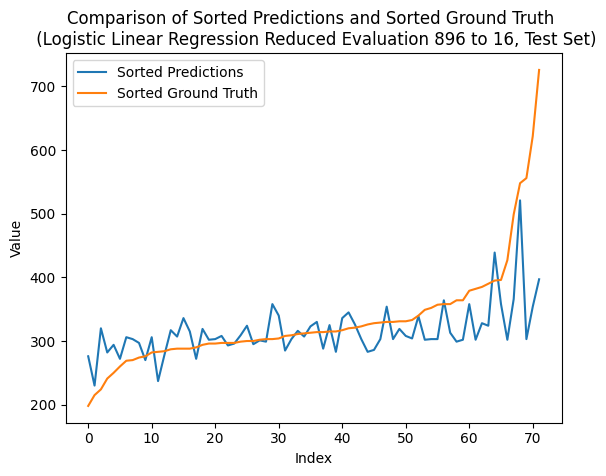

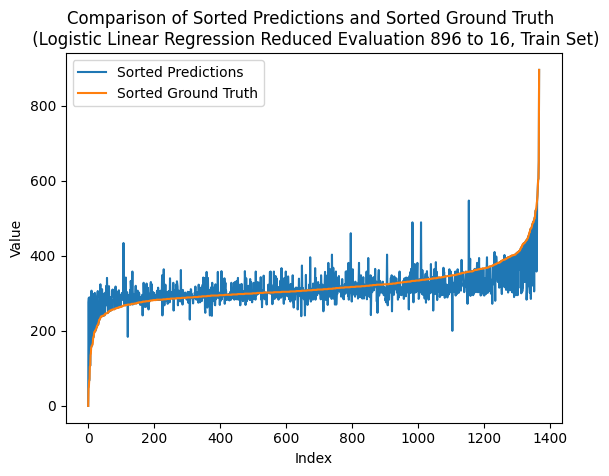

---- ---- ----
class_num = 912
Number of unique elements: 254
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6140415180223243
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.6162280701754386
Correlation coefficient: 0.6792224908744781
Coefficient of determination (R-squared score, R2 score): 0.4138978337236534


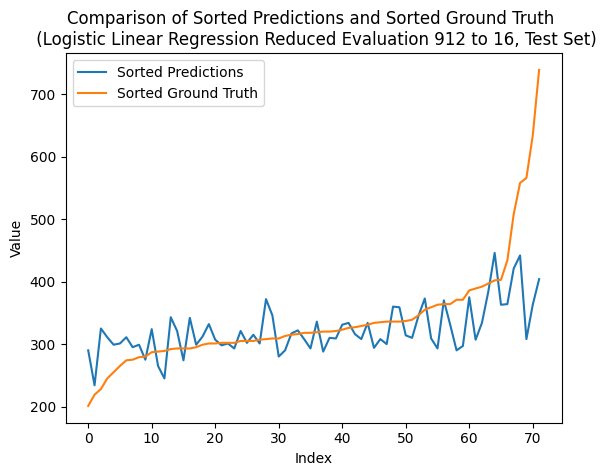

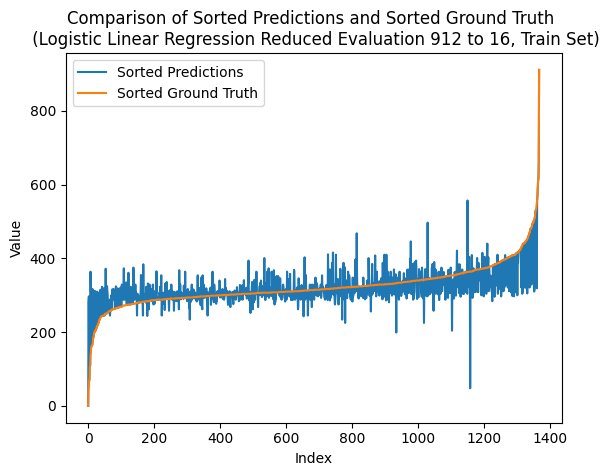

---- ---- ----
class_num = 928
Number of unique elements: 254
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5310477939769898
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.6081871345029239
Correlation coefficient: 0.6813806782778823
Coefficient of determination (R-squared score, R2 score): 0.4215456674473068


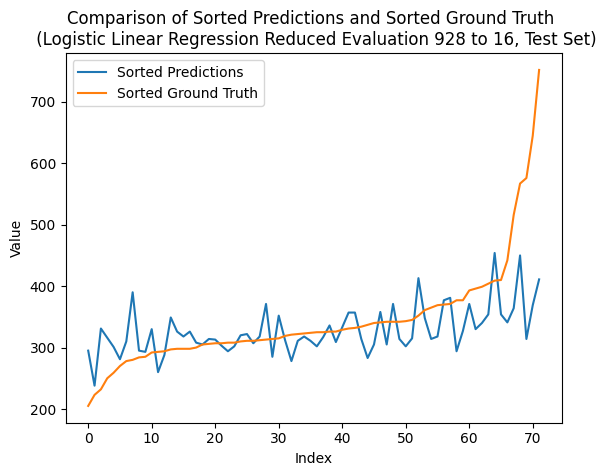

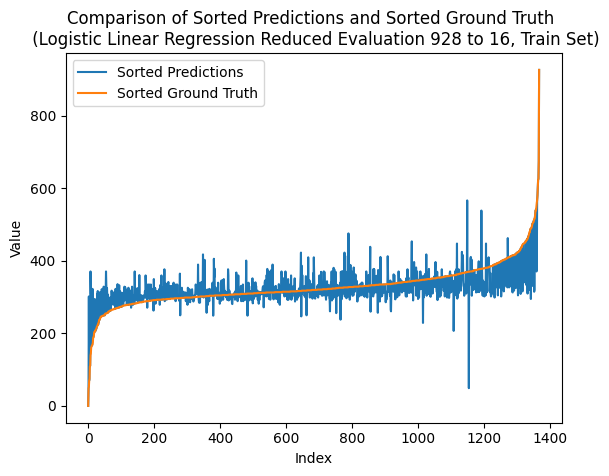

---- ---- ----
class_num = 944
Number of unique elements: 261
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5392892967193699
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.591374269005848
Correlation coefficient: 0.6930326047661112
Coefficient of determination (R-squared score, R2 score): 0.43753659250585475


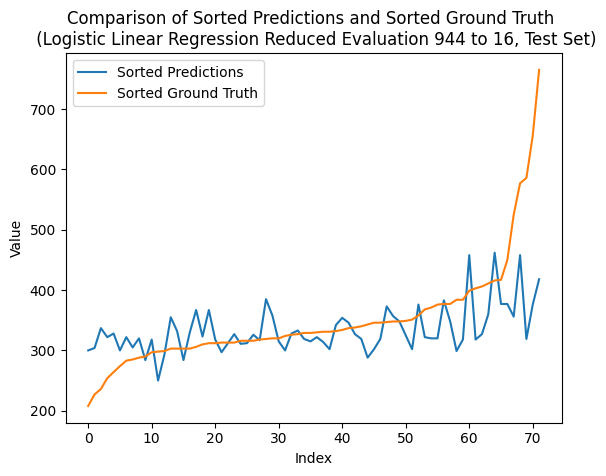

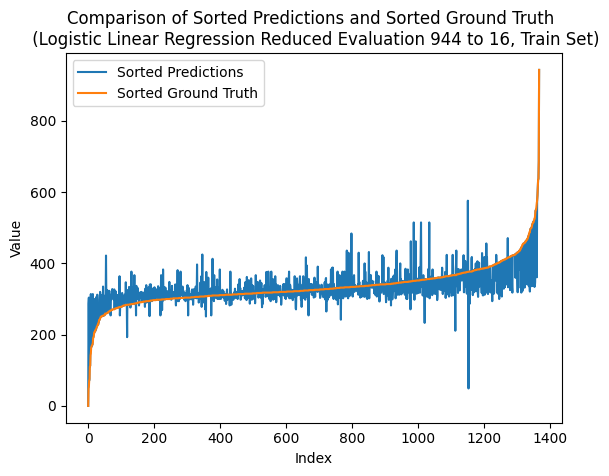

---- ---- ----
class_num = 960
Number of unique elements: 262
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.4451307661851422
Coefficient of determination (R-squared score, R2 score): 0.18566775244299671
train eval:
Mean squared error: 0.6059941520467836
Correlation coefficient: 0.6875857014963344
Coefficient of determination (R-squared score, R2 score): 0.4236314402810304


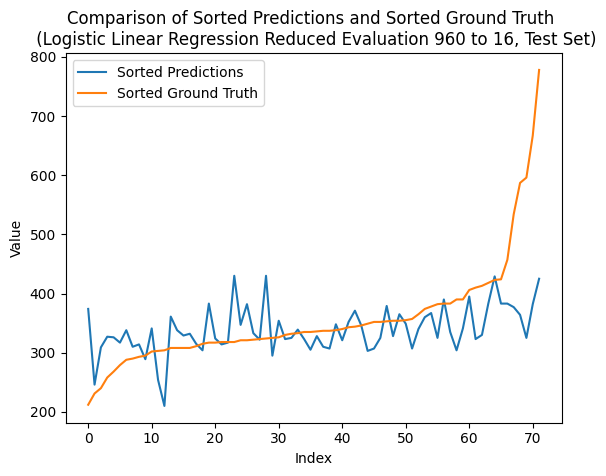

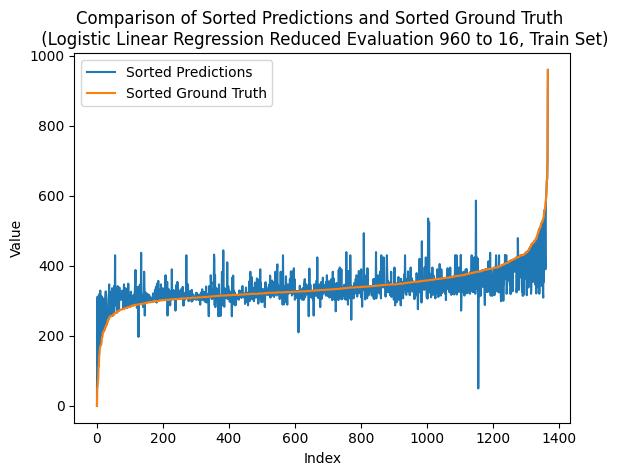

---- ---- ----
class_num = 976
Number of unique elements: 262
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.39852256668393543
Coefficient of determination (R-squared score, R2 score): 0.1400651465798045
train eval:
Mean squared error: 0.5716374269005848
Correlation coefficient: 0.7061942065327558
Coefficient of determination (R-squared score, R2 score): 0.4563085480093677


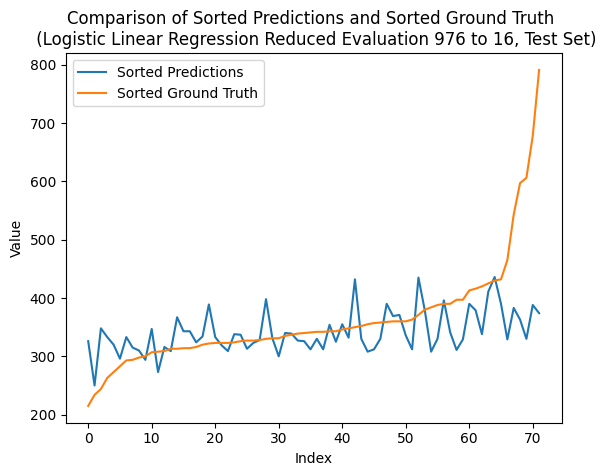

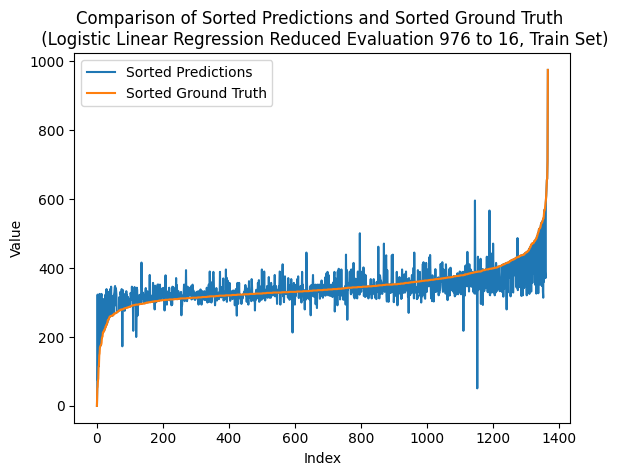

---- ---- ----
class_num = 992
Number of unique elements: 268
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.5167363556195188
Coefficient of determination (R-squared score, R2 score): 0.23778501628664495
train eval:
Mean squared error: 0.6301169590643275
Correlation coefficient: 0.6674284002750849
Coefficient of determination (R-squared score, R2 score): 0.4006879391100703


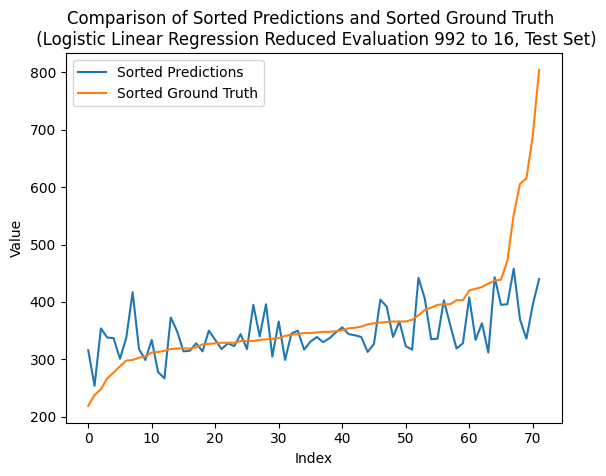

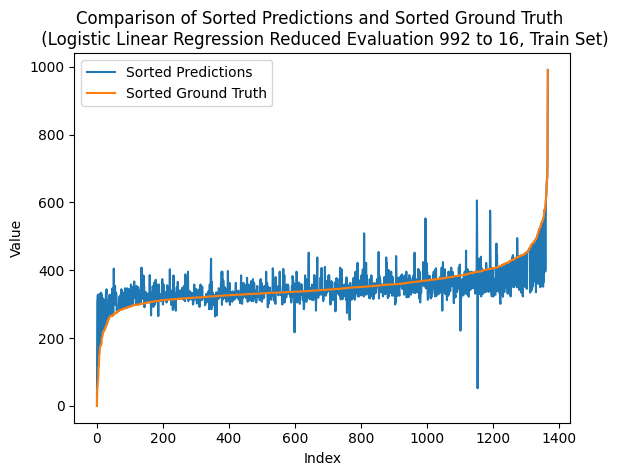

---- ---- ----
class_num = 1008
Number of unique elements: 271
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4715580477518803
Coefficient of determination (R-squared score, R2 score): 0.19218241042345274
train eval:
Mean squared error: 0.6081871345029239
Correlation coefficient: 0.6815770333508997
Coefficient of determination (R-squared score, R2 score): 0.4215456674473068


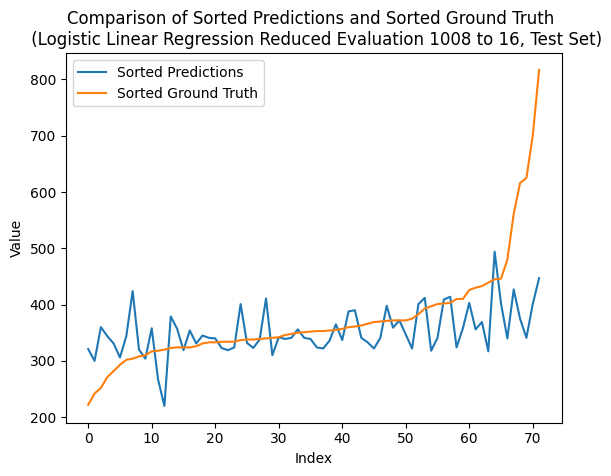

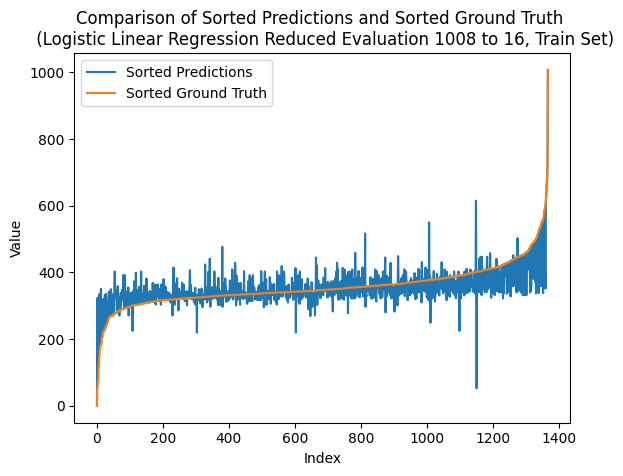

---- ---- ----
class_num = 1024
Number of unique elements: 268
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5594237535246348
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.5796783625730995
Correlation coefficient: 0.7011516121944541
Coefficient of determination (R-squared score, R2 score): 0.4486607142857143


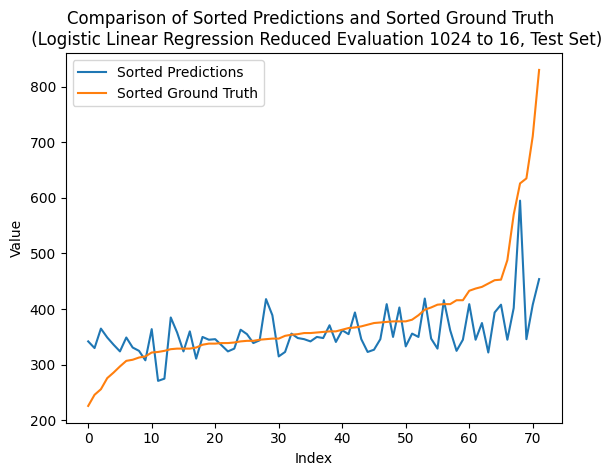

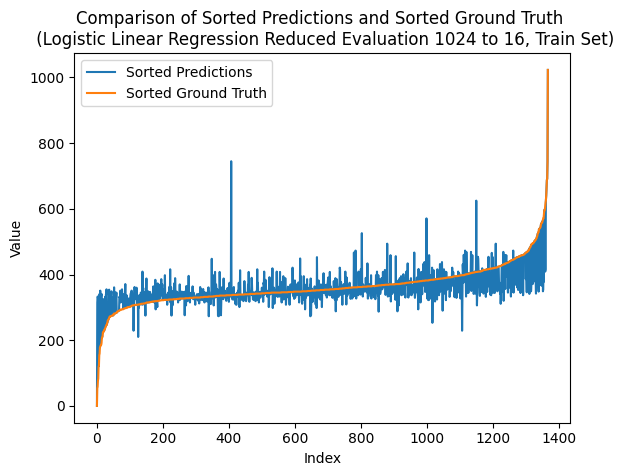

---- ---- ----
class_num = 1040
Number of unique elements: 275
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5255272094292914
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.5533625730994152
Correlation coefficient: 0.7136728775631658
Coefficient of determination (R-squared score, R2 score): 0.4736899882903981


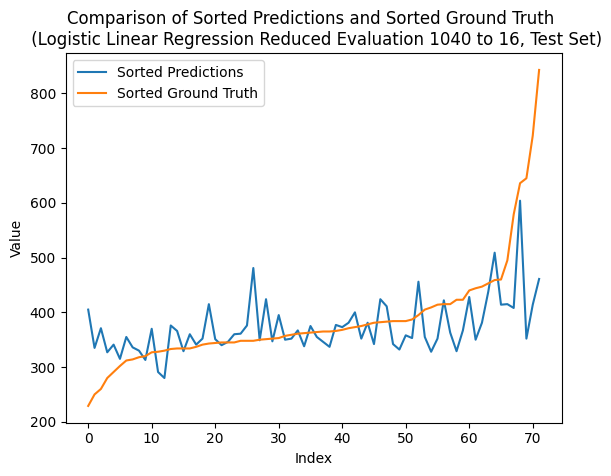

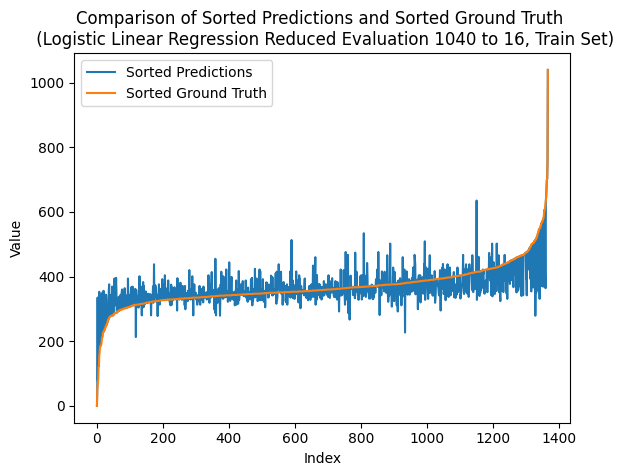

---- ---- ----
class_num = 1056
Number of unique elements: 280
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.49529867810607997
Coefficient of determination (R-squared score, R2 score): 0.2247557003257329
train eval:
Mean squared error: 0.5672514619883041
Correlation coefficient: 0.7129715292819508
Coefficient of determination (R-squared score, R2 score): 0.46048009367681497


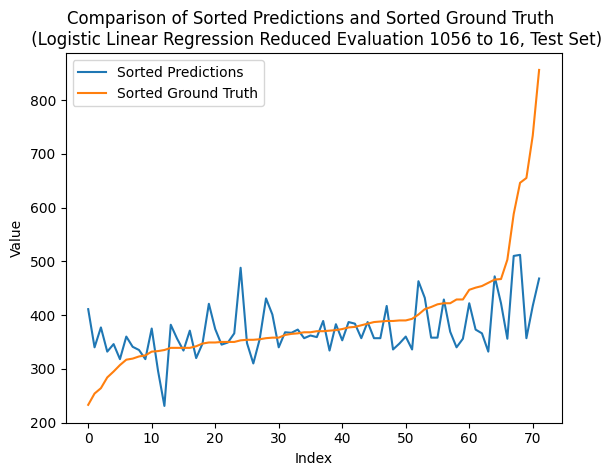

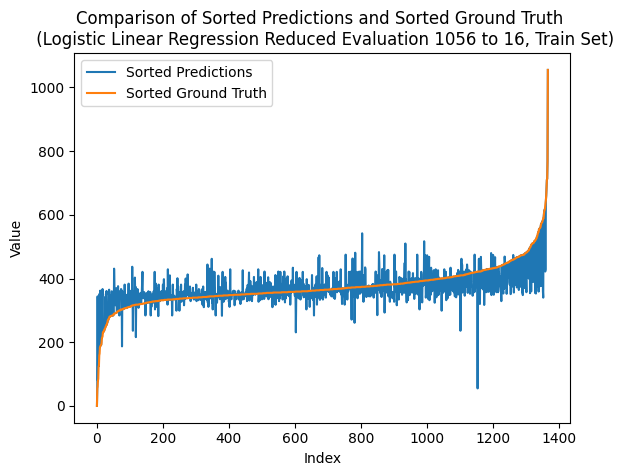

---- ---- ----
class_num = 1072
Number of unique elements: 277
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5216983422166765
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.5891812865497076
Correlation coefficient: 0.6949717953798652
Coefficient of determination (R-squared score, R2 score): 0.43962236533957844


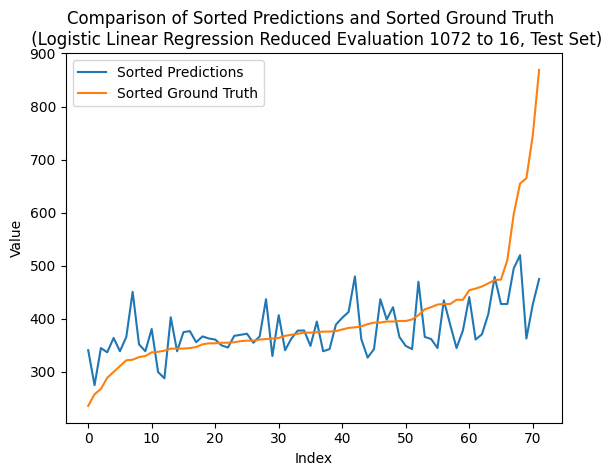

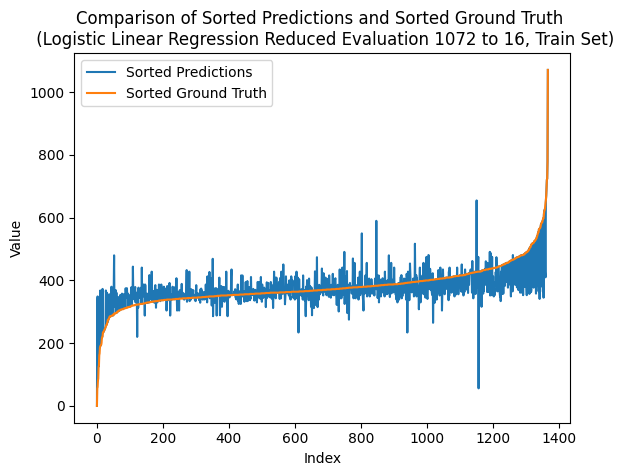

---- ---- ----
class_num = 1088
Number of unique elements: 283
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5010304257363728
Coefficient of determination (R-squared score, R2 score): 0.21824104234527686
train eval:
Mean squared error: 0.5891812865497076
Correlation coefficient: 0.6955899741662834
Coefficient of determination (R-squared score, R2 score): 0.43962236533957844


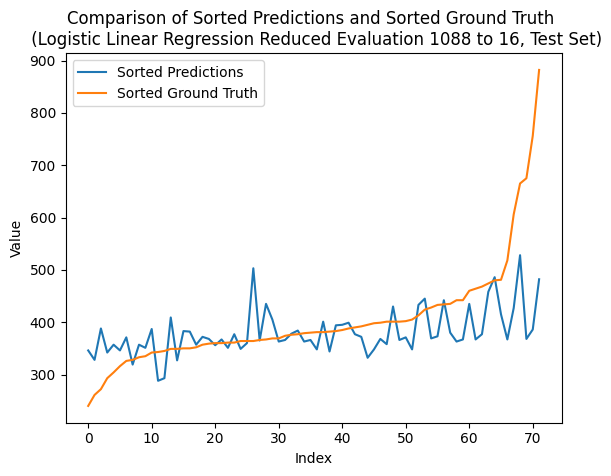

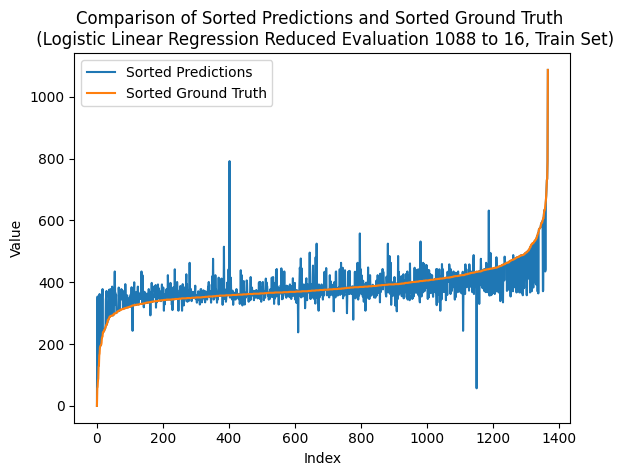

---- ---- ----
class_num = 1104
Number of unique elements: 287
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.4878916801574371
Coefficient of determination (R-squared score, R2 score): 0.21172638436482083
train eval:
Mean squared error: 0.5168128654970761
Correlation coefficient: 0.7361975758556344
Coefficient of determination (R-squared score, R2 score): 0.508452868852459


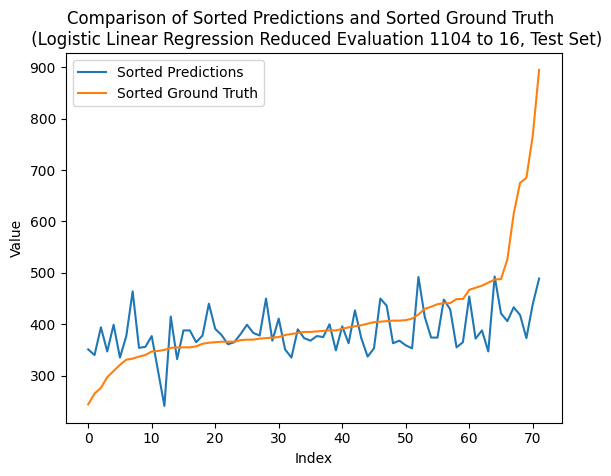

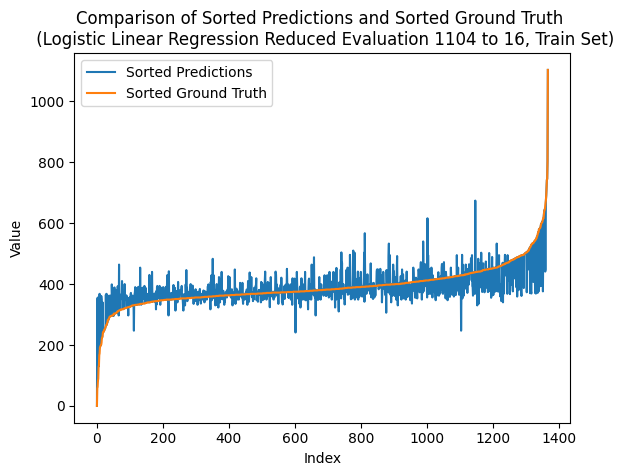

---- ---- ----
class_num = 1120
Number of unique elements: 288
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5297619261544694
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.533625730994152
Correlation coefficient: 0.7244223661610049
Coefficient of determination (R-squared score, R2 score): 0.49246194379391095


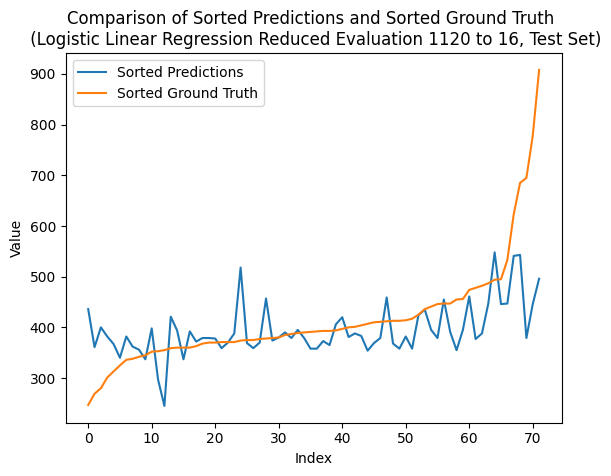

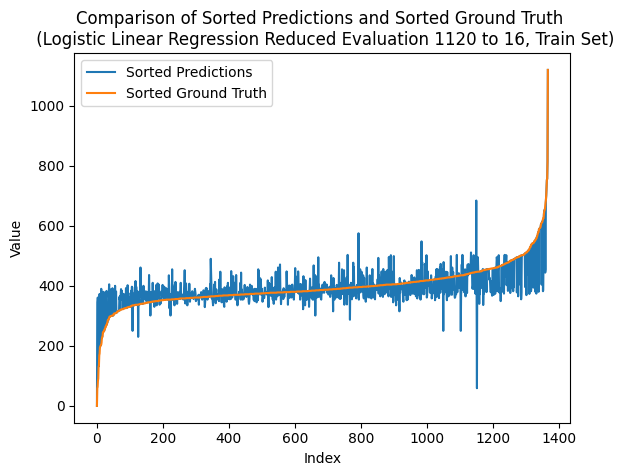

---- ---- ----
class_num = 1136
Number of unique elements: 291
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4583512101082514
Coefficient of determination (R-squared score, R2 score): 0.19218241042345274
train eval:
Mean squared error: 0.5950292397660819
Correlation coefficient: 0.7008529882763129
Coefficient of determination (R-squared score, R2 score): 0.4340603044496487


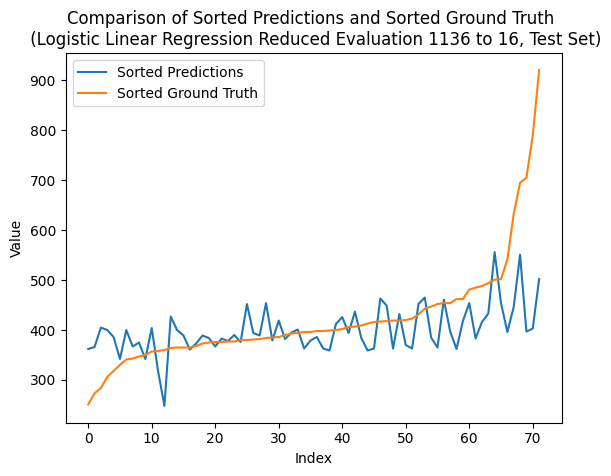

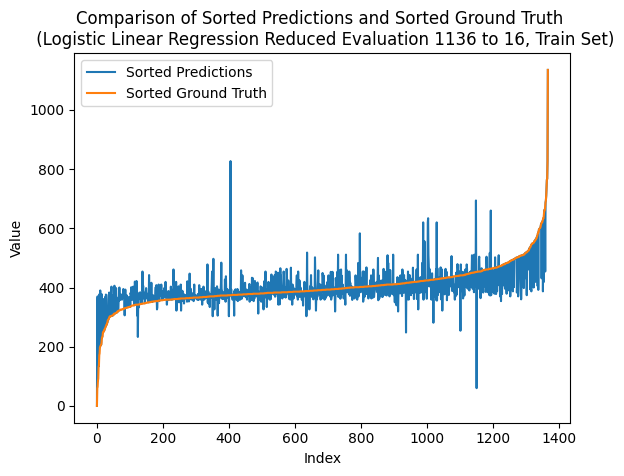

---- ---- ----
class_num = 1152
Number of unique elements: 300
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.5926691704382984
Coefficient of determination (R-squared score, R2 score): 0.3224755700325733
train eval:
Mean squared error: 0.5614035087719298
Correlation coefficient: 0.7153230271552445
Coefficient of determination (R-squared score, R2 score): 0.4660421545667447


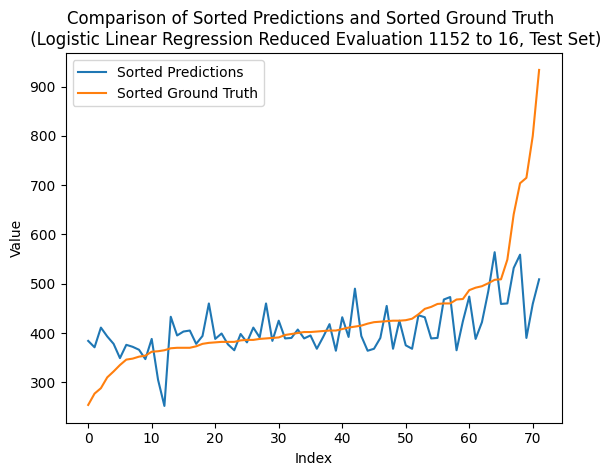

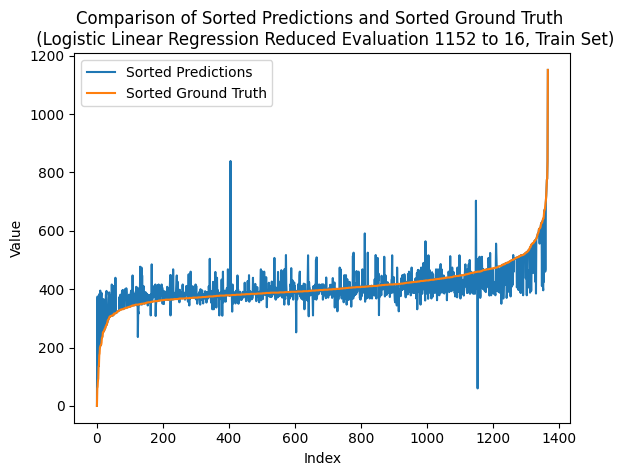

---- ---- ----
class_num = 1168
Number of unique elements: 300
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.5105087869285634
Coefficient of determination (R-squared score, R2 score): 0.24429967426710097
train eval:
Mean squared error: 0.5767543859649122
Correlation coefficient: 0.7045128200099581
Coefficient of determination (R-squared score, R2 score): 0.4514417447306791


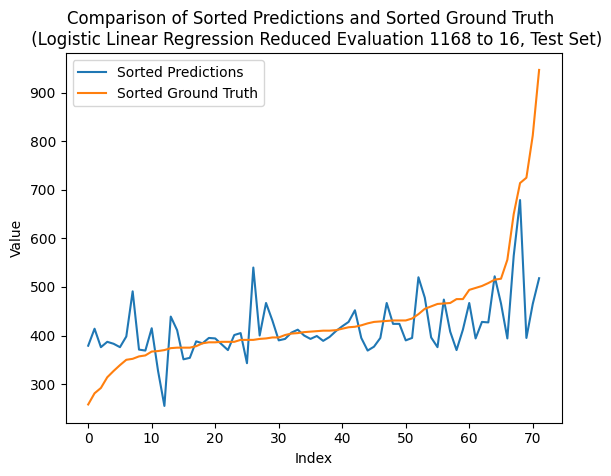

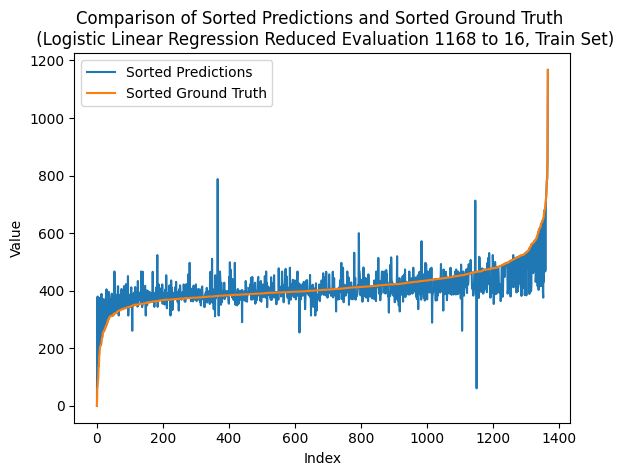

---- ---- ----
class_num = 1184
Number of unique elements: 296
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.5583393294276271
Coefficient of determination (R-squared score, R2 score): 0.2899022801302932
train eval:
Mean squared error: 0.5584795321637427
Correlation coefficient: 0.7071711778387622
Coefficient of determination (R-squared score, R2 score): 0.4688231850117096


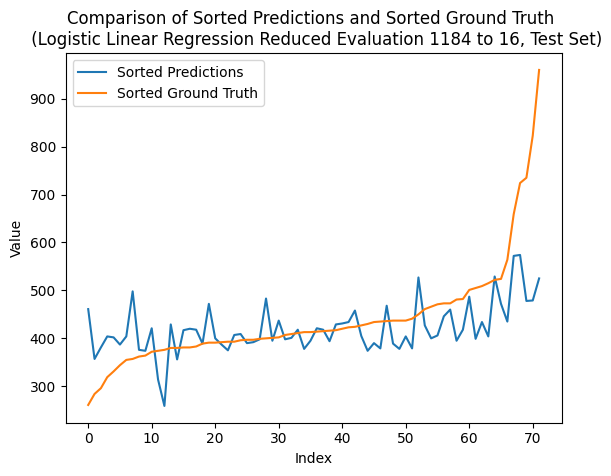

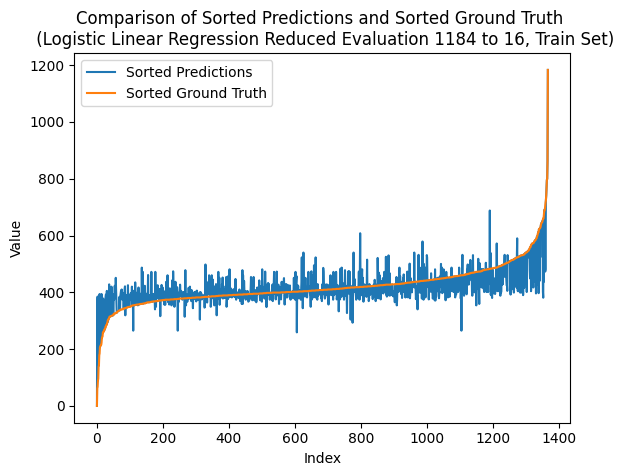

---- ---- ----
class_num = 1200
Number of unique elements: 301
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6406429994690709
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.6308479532163743
Correlation coefficient: 0.6847344832093157
Coefficient of determination (R-squared score, R2 score): 0.39999268149882905


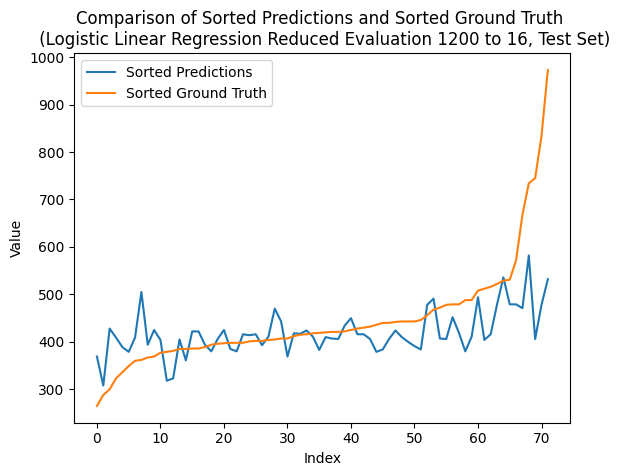

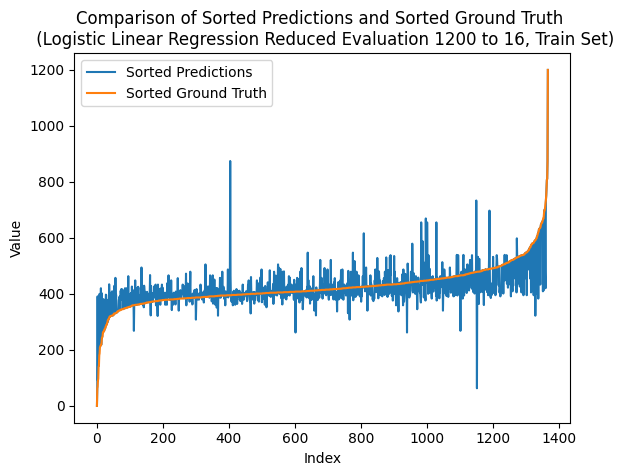

---- ---- ----
class_num = 1216
Number of unique elements: 302
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.5277214253503943
Coefficient of determination (R-squared score, R2 score): 0.250814332247557
train eval:
Mean squared error: 0.5826023391812866
Correlation coefficient: 0.7060147701036512
Coefficient of determination (R-squared score, R2 score): 0.4458796838407494


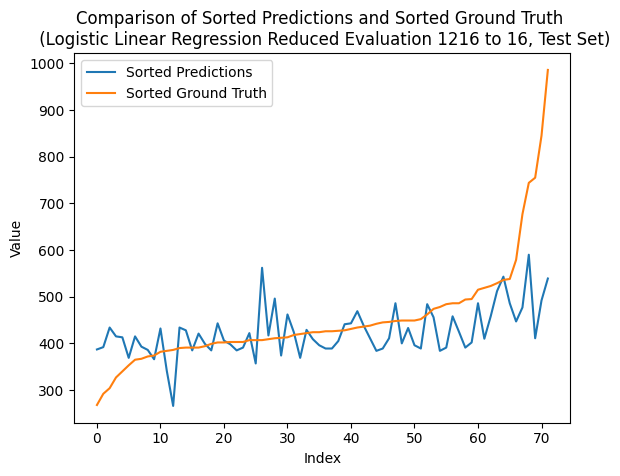

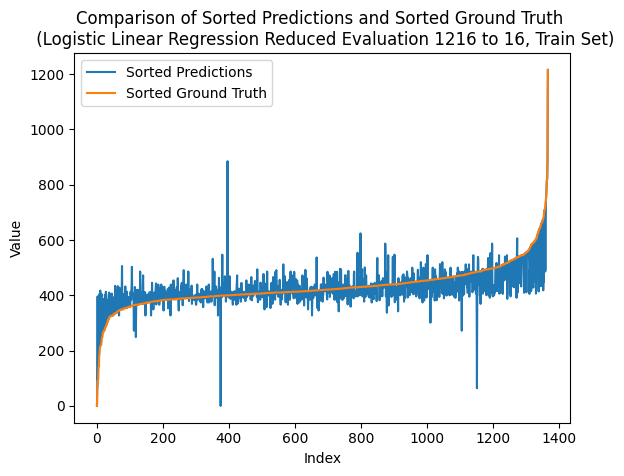

---- ---- ----
class_num = 1232
Number of unique elements: 312
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.4678678842673872
Coefficient of determination (R-squared score, R2 score): 0.18566775244299671
train eval:
Mean squared error: 0.527046783625731
Correlation coefficient: 0.7339956022068934
Coefficient of determination (R-squared score, R2 score): 0.4987192622950819


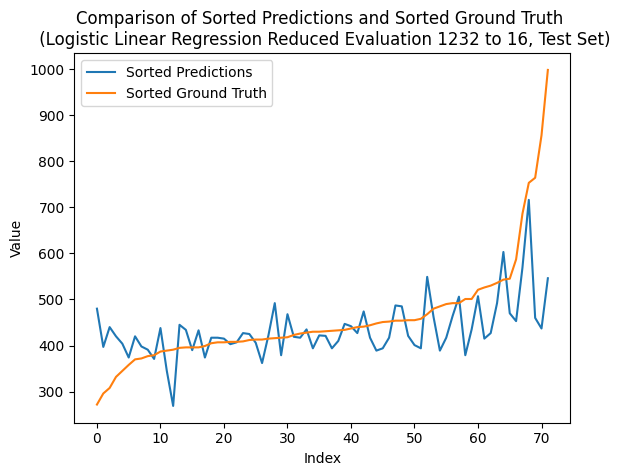

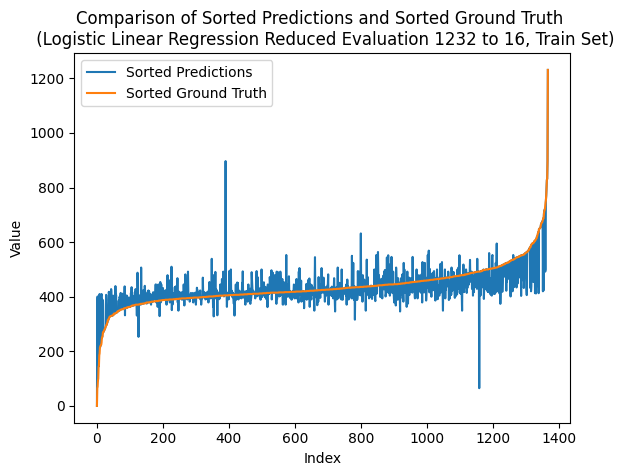

---- ---- ----
class_num = 1248
Number of unique elements: 306
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5396562690549118
Coefficient of determination (R-squared score, R2 score): 0.26384364820846906
train eval:
Mean squared error: 0.5423976608187134
Correlation coefficient: 0.7257588460602123
Coefficient of determination (R-squared score, R2 score): 0.4841188524590164


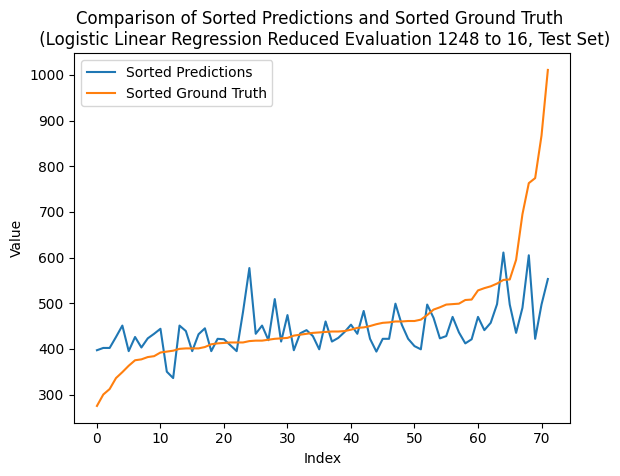

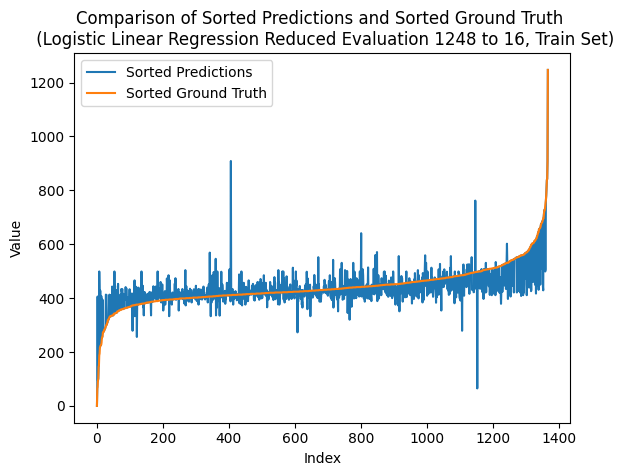

---- ---- ----
class_num = 1264
Number of unique elements: 312
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5431905736351329
Coefficient of determination (R-squared score, R2 score): 0.2703583061889251
train eval:
Mean squared error: 0.5562865497076024
Correlation coefficient: 0.7214365957522473
Coefficient of determination (R-squared score, R2 score): 0.4709089578454332


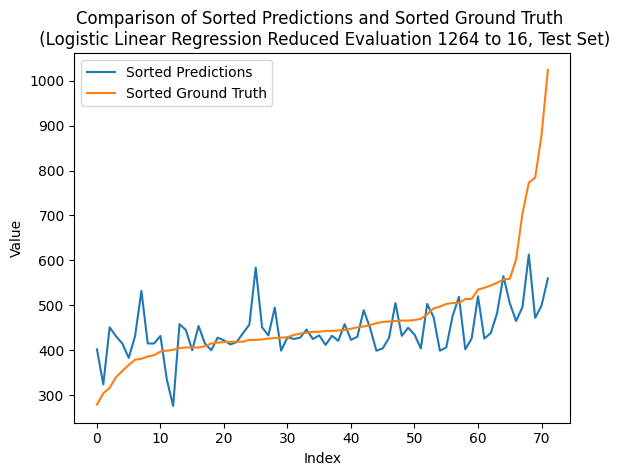

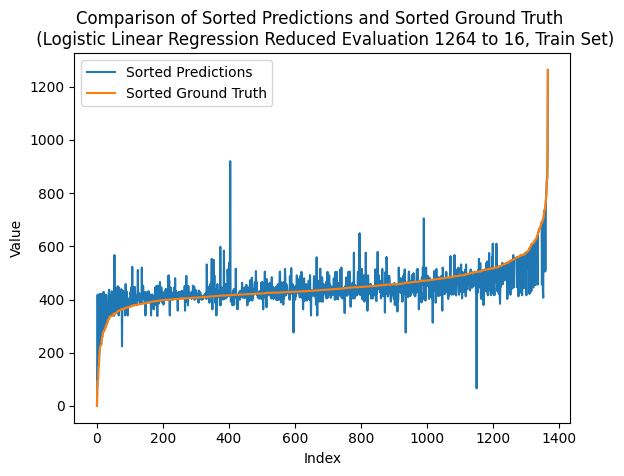

---- ---- ----
class_num = 1280
Number of unique elements: 318
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.5619975776322308
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.5445906432748538
Correlation coefficient: 0.7244389923999808
Coefficient of determination (R-squared score, R2 score): 0.48203307962529274


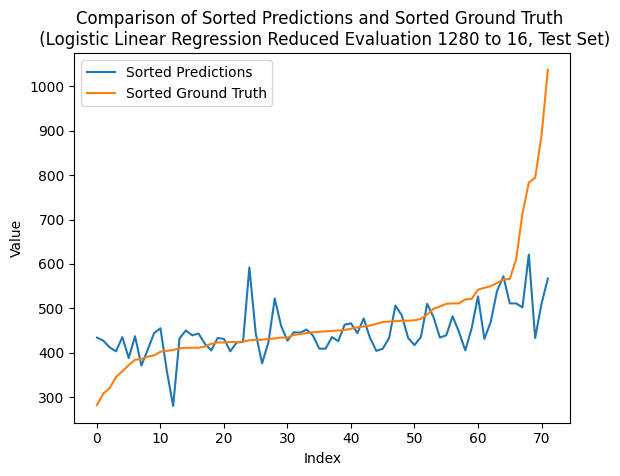

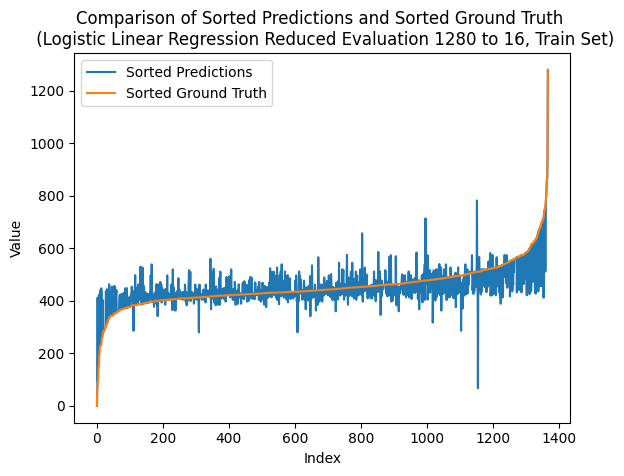

---- ---- ----
class_num = 1296
Number of unique elements: 321
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 1.5833333333333333
Correlation coefficient: 0.5229433856808514
Coefficient of determination (R-squared score, R2 score): 0.25732899022801303
train eval:
Mean squared error: 0.49853801169590645
Correlation coefficient: 0.7473845509412159
Coefficient of determination (R-squared score, R2 score): 0.5258343091334894


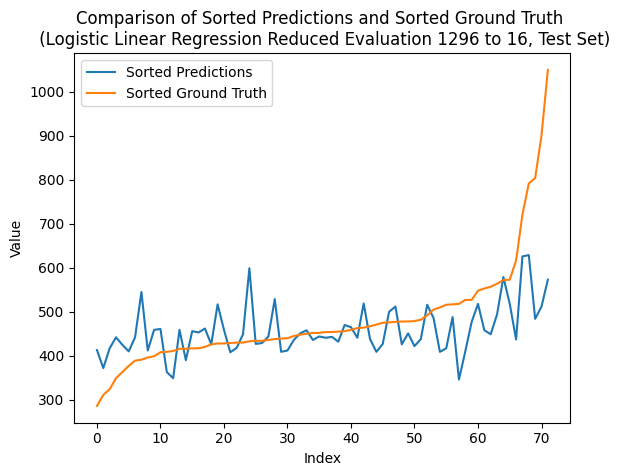

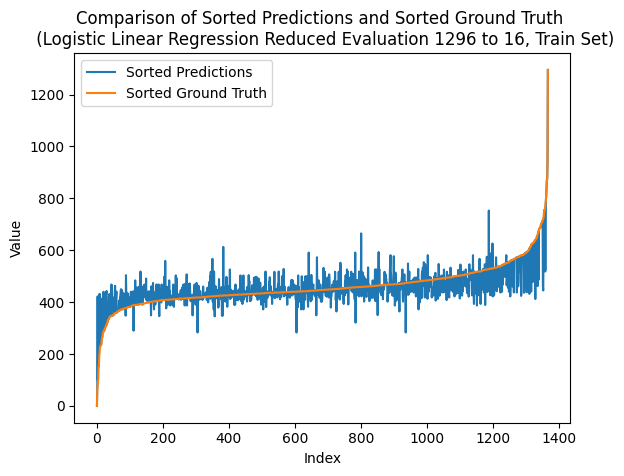

---- ---- ----
class_num = 1312
Number of unique elements: 320
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.5041708618821701
Coefficient of determination (R-squared score, R2 score): 0.2247557003257329
train eval:
Mean squared error: 0.5372807017543859
Correlation coefficient: 0.7268572780849163
Coefficient of determination (R-squared score, R2 score): 0.4889856557377049


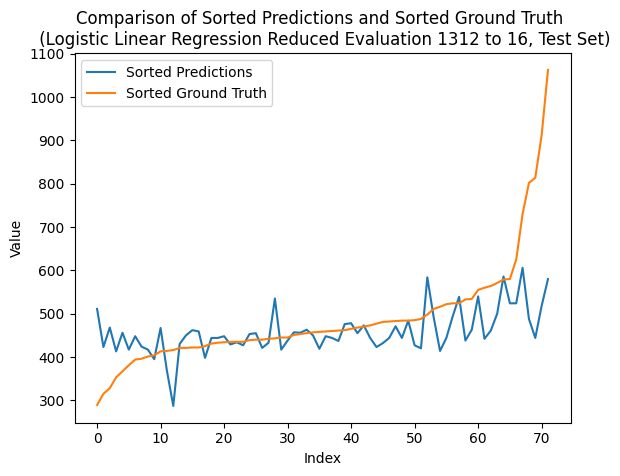

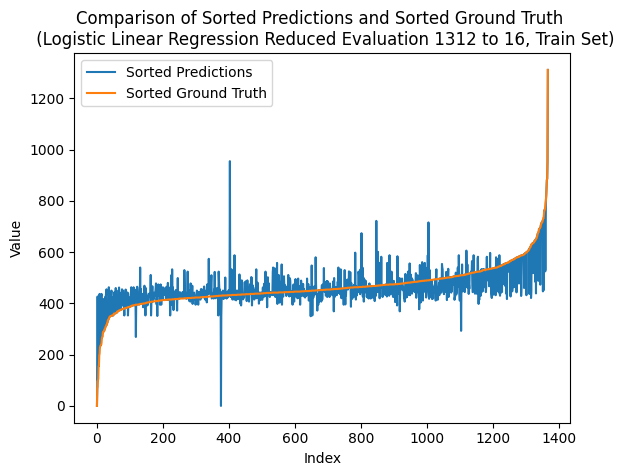

---- ---- ----
class_num = 1328
Number of unique elements: 322
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.40867925551098927
Coefficient of determination (R-squared score, R2 score): 0.13355048859934848
train eval:
Mean squared error: 0.5036549707602339
Correlation coefficient: 0.7427513164264897
Coefficient of determination (R-squared score, R2 score): 0.5209675058548009


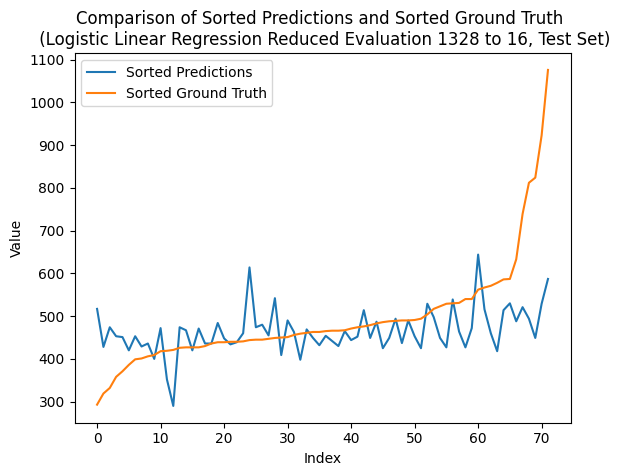

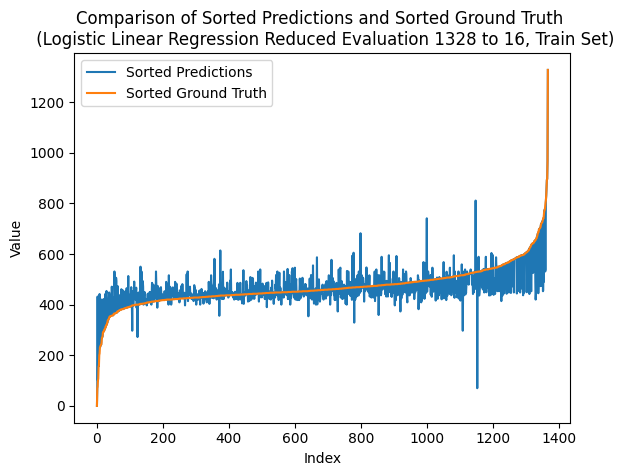

---- ---- ----
class_num = 1344
Number of unique elements: 323
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.41591941353429535
Coefficient of determination (R-squared score, R2 score): 0.14657980456026054
train eval:
Mean squared error: 0.5445906432748538
Correlation coefficient: 0.7170952686243846
Coefficient of determination (R-squared score, R2 score): 0.48203307962529274


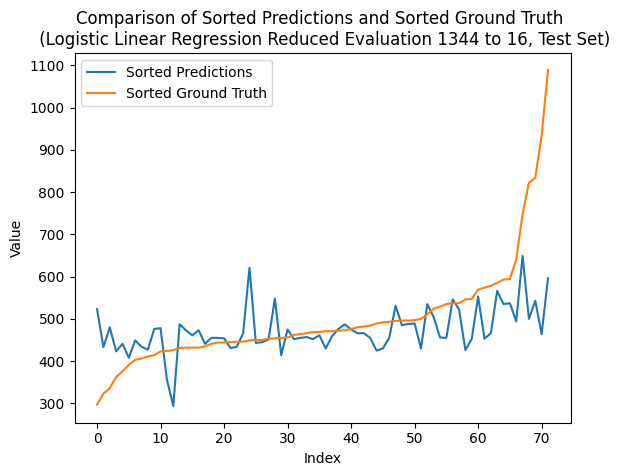

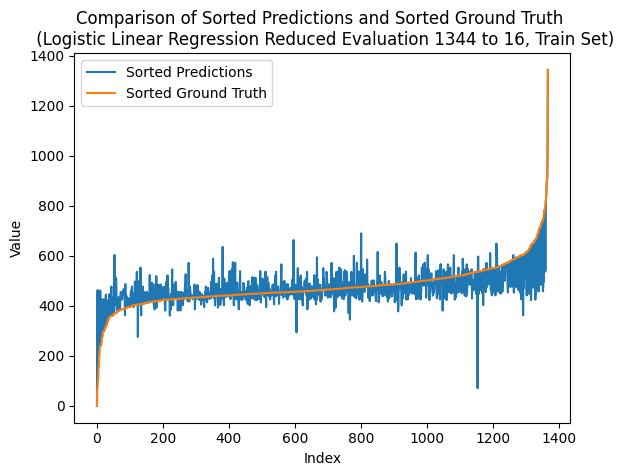

---- ---- ----
class_num = 1360
Number of unique elements: 325
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.5732360027032021
Coefficient of determination (R-squared score, R2 score): 0.2899022801302932
train eval:
Mean squared error: 0.49707602339181284
Correlation coefficient: 0.7454950420136578
Coefficient of determination (R-squared score, R2 score): 0.5272248243559718


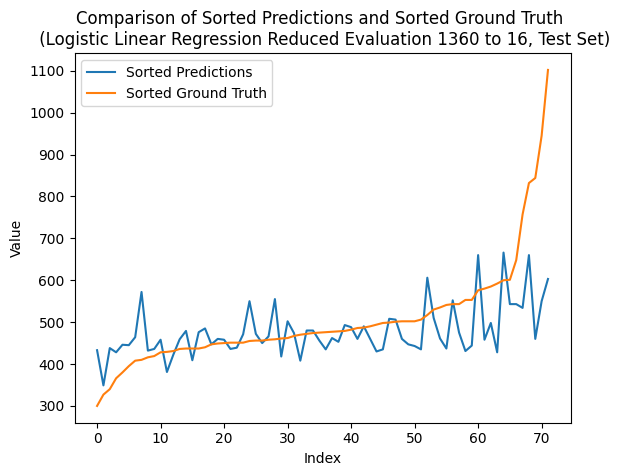

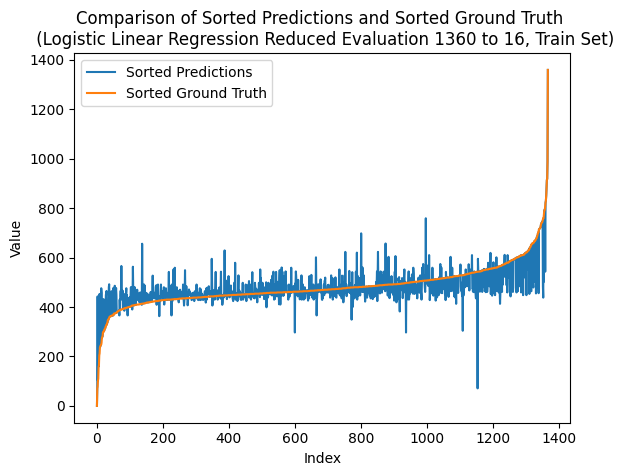

---- ---- ----
class_num = 1376
Number of unique elements: 336
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4934767358122259
Coefficient of determination (R-squared score, R2 score): 0.2247557003257329
train eval:
Mean squared error: 0.5248538011695907
Correlation coefficient: 0.7293384693945342
Coefficient of determination (R-squared score, R2 score): 0.5008050351288056


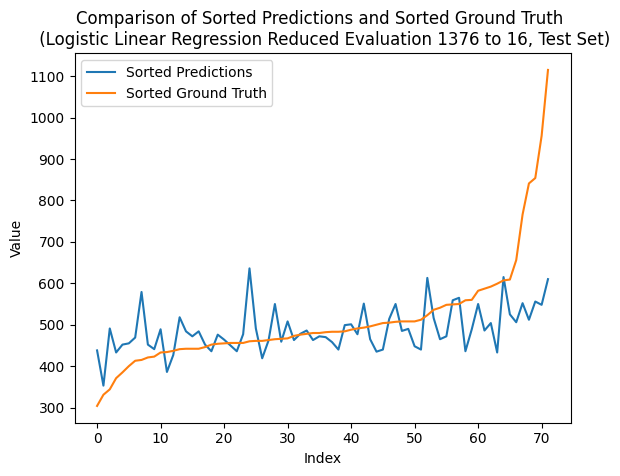

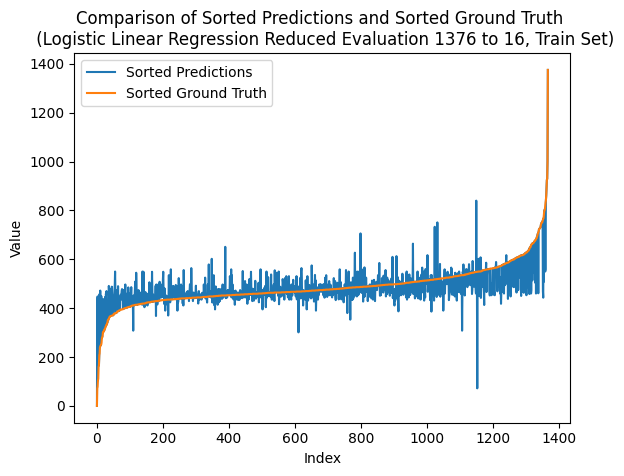

---- ---- ----
class_num = 1392
Number of unique elements: 332
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 1.4444444444444444
Correlation coefficient: 0.6039725004429368
Coefficient of determination (R-squared score, R2 score): 0.3224755700325733
train eval:
Mean squared error: 0.4992690058479532
Correlation coefficient: 0.7430089308035694
Coefficient of determination (R-squared score, R2 score): 0.5251390515222483


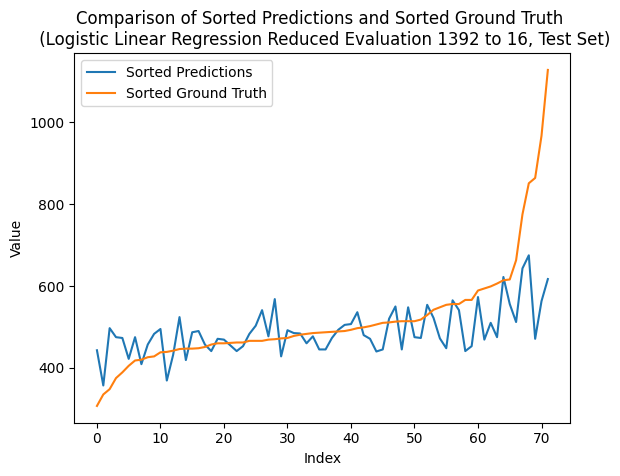

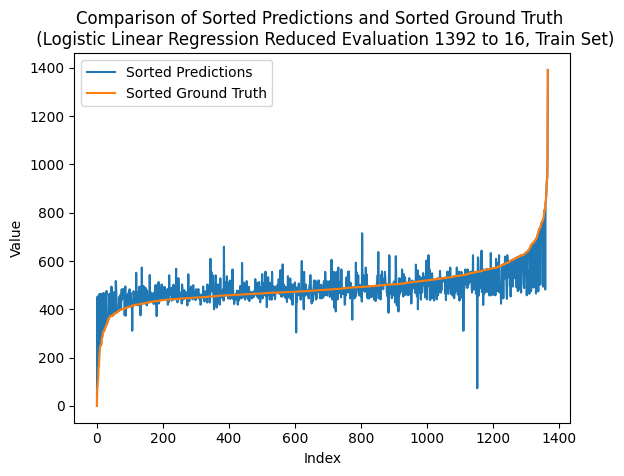

---- ---- ----
class_num = 1408
Number of unique elements: 330
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.5124049373970027
Coefficient of determination (R-squared score, R2 score): 0.250814332247557
train eval:
Mean squared error: 0.5116959064327485
Correlation coefficient: 0.7368217949709013
Coefficient of determination (R-squared score, R2 score): 0.5133196721311475


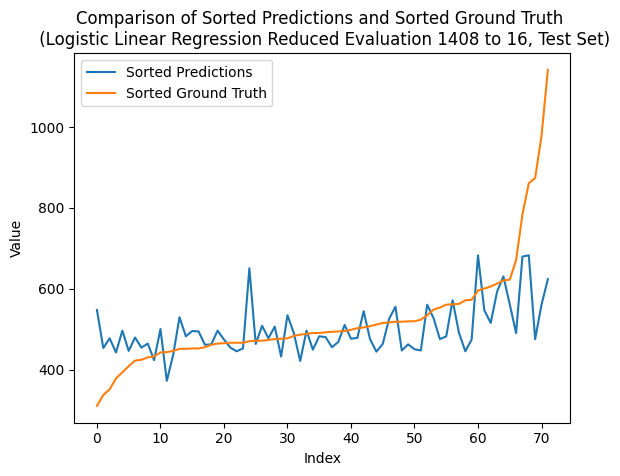

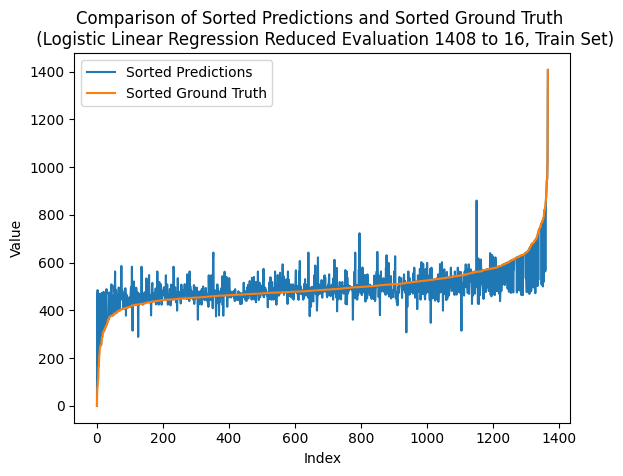

---- ---- ----
class_num = 1424
Number of unique elements: 336
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 1.6111111111111112
Correlation coefficient: 0.5125151746460512
Coefficient of determination (R-squared score, R2 score): 0.24429967426710097
train eval:
Mean squared error: 0.4692982456140351
Correlation coefficient: 0.7616797861471027
Coefficient of determination (R-squared score, R2 score): 0.5536446135831381


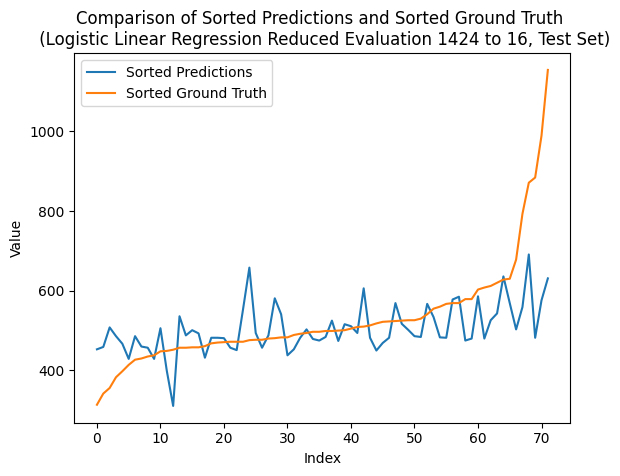

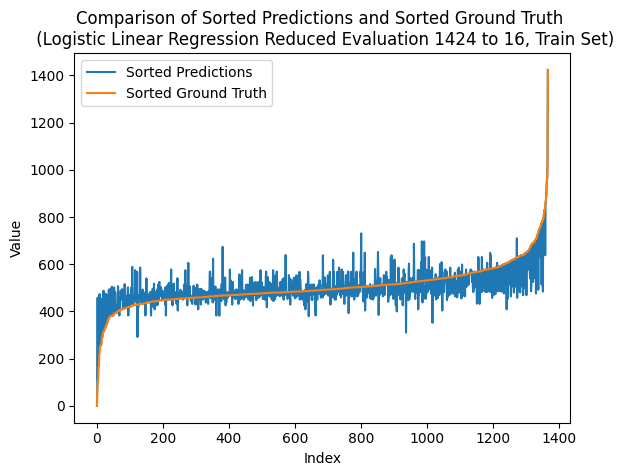

---- ---- ----
class_num = 1440
Number of unique elements: 338
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.5529543141420291
Coefficient of determination (R-squared score, R2 score): 0.2899022801302932
train eval:
Mean squared error: 0.4766081871345029
Correlation coefficient: 0.7596322252171156
Coefficient of determination (R-squared score, R2 score): 0.546692037470726


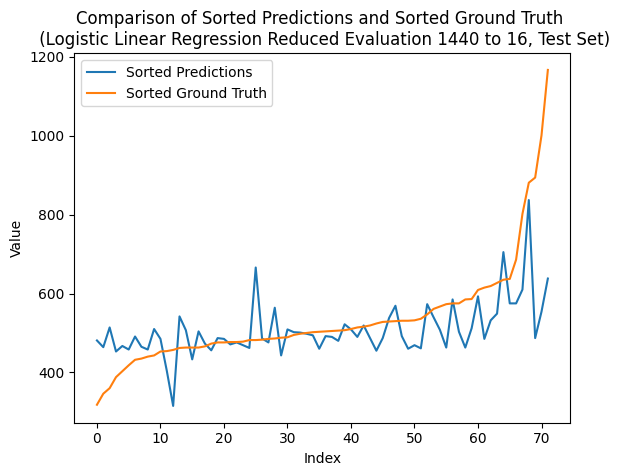

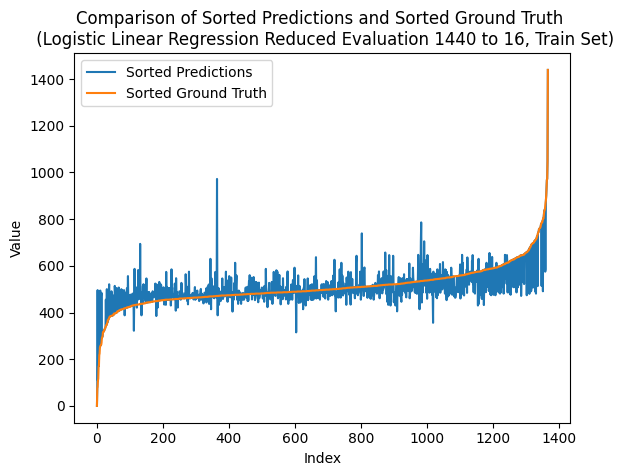

---- ---- ----
class_num = 1456
Number of unique elements: 339
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 1.5277777777777777
Correlation coefficient: 0.557360762512571
Coefficient of determination (R-squared score, R2 score): 0.28338762214983715
train eval:
Mean squared error: 0.5248538011695907
Correlation coefficient: 0.7404914711636685
Coefficient of determination (R-squared score, R2 score): 0.5008050351288056


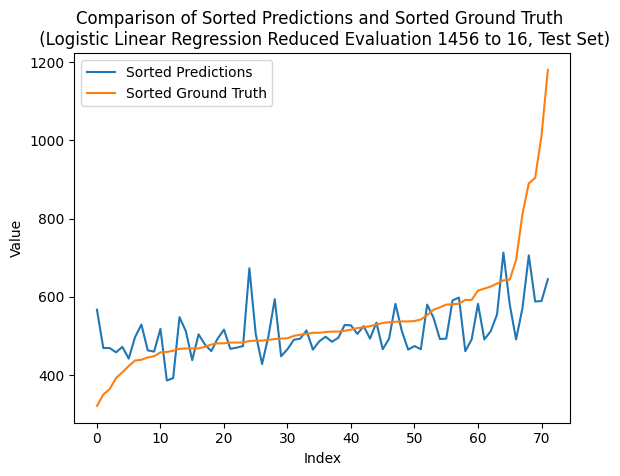

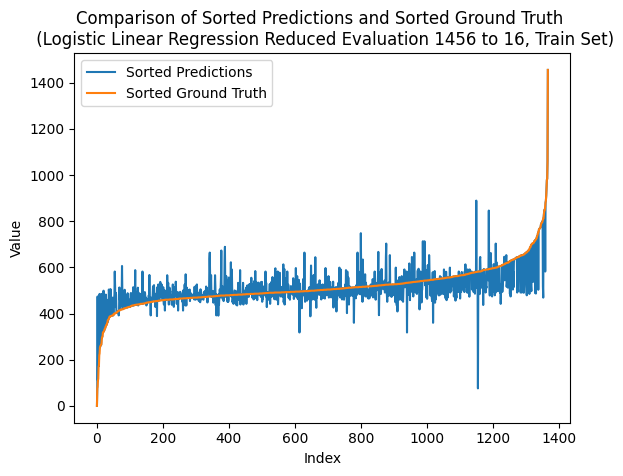

---- ---- ----
class_num = 1472
Number of unique elements: 343
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4798249355742851
Coefficient of determination (R-squared score, R2 score): 0.2052117263843648
train eval:
Mean squared error: 0.4517543859649123
Correlation coefficient: 0.7673688660050367
Coefficient of determination (R-squared score, R2 score): 0.5703307962529274


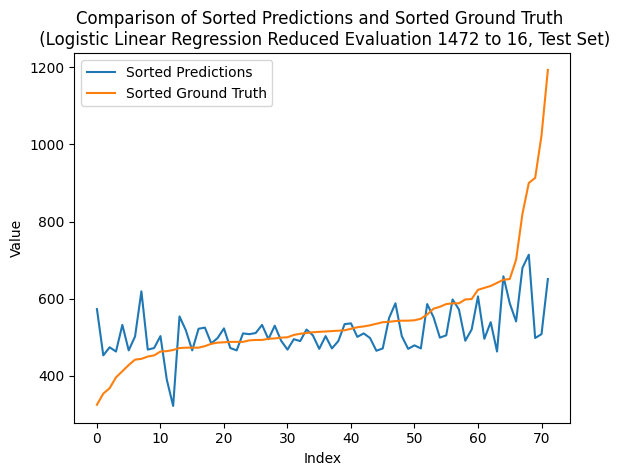

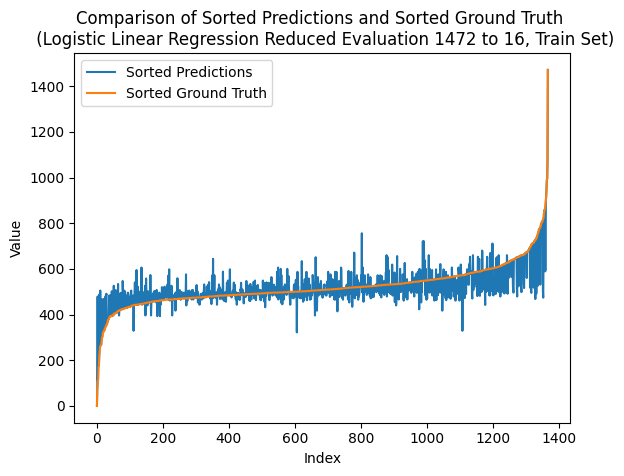

---- ---- ----
class_num = 1488
Number of unique elements: 346
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 1.5833333333333333
Correlation coefficient: 0.5215456927447392
Coefficient of determination (R-squared score, R2 score): 0.25732899022801303
train eval:
Mean squared error: 0.49853801169590645
Correlation coefficient: 0.7457225563820511
Coefficient of determination (R-squared score, R2 score): 0.5258343091334894


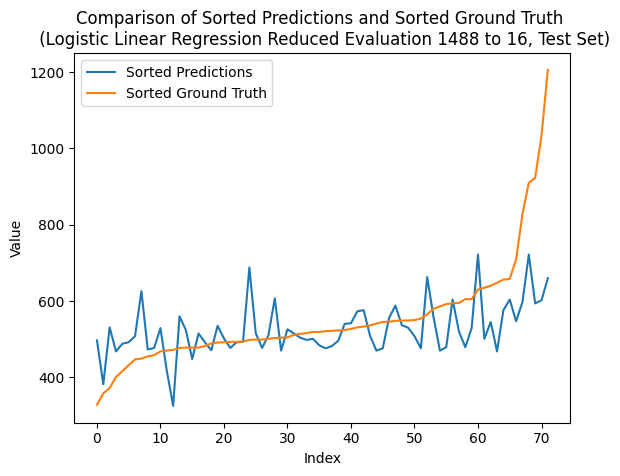

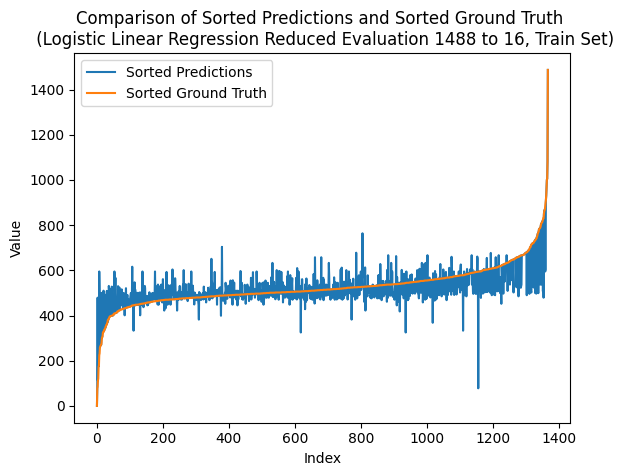

---- ---- ----
class_num = 1504
Number of unique elements: 347
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.6051098857893425
Coefficient of determination (R-squared score, R2 score): 0.3355048859934854
train eval:
Mean squared error: 0.5014619883040936
Correlation coefficient: 0.7451513079561215
Coefficient of determination (R-squared score, R2 score): 0.5230532786885246


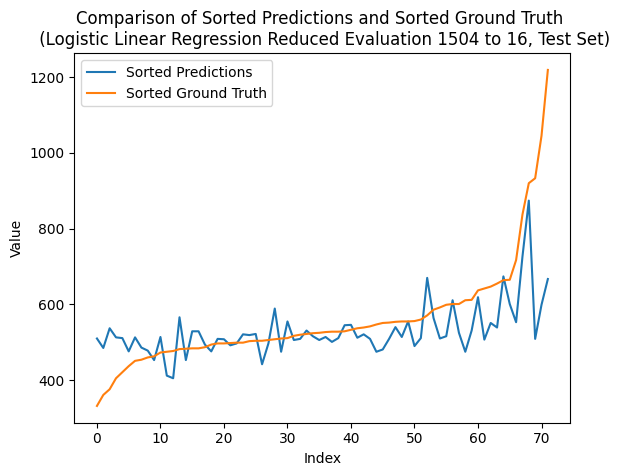

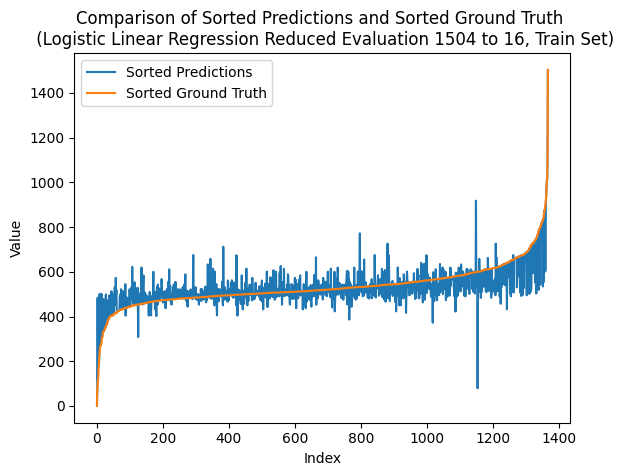

---- ---- ----
class_num = 1520
Number of unique elements: 345
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.5044589451695386
Coefficient of determination (R-squared score, R2 score): 0.23127035830618892
train eval:
Mean squared error: 0.4780701754385965
Correlation coefficient: 0.7566229997135631
Coefficient of determination (R-squared score, R2 score): 0.5453015222482436


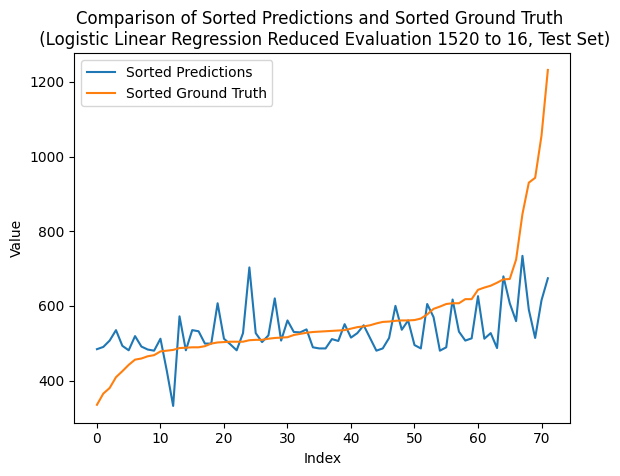

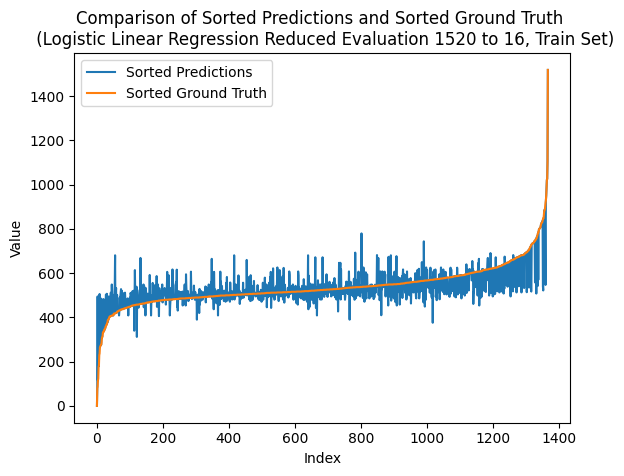

---- ---- ----
class_num = 1536
Number of unique elements: 348
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.5006800070028181
Coefficient of determination (R-squared score, R2 score): 0.23127035830618892
train eval:
Mean squared error: 0.45687134502923976
Correlation coefficient: 0.7671943190143674
Coefficient of determination (R-squared score, R2 score): 0.5654639929742389


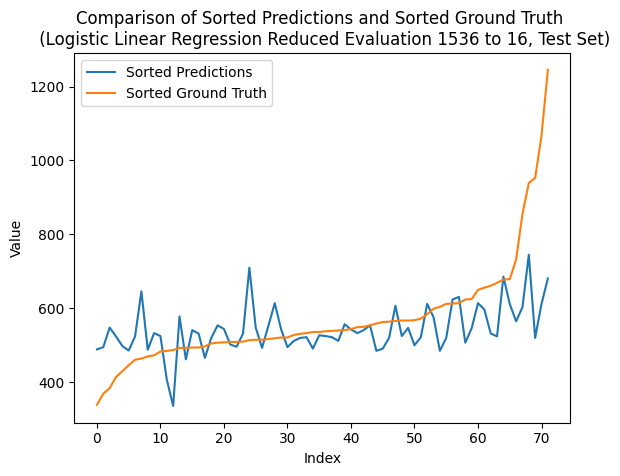

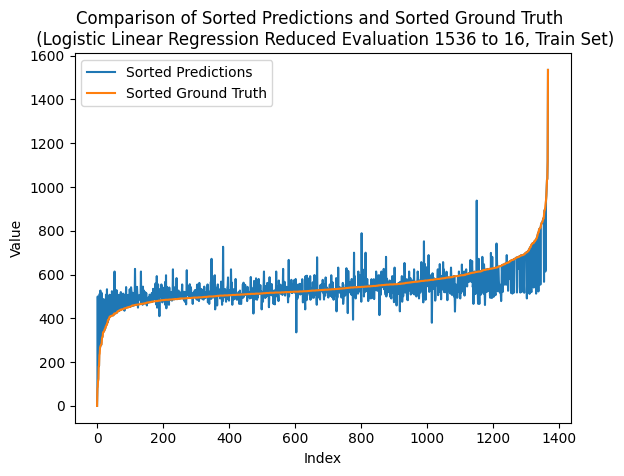

---- ---- ----
class_num = 1552
Number of unique elements: 351
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.5574537086291464
Coefficient of determination (R-squared score, R2 score): 0.2768729641693811
train eval:
Mean squared error: 0.5423976608187134
Correlation coefficient: 0.7268948493807968
Coefficient of determination (R-squared score, R2 score): 0.4841188524590164


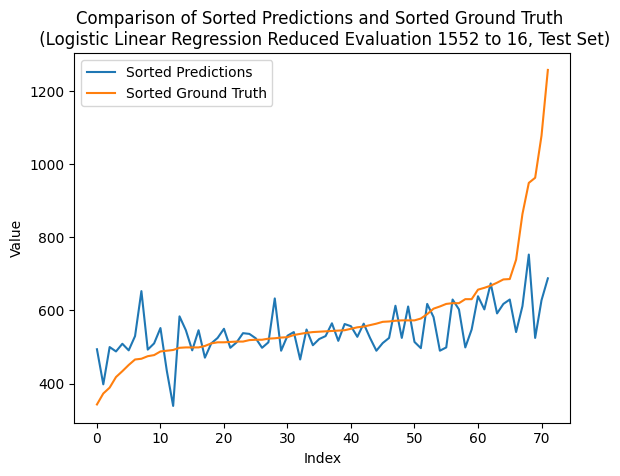

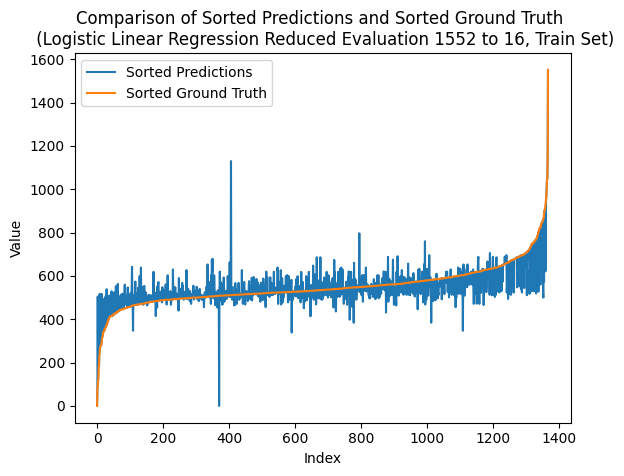

---- ---- ----
class_num = 1568
Number of unique elements: 357
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.5188033019426866
Coefficient of determination (R-squared score, R2 score): 0.250814332247557
train eval:
Mean squared error: 0.5
Correlation coefficient: 0.7488599834122254
Coefficient of determination (R-squared score, R2 score): 0.5244437939110069


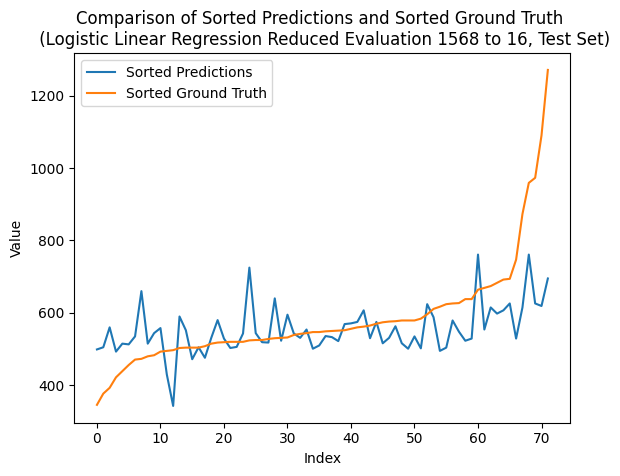

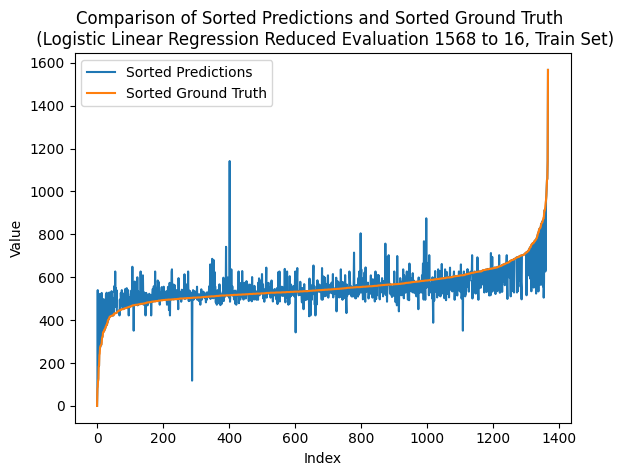

---- ---- ----
class_num = 1584
Number of unique elements: 358
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.5451912409854586
Coefficient of determination (R-squared score, R2 score): 0.2768729641693811
train eval:
Mean squared error: 0.5307017543859649
Correlation coefficient: 0.7340046821870366
Coefficient of determination (R-squared score, R2 score): 0.49524297423887587


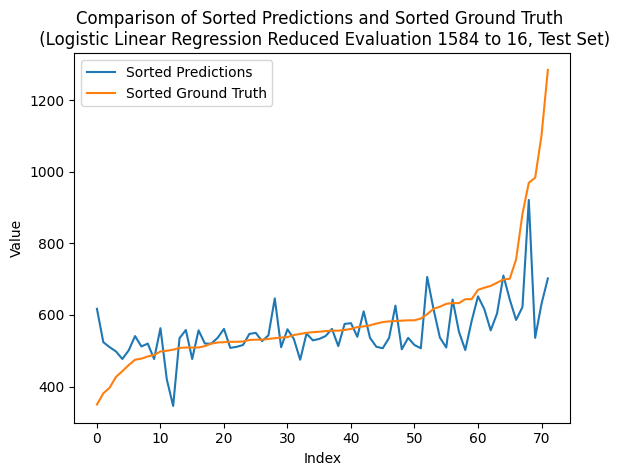

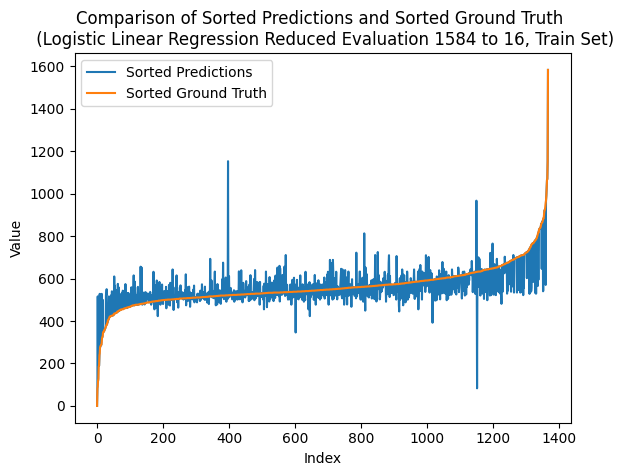

---- ---- ----
class_num = 1600
Number of unique elements: 370
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 1.6388888888888888
Correlation coefficient: 0.49248374703120623
Coefficient of determination (R-squared score, R2 score): 0.23127035830618892
train eval:
Mean squared error: 0.47953216374269003
Correlation coefficient: 0.7587951451957515
Coefficient of determination (R-squared score, R2 score): 0.5439110070257611


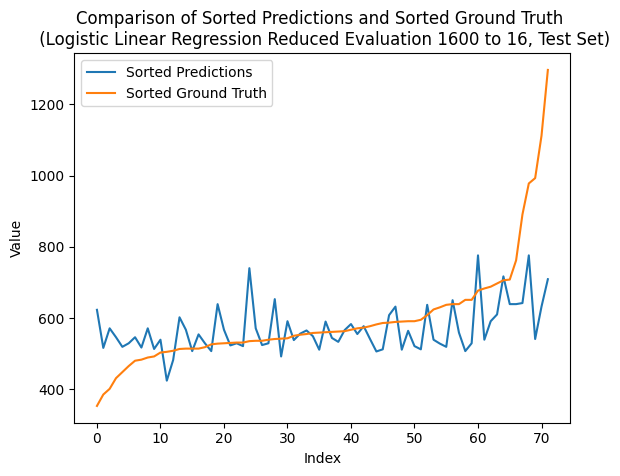

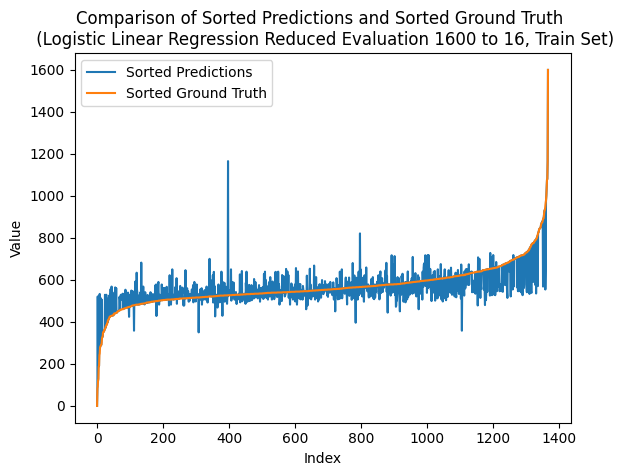

In [137]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



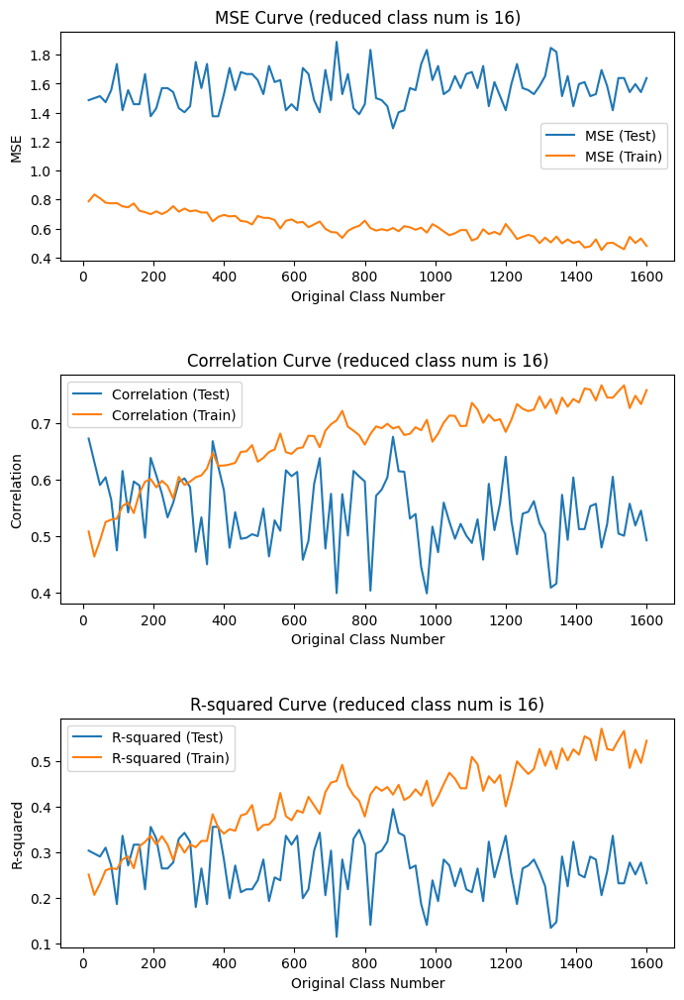

Max Index: 54
Max Original Class Num: 880


In [138]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

#### Fit and predict (balanced weights)

balanced weights don't improve the fitting, but make it worse.

In [139]:
# independent data
x = group_satcked_green

class_num = 48

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [ 0  2  3  5  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
 27 28 29 30 31 32 34 47]
Number of unique elements: 32


In [140]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, class_weight='balanced', multi_class='multinomial')
fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)
# Print the predicted class labels
print(y_pred, y_test)
print(y_pred.shape, y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(32,) (32, 23)
[13 28 22 20 10 30 15 19 19 34 13 21 11 10 13 12 10 22 23 15 13 22 15 18
 24 26 26 16 11 23  7 15 22 13 20 12 21  9 11 14 13 19 13  2 16  8 21 26
 14  5 23 12 11 20  8 23 18  8 21  3 13 26 23 10 23 12 13 23 11 11 25 21] [17 16 21 22 16 38 14 17 29 21 17 17 10 16 15 11 15 16 20 19 16 26 16 16
 15 17 16 16 15 17 16 16 33 16 15 15 20 17 20 15 15 15 19 15 15 19 18 19
 15 17 12 16 15 18 16 20 17 13 29 14 17 12 14 14 17 16 13 19 17 15 18 16]
(72,) (72,)


#### Evaluate (balanced weights)

Accuracy: 0.027777777777777776
Correlation coefficient: 0.397807708619107


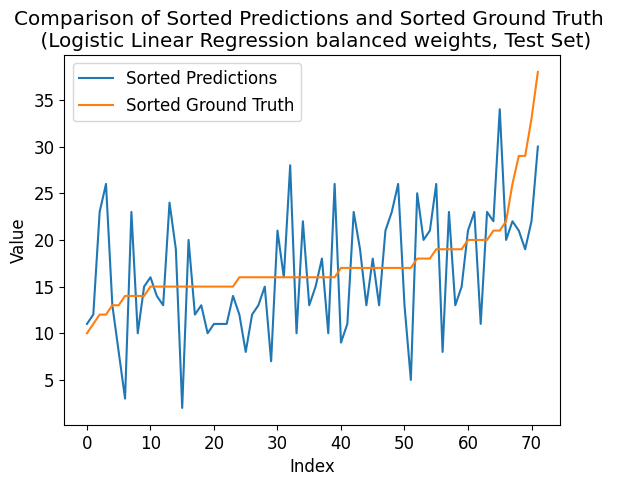

In [141]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_test, y_pred, 'Logistic Linear Regression balanced weights, Test Set')


Accuracy: 0.15350877192982457
Correlation coefficient: 0.5009246200044243


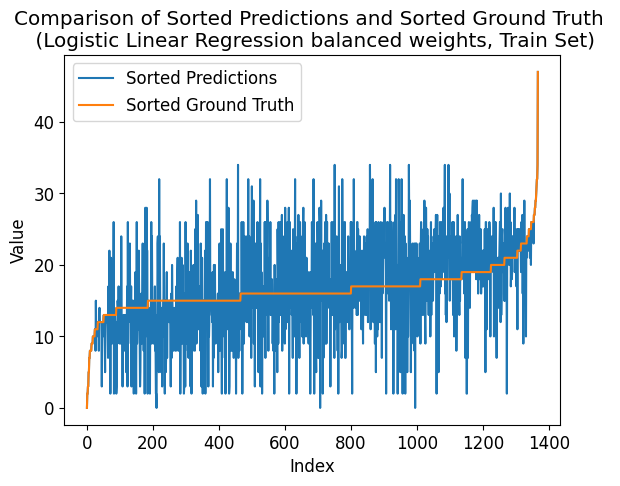

In [142]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_train, y_pred_, 'Logistic Linear Regression balanced weights, Train Set')
